In [1]:
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd
# with open('Downloads/w_parameter.npy', 'rb') as f:
#   w = np.load(f)
from tensorflow.keras.models import load_model
# load model
model=load_model('Downloads/dnn2.h5')
data=pd.read_csv("Downloads/data_hash.csv")
data=data.drop(['Unnamed: 0','id','click'],axis=1)
scaler = MinMaxScaler()
datai = scaler.fit_transform(data)
data=pd.DataFrame(datai,columns=data.columns)

2024-06-14 07:04:56.523084: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-14 07:04:56.673231: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-06-14 07:04:57.508532: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-14 07:04:57.509166: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-14 07:04:57.675323: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to

In [2]:
data

,hour,C1,banner_pos,site_id,site_domain,site_category,app_id,app_domain,app_category,device_id,...,device_type,device_conn_type,C14,C15,C16,C17,C18,C19,C20,C21
0,0.665093,0.583029,0.659226,0.646547,0.722922,0.812987,0.044811,0.785294,0.584007,0.608954,...,0.647572,0.308013,0.229073,0.488113,0.764449,0.947126,0.000000,0.272842,0.519129,0.621443
1,0.636643,0.583029,0.659226,0.031449,0.334536,0.298866,0.103826,0.469113,0.864588,0.608954,...,0.647572,0.927412,0.560408,0.488113,0.764449,0.120200,1.000000,0.315958,0.975676,0.003812
2,0.366897,0.583029,0.659226,0.143494,0.500935,0.812987,0.044811,0.785294,0.584007,0.608954,...,0.647572,0.927412,0.276883,0.488113,0.764449,0.920635,1.000000,0.707960,0.519129,0.171527
3,0.454346,0.583029,0.659226,0.031449,0.334536,0.298866,0.708573,0.584617,0.864588,0.608954,...,0.647572,0.927412,0.980182,0.488113,0.764449,0.137131,0.895102,0.311437,0.063344,0.771985
4,0.197626,0.583029,0.659226,0.924100,0.748790,0.748405,0.044811,0.785294,0.584007,0.608954,...,0.647572,0.927412,0.435723,0.488113,0.764449,0.342918,0.895102,0.707960,0.527578,0.046298
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4042891,0.327522,0.583029,0.659226,0.646547,0.722922,0.812987,0.044811,0.785294,0.584007,0.608954,...,0.647572,0.927412,0.389470,0.488113,0.764449,0.833547,0.895102,0.707960,0.519129,0.771985
4042892,0.566234,0.583029,0.659226,0.646547,0.722922,0.812987,0.044811,0.785294,0.584007,0.608954,...,0.647572,0.927412,0.596816,0.488113,0.764449,0.243890,0.895102,0.707960,0.519129,0.929994
4042893,0.227876,0.583029,0.659226,0.270700,0.752895,0.748405,0.044811,0.785294,0.584007,0.608954,...,0.647572,0.927412,0.233914,0.488113,0.764449,0.957403,1.000000,0.250214,0.061027,0.616670
4042894,0.234829,0.583029,0.659226,0.642766,0.708079,0.748405,0.044811,0.785294,0.584007,0.608954,...,0.647572,0.927412,0.657176,0.488113,0.764449,0.957403,1.000000,0.250214,0.809813,0.616670


In [3]:
# def DecimalToBinary(num):
#     if num >= 1:
#         DecimalToBinary(num // 2)
#     print(num % 2, end = '')

In [4]:
def initialize_population( num_individuals):
    """
    Khởi tạo quần thể gồm num_individuals cá thể. Mỗi cá thể có num_parameters biến.

    Arguments:
    num_individuals -- Số lượng cá thể
    num_variables -- Số lượng biến

    Returns:
    pop -- Ma trận (num_individuals, num_variables ) chứa quần thể mới được khởi tạo ngẫu nhiên.
    """
    num_propos1=22
    pop1 = np.random.randint(2, size=(num_individuals, num_propos1))
    a=np.random.randint(data.shape[0], size=(num_individuals, 1))
    arr=[]
    for i in a:
      d=np.binary_repr(int(i),width=22)
      d=', '.join(e for e in d)
      d=np.fromstring(d, dtype=int, sep=', ')
      arr.append(d)
    pop2=np.array(arr)
    pop=np.concatenate((pop1, pop2),axis=1)
    return pop

In [5]:
def fitness_ctr( ind ):
    """
    Hàm đánh giá fitness:
    + Tại đầu nhiễm sắc thể, các vị trí có giá trị =1 thì lấy giá trị tương ứng của các thuộc tính ở những vị trí ấy trong tập dữ liệu theo vị trí 10 bit của đuôi NST thể hiện
    + Tập D' = số instance có cùng giá trị tại các thuộc tính phía trên trong dataset
    + fitness = CTR(AVG) * min(D',T)
    Arguments:
    ind -- Cá thể cần được đánh giá.

    Returns:
    value -- Giá trị của cá thể ind.
    """
    head = ind[0:22]
    # print('head: '+str(head))
    end= ind[22:]
    # print('end: '+str(end))
    index= int(''.join(map(lambda end: str(int(end)), end)), 2)
    if index > data.shape[0]:
      index=int(np.random.randint(data.shape[0], size=(1, 1)))
    # print('index:'+str(index))
    subset={}
    c=0
    for i in head:
      if i == 1:
        if c==0:
          subset['hour']=data['hour'][index]
        if c==1:
          subset['C1']=data['C1'][index]
        if c==2:
          subset['banner_pos']=data['banner_pos'][index]
        if c==3:
          subset['site_id']=data['site_id'][index]
        if c==4:
          subset['site_domain']=data['site_domain'][index]
        if c==5:
          subset['site_category']=data['site_category'][index]
        if c==6:
          subset['app_id']=data['app_id'][index]
        if c==7:
          subset['app_domain']=data['app_domain'][index]
        if c==8:
          subset['app_category']=data['app_category'][index]
        if c==9:
          subset['device_id']=data['device_id'][index]
        if c==10:
          subset['device_ip']=data['device_ip'][index]
        if c==11:
          subset['device_model']=data['device_model'][index]
        if c==12:
          subset['device_type']=data['device_type'][index]
        if c==13:
          subset['device_conn_type']=data['device_conn_type'][index]
        if c==14:
          subset['C14']=data['C14'][index]
        if c==15:
          subset['C15']=data['C15'][index]
        if c==16:
          subset['C16']=data['C16'][index]
        if c==17:
          subset['C17']=data['C17'][index]
        if c==18:
          subset['C18']=data['C18'][index]
        if c==19:
          subset['C19']=data['C19'][index]
        if c==20:
          subset['C20']=data['C20'][index]
        if c==21:
          subset['C21']=data['C21'][index]
      c=c+1
    # print(subset)
    df_0=data
    for i in subset:
      d_df=df_0.loc[df_0[i]==subset[i]]
      df_0=d_df
      # print(d_df.shape)
    if d_df.shape[0] >T:
      d_df=d_df.sample(n=T)
    D=d_df.shape[0]
    y_pred = model.predict(d_df)
    y_pred = [int(round(x[0])) for x in y_pred]
#     y_pred=[]
#     for v in d_df.values:
#       s=0
#       i=0
#       for f in v:
#         if i ==1:
#           i=i+1
#           continue
#         index = int(f)+1
#         s=s+int(w[index])
#         i=i+1
#       try:
#         p=1/(1+ math.exp(s))
#       except OverflowError:
#         p=1/(1+ float('inf'))
#       y_pred.append(round(p))
    CTR=0
    for i in y_pred:
      if i ==1:
        CTR=CTR+1
    CTR_AVG= float(CTR)/float(D)
    fitness = CTR_AVG*min(D,T)
    return fitness,CTR_AVG

In [6]:
# import random
# def linear_ranking_selection(selection_size, select_press, pop_fitness):

# # selection_size: Number of individuals to be selected within the population.
# # select_press: The selection pressure when selecting individuals (between 1 and 2)
# # pop: The population which we want to select a number of individuals among them

#   pop_size = len(pop_fitness) # size of the population
#   indices = np.argsort(pop_fitness)
#   indices = np.flip(indices)
#   select = []
#   # What we do here is instead of determining the ranks for an unsorted population,
#   # we sort the population in ascending order, calculate the probabilities based on
#   # ranks (basically the indices of the sorted population starting from 1) and then
#   # pick the final individuals from the list of sorted population instead of the list
#   # of population.

#   # calculating the ranks (because we're choosing from the sorted population)
#   ranks = np.arange(1, pop_size + 1)
#   probs=[]
#   for t in range(0,len(ranks)):
#     probs.append((2 - select_press) / pop_size + 2 * (ranks[t] - 1) * (select_press - 1) / (pop_size * (pop_size- 1)))
#   # select the final individuals based on the calculated probabilities
# #   print(indices)
# #   print(probs)
#   select =random.choices(indices, probs, k = selection_size)
# #   print(select)  
#   return select

In [7]:

def variation( pop ):
    """
    Hàm biến đổi tạo ra các cá thể con.

    Arguments:
    pop -- Quàn thể hiện tại.

    Returns:
    offspring -- Quần thể chứa các cá thể con được sinh ra.
    """

    num_individuals = len(pop)
    num_parameters = len(pop[0])
    indices = np.arange(num_individuals)
    # Đảo ngẫu nhiên thứ tự các cá thể trong quần thể
    np.random.shuffle(indices)
    offspring = []

    for i in range(0, num_individuals, 2): # trong quần thể, bắt cặp 2 cá thể liền kề nhau (0,1); (2,3);,...
        idx1 = indices[i]
        idx2 = indices[i+1]
        # tạo ra 2 cá thể con từ 2 cá thể cha mẹ ban đầu
        offspring1 = list(pop[idx1])
        offspring2 = list(pop[idx2])

        # Cài đặt phép lai đồng nhất uniform crossover.
        # Không cần cài đặt đột biến mutation.
        for idx in range(0, num_parameters): # quét qua từng gene của từng cá thể
            r = np.random.rand() # ứng với mỗi vị trí gene phát sinh một số r ngẫu nhiên
            if r < 0.2: # nếu số ngẫu nhiên r < 0.2, tiến hành hoán đổi
                temp = offspring2[idx]
                offspring2[idx] = offspring1[idx]
                offspring1[idx] = temp

        offspring.append(offspring1)
        offspring.append(offspring2)

    offspring = np.array(offspring)
    return offspring

In [8]:
# def variation( pop ):
#     """
#     Hàm biến đổi tạo ra các cá thể con.

#     Arguments:
#     pop -- Quàn thể hiện tại.

#     Returns:
#     offspring -- Quần thể chứa các cá thể con được sinh ra.
#     """

#     num_individuals = len(pop)
#     for p in pop:
#       num_parameters = len(p)
#       break
#     indices = np.arange(num_individuals)
#     # Đảo ngẫu nhiên thứ tự các cá thể trong quần thể
#     np.random.shuffle(indices)
#     offspring = []
# #     Cai dat phep lai 1 diem
#     for i in range(0, num_individuals, 2): # trong quần thể, bắt cặp 2 cá thể liền kề nhau (0,1); (2,3);,...
#         idx1 = indices[i]
#         idx2 = indices[i+1]
#         # tạo ra 2 cá thể con từ 2 cá thể cha mẹ ban đầu
#         offspring1 = list(pop[idx1])
#         offspring2 = list(pop[idx2])
#         index = random.randint(0, num_parameters - 1)
#         r = np.random.rand()
#         if r < 0.2:
#           for i in range(index, num_parameters):
#             temp = offspring2[i]
#             offspring2[i] = offspring1[i]
#             offspring1[i] = temp
#         offspring.append(offspring1)
#         offspring.append(offspring2)

#     offspring = np.array(offspring)
#     return offspring

In [9]:
def better_fitness( fitness_1, fitness_2, maximization=True ):
    """
    Hàm so sánh độ thích nghi của 2 cá thể.

    Arguments:
    fitness_1 -- Độ thích nghi của cá thể 1.
    fitness_2 -- Độ thích nghi của cá thể 2.
    maximization -- Biến boolean cho biết bài toán đang giải thuộc dạng tối đa hoá (mặc định) hay không

    Returns:
    True nếu fitness_1 tốt hơn fitness_2. Ngược lại, trả về False.
    """

    if maximization:
        if fitness_1 > fitness_2:
            return True
    else:
        if fitness_1 < fitness_2:
            return True

    return False

In [10]:
def tournament_selection( pop, pop_fitness, selection_size, tournament_size=4):
    """
    Hàm chọn lọc cạnh tranh.

    Arguments:
    pop -- Quần thể để thực hiện phép chọn lọc.
    pop_fitness -- Mảng 1 chiều chứa giá trị (độ thích nghi) của từng cá thể trong quần thể.
    selection_size -- Số lượng cá thể sẽ được chọn.
    tournament_size -- Kích thước của tournament: Số lượng các cá thể được so sánh với nhau mỗi lần.

    Returns:
    selected_indices -- Chỉ số của những cá thể trong quần thể pop được chọn. Chỉ số có thể được lặp lại.
    """

    num_individuals = len(pop) # lấy ra số lượng cá thể
    indices = np.arange(num_individuals) # khai báo mảng indices để lấy chỉ số của từng các cá thể
    selected_indices = [] # danh sách chứa các chỉ số của các cá thể được lựa chọn

    while len(selected_indices) < selection_size:
        # Đảo ngẫu nhiên thứ tự các cá thể trong quần thể.
        np.random.shuffle(indices)

        for i in range(0, num_individuals, tournament_size): # quét qua số lượng cá thể trong quần thể và chia thành từng bảng đấu
            best_idx = i # cá thể tốt nhất
            for idx in range(1, tournament_size): # cho các cá thể trong bảng đấu với nhau, và chọn đứa có độ thích nghi tốt hơn
                if better_fitness(pop_fitness[indices[i+idx]], pop_fitness[indices[best_idx]]):
                    best_idx = i+idx
            selected_indices.append(indices[best_idx])

    selected_indices = np.array(selected_indices)

    return selected_indices

In [11]:
def mutation(pop, mutation_prob):
    num_individuals = len(pop)
    for p in pop:
      num_parameters = len(p)
      break
    for i in range(0, num_individuals):
        for j in range(0, num_parameters):
            r = np.random.rand()
            if r < mutation_prob:
                if pop[i][j] == 0:
                    pop[i][j] = 1
                else:
                    pop[i][j] = 0

    return pop

In [12]:
def evaluate_population( pop):
    """
    Hàm đánh giá tất cả cá thể trong quần thể.

    Arguments:
    pop -- Quàn thể cần được đánh giá.

    Returns:
    values -- Giá trị của tất cả các cá thể trong quần thể.
    """
    vl=[]
    ctravg=[]
    for ind in pop:
      values,ctr_avg=fitness_ctr(ind)
      vl.append(values)
      ctravg.append(ctr_avg)
    return vl,ctravg

In [13]:
# def genetic_algorithm(num_individuals, max_iterations):
# 
#     num_evaluations = num_individuals
#     # Khởi tạo quần thể
#     pop = initialize_population(num_individuals)
#     selection_size = len(pop)
#     best_fitness = []
#     i=1
#     while i <= max_iterations:
#         pop_fitness,pop_ctr_avg = evaluate_population(pop) # Đánh giá quần thể
#         print('Iteration: '+ str(i))
#         # print(pop)
#         print(pop_fitness)
#         # print(pop_ctr_avg)
#         print(np.max(pop_fitness))
#         # print()
#         best_fitness.append([num_evaluations,i,np.max(pop_fitness),pop[np.argmax(pop_fitness)],pop_ctr_avg[np.argmax(pop_fitness)]])
#         pool_indices = linear_ranking_selection(num_individuals//2,  elitism, np.array(pop_fitness))
#         # print(pool_indices)
#         pop = [pop[i] for i in pool_indices]
# #         pop_fitness,pop_ctr_avg = evaluate_population(pop)
# #         print(pop_fitness)
# #         print(np.max(pop_fitness))
#         # Tạo ra các cá thể con và đánh giá chúng
#         offspring = variation(pop)
#         offspring = mutation(offspring, 0.3)
#         num_evaluations += len(pop)
#         pop = np.vstack((pop,offspring)) # chồng quần thể cha mẹ và con cái lại với nhau thành quần thể pool
#         i=i+1
#     # best_fitness.append([num_evaluations,i,np.max(pop_fitness),pop[np.argmax(pop_fitness)]])
#     return (pop, pop_fitness, best_fitness)

In [14]:
def popop(num_individuals, max_iterations):
    """
    Hàm cài đặt thuật giải di truyền theo các bước P->O->(P+O)->P
    Arguments:
    num_individuals -- Số lượng cá thể trong quần thể.
    num_parameters -- Số lượng biến.
    num_generations -- Số thế hệ thuật toán sẽ chạy.
    """
    num_evaluations = num_individuals
    # Khởi tạo quần thể
    pop = initialize_population(num_individuals)
    pop = initialize_population(num_individuals)
    pop_fitness,pop_ctr_avg = evaluate_population(pop) # Đánh giá quần thể
    print("#Gen 0:")
    # Sử dụng tournament_size 4 và selection_size là bằng kích thước quần thể
    selection_size = len(pop)
    tournament_size = 4
    best_fitness = []
    i=1
    while i <= max_iterations:
        print(pop_fitness)
        print(np.max(pop_fitness))
        best_fitness.append([num_evaluations,i,np.max(pop_fitness),pop[np.argmax(pop_fitness)],pop_ctr_avg[np.argmax(pop_fitness)]])
        # Tạo ra các cá thể con và đánh giá chúng
        offspring = variation(pop)
        offspring= mutation(offspring, 0.3)
        offspring_fitness,offspring_ctr_avg = evaluate_population(offspring)
        num_evaluations += len(offspring)
        # Tạo ra quần thể pool gồm quần thể hiện tại pop và offspring
        pool = np.vstack((pop,offspring)) # chồng quần thể cha mẹ và con cái lại với nhau thành quần thể pool
        pool_fitness = np.hstack((pop_fitness, offspring_fitness))

        # Thực hiện tournament selection trên quần thể pool
        pool_indices = tournament_selection(pool, pool_fitness, selection_size, tournament_size)
        
        # Thay thế quần thể hiện tại bằng những cá thể được chọn ra từ pool.
        pop = pool[pool_indices, :]
        pop_fitness = pool_fitness[pool_indices]
        i=i+1
        
    best_fitness.append([num_evaluations,i,np.max(pop_fitness),pop[np.argmax(pop_fitness)],pop_ctr_avg[np.argmax(pop_fitness)]])
    return (pop, pop_fitness, best_fitness)

In [15]:
n_trials = 10
import math
T=2000
num_individuals= 256
max_iterations=100
fits_truncation = []
evals = []
best_fitness_iter=[]
best_fitness_top1=[]
best_fitness_features=[]
exp=[]
ctr_avg=[]
len_ft=[]
for j in range(0,n_trials):
    print('Trial: '+ str(j))
    pop, pop_fitness, best_fitness = popop(num_individuals,max_iterations)
    t=[]
    for i in best_fitness:
      best_fitness_iter.append(i[1])
      t.append(i[2])
      best_fitness_top1.append(i[2])
      exp.append(j)
      arr=[]
      y=3
      pop=i[3]
      for e in pop[0:22]:
        if e==1:
          arr.append(y)
        y=y+1
      best_fitness_features.append(arr)
      len_ft.append(len(arr))
      ctr_avg.append(i[4])
    if j == 0:
        evals = np.array(best_fitness_iter)
    fits_truncation.append(t)

Trial: 0
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 18ms/step
#Gen 0:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

15/15 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2. 68.  0.  0.  0.  0.  1.
  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.
  0.  0. 62.  0.  0.  0.  0.  0.  0.  0.  0.  9.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.
  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.
  0.  0.  0.  0.  0.  0. 68.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  1.  0.  0.  1.  0.  0.  0.  2.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.
  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.
  0.  0.  1.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.

26/26 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 52ms/step
[ 0.  0.  0.  0.  0.  2.  0.  0.  9.  0.  0.  0.  0. 62.  0.  0.  0.  1.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  1.  0.  0.  0.  0.  1.  0.  0.  0.  0. 62.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  2.  0.  0.  1.  0.  0.  0.  0.  4.  0.  0. 68.
  0.  1.  0.  0.  0.  0.  1.  0.  0.  0.  0.  9.  0.  0.  0.  0.  0.  0.
  4.  0.  1.  4.  0.  0.  1.  2.  0.  0.  0.  0.  0.  0.  1.  1.  1.  0.
  0.  0.  0.  1. 68.  0.  0.  1.  0.  0.  4.  0.  1.  0.  0.  1.  0.  0.
  1.  1.  0.  0.  0.  0.  0.  0.  0.  1. 68.  0.  4.  0.  0.  0.  0.  0.
  0.  0.  1.  0.  0. 68.  0.  0.  0.  0.  0.  1.  0.  0.  1.  0.  0.  0.
  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  1.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  2.  0.  0.  0.  0.  0.
  1.  0.  0.  0.  0.  0.  2.  0.  0.  0.  1.  0. 62.  0.  0.  0.  0.  0.
  9.  0.  1.  1.  0.  1.  0.  0.  0.  0.  4.  0.  0.  2.  0.  0.  1.  4.

27/27 [==============================] - 0s 1ms/step
[0.000e+00 9.000e+00 0.000e+00 0.000e+00 2.000e+00 0.000e+00 1.000e+00
 0.000e+00 0.000e+00 0.000e+00 6.800e+01 9.000e+00 0.000e+00 1.000e+00
 0.000e+00 0.000e+00 1.000e+00 0.000e+00 1.000e+00 1.000e+00 0.000e+00
 0.000e+00 0.000e+00 6.200e+01 2.000e+00 0.000e+00 9.000e+00 0.000e+00
 1.000e+00 0.000e+00 1.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 1.000e+00 1.000e+00 4.000e+00 1.600e+01 0.000e+00 0.000e+00 1.000e+02
 0.000e+00 0.000e+00 0.000e+00 1.000e+00 6.800e+01 0.000e+00 0.000e+00
 6.200e+01 0.000e+00 1.000e+00 1.000e+00 1.000e+00 0.000e+00 0.000e+00
 1.000e+00 0.000e+00 1.000e+01 0.000e+00 2.000e+00 4.000e+00 0.000e+00
 0.000e+00 0.000e+00 2.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 1.000e+00 0.000e+00 0.000e+00 4.000e+00 4.000e+00 0.000e+00 6.200e+01
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+00
 0.000e+00 1.000e+00 1.999e+03 9.000e+00 0.000e+00 1.000e+00 6.800e+01
 0.000e+00 4.000e+00 1.0

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00
 0.000e+00 1.000e+00 1.000e+00 4.000e+00 6.200e+01 9.000e+00 4.000e+00
 6.200e+01 0.000e+00 1.999e+03 0.000e+00 1.000e+00 0.000e+00 6.800e+01
 1.000e+02 0.000e+00 9.000e+00 1.000e+00 4.000e+00 6.800e+01 0.000e+00
 5.000e+00 1.000e+00 2.000e+00 1.000e+00 6.800e+01 0.000e+00 0.000e+00
 1.000e+02 1.000e+01 1.000e+00 0.000e+00 0.000e+00 0.000e+00 9.000e+00
 0.000e+00 2.000e+00 0.000e+00 2.000e+00 0.000e+00 1.000e+00 0.000e+00
 0.000e+00 0.000e+00 6.200e+01 0.000e+00 0.000e+00 0.000e+00 1.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.600e+01 1.000e+01 0.000e+00 0.000e+00
 1.000e+00 0.000e+00 4.000e+00 0.000e+00 1.000e+00 1.000e+00 9.000e+00
 0.000e+00 0.000e+00 0.000e+00 4.000e+00 9.000e+00 6.200e+01 1.000e+00
 1.000e+00 6.200e+01 1.000e+00 6.800e+01 0.000e+00 1.000e+00 0.000e+00
 6.950e+02 0.000e+00 4.000e+00 0.000e+00 0.000e+00 4.000e+00 2.000e+00
 4.000e+00 6.800e+01 1.00

1/1 [==============================] - 0s 18ms/step


63/63 [==============================] - 0s 1ms/step
[4.000e+00 9.000e+00 4.000e+00 1.999e+03 6.200e+01 4.000e+00 0.000e+00
 0.000e+00 1.600e+01 1.300e+01 9.000e+00 6.200e+01 0.000e+00 1.000e+00
 1.000e+01 1.000e+00 0.000e+00 9.000e+00 1.000e+00 6.200e+01 4.000e+00
 0.000e+00 9.000e+00 0.000e+00 0.000e+00 1.000e+00 4.000e+00 1.000e+00
 4.000e+00 0.000e+00 1.000e+00 9.000e+00 1.000e+00 1.000e+02 1.000e+01
 9.000e+00 9.000e+00 2.000e+00 6.800e+01 1.000e+00 6.800e+01 6.800e+01
 1.000e+00 6.800e+01 4.000e+00 0.000e+00 2.000e+00 1.600e+01 1.000e+00
 6.800e+01 2.000e+00 1.000e+00 2.000e+00 0.000e+00 6.200e+01 6.800e+01
 4.000e+00 1.000e+00 0.000e+00 0.000e+00 6.950e+02 6.950e+02 1.000e+00
 1.000e+01 1.000e+00 1.000e+00 0.000e+00 4.000e+00 1.000e+00 1.000e+00
 1.000e+00 6.800e+01 4.000e+00 5.000e+00 0.000e+00 6.200e+01 4.000e+00
 1.600e+01 6.200e+01 0.000e+00 2.000e+00 9.000e+00 4.000e+00 1.000e+02
 1.000e+02 0.000e+00 1.000e+00 4.000e+00 1.000e+00 1.600e+01 1.000e+00
 0.000e+00 1.000e+02 6.8

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 19ms/step
[0.000e+00 4.000e+00 1.999e+03 2.000e+00 6.800e+01 6.200e+01 1.999e+03
 9.000e+00 1.000e+00 1.000e+00 9.000e+00 6.200e+01 1.999e+03 1.000e+02
 0.000e+00 2.000e+00 2.000e+00 0.000e+00 1.000e+00 9.000e+00 6.200e+01
 6.800e+01 6.200e+01 6.200e+01 6.800e+01 0.000e+00 2.000e+00 1.000e+00
 1.000e+00 0.000e+00 9.000e+00 1.600e+01 0.000e+00 2.000e+00 6.200e+01
 6.800e+01 1.000e+02 6.200e+01 1.999e+03 6.800e+01 9.000e+00 2.000e+00
 4.000e+00 0.000e+00 5.000e+00 4.000e+00 6.200e+01 1.000e+00 6.800e+01
 2.000e+00 1.999e+03 1.000e+00 6.800e+01 0.000e+00 4.000e+00 4.000e+00
 6.200e+01 2.000e+00 9.000e+00 2.000e+03 0.000e+00 1.000e+00 6.200e+01
 9.000e+00 1.000e+02 6.800e+01 0.000e+00 6.800e+01 2.000e+03 6.800e+01
 6.950e+02 1.000e+00 6.200e+01 7.300e+01 9.000e+00 9.000e+00 1.000e+01
 6.800e+01 6.200e+01 1.000e+02 6.800e+01 5.500e+01 6.800e+01 1.600e+01
 0.000e+00 6.200e+01 0.000e+00 1.999e+03 9.000e+00 6.800e+01 4.000e+00
 6.800e+01 2.000e+00 6.80

1/1 [==============================] - 0s 23ms/step


63/63 [==============================] - 0s 2ms/step
[1.999e+03 6.200e+01 6.800e+01 1.999e+03 9.000e+00 0.000e+00 0.000e+00
 1.999e+03 6.800e+01 6.200e+01 6.950e+02 0.000e+00 1.999e+03 1.000e+02
 6.200e+01 4.000e+00 0.000e+00 4.000e+00 9.500e+01 1.999e+03 6.800e+01
 6.200e+01 0.000e+00 9.000e+00 6.950e+02 6.950e+02 1.000e+00 0.000e+00
 1.999e+03 6.800e+01 1.999e+03 1.999e+03 0.000e+00 6.800e+01 1.000e+01
 6.200e+01 6.200e+01 2.000e+03 0.000e+00 6.800e+01 9.000e+00 1.999e+03
 4.000e+00 9.300e+01 1.000e+02 1.999e+03 6.800e+01 9.000e+00 0.000e+00
 6.800e+01 1.890e+02 1.600e+01 6.200e+01 4.000e+00 6.200e+01 9.000e+00
 1.600e+01 6.950e+02 6.800e+01 6.800e+01 6.950e+02 6.800e+01 6.800e+01
 0.000e+00 1.000e+00 0.000e+00 1.999e+03 6.800e+01 6.800e+01 4.000e+00
 6.800e+01 6.800e+01 6.800e+01 1.000e+01 7.300e+01 9.000e+00 2.000e+00
 6.200e+01 1.000e+00 6.800e+01 6.200e+01 0.000e+00 2.000e+03 1.000e+01
 6.200e+01 6.200e+01 9.000e+00 2.000e+03 1.999e+03 2.000e+00 7.300e+01
 0.000e+00 6.950e+02 6.8

31/31 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 18ms/step
[1.999e+03 6.950e+02 1.890e+02 6.800e+01 0.000e+00 6.950e+02 6.800e+01
 6.800e+01 6.800e+01 1.999e+03 6.800e+01 1.000e+02 6.800e+01 1.999e+03
 6.200e+01 4.000e+00 2.000e+03 1.000e+02 1.999e+03 6.200e+01 1.000e+02
 6.800e+01 6.800e+01 6.200e+01 6.800e+01 1.999e+03 0.000e+00 9.000e+00
 1.999e+03 7.300e+01 6.800e+01 2.000e+03 6.800e+01 6.800e+01 6.800e+01
 6.200e+01 1.999e+03 6.950e+02 1.000e+02 6.800e+01 6.200e+01 1.999e+03
 6.800e+01 4.000e+00 6.800e+01 0.000e+00 2.000e+03 5.000e+00 1.999e+03
 1.999e+03 6.200e+01 1.000e+02 1.999e+03 1.000e+02 1.504e+03 0.000e+00
 6.200e+01 6.950e+02 1.999e+03 0.000e+00 7.300e+01 0.000e+00 6.800e+01
 1.999e+03 6.200e+01 7.300e+01 1.000e+02 6.800e+01 1.999e+03 6.950e+02
 6.950e+02 1.999e+03 4.000e+00 1.999e+03 0.000e+00 6.800e+01 1.160e+02
 6.800e+01 1.999e+03 6.950e+02 3.500e+01 1.600e+01 0.000e+00 1.000e+02
 6.950e+02 6.200e+01 2.000e+03 9.000e+00 9.300e+01 6.800e+01 1.999e+03
 6.800e+01 1.999e+03 2.00

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[2000.   68. 1999. 1999. 1999.  189.  100.   68.  695. 1999.   10.   68.
  100.   68. 1999.   62.  189.  100.    0.   82. 2000. 2000.  189. 1999.
   82.   62. 1999.   68. 1999.   68.   68.  100.    4. 1999.  100. 1999.
 1999. 1999. 1999. 1999.  359. 1999.   68. 1999.   62.   68.  205.  695.
    0.  100. 2000.    0. 1999.    2.  695.   62. 1999.    0.  100.   68.
  359.  695.   68.  695. 1999. 1999.   73. 2000. 2000.    0. 1999.  695.
   95. 1999.   62. 1999. 1999.   62. 2000.  695. 2000. 1999. 2000. 2000.
   45.   68.  116.  100. 2000.  100.   68. 2000. 1999. 1999.   62. 1999.
 1999.  100.  695. 2000.  695. 2000. 2000.    0. 1999.  695.  100. 2000.
 1999. 1999. 1999. 1504.   73.   68. 1999. 1999.   16.  100. 1999.    0.
    0. 1999.   68.    0.  695.  695. 1999.  695.    9.   82.  116.   68.
  695.  695.   68. 1999.    0.    0. 2000.  100.   68. 1999.   68.   93.
 2000. 1999.  100.   86.   68. 1999. 2000.  100. 1999.  695.   68.  695

1/1 [==============================] - 0s 17ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 1999. 2000. 1999. 2000.  189. 2000.   68. 1999.  695.  100. 2000.
  100.  695. 1999.  695.  100. 1999.   68. 2000. 1999. 1999.  100. 1999.
 1999. 1999. 1999.  695. 1999.  695. 1999.  100. 2000. 1999. 2000. 2000.
 2000. 1999.   68. 1999.    0. 1999. 2000. 1999. 1999. 2000. 1999. 2000.
   82. 1999. 1999.    0. 2000. 1999. 2000. 1999.  695.  100.    0.    0.
   45.  100. 1999. 1999. 1999.  100. 2000. 1999. 2000. 1999. 1999. 2000.
 1999.  189.    0.  695.   93.  100.  116.  695. 1999. 2000.   68. 1999.
 2000. 1999.   62. 1999. 1999. 1999. 2000. 1999. 2000.    0. 1999. 2000.
   62. 1999. 2000. 2000.  695. 1999. 1999.  100. 1999. 1999.    0. 1999.
 1999.   73. 2000.    0. 2000.    0.  116. 2000.  695.    0. 1999.   95.
    0. 1999. 1999.  695.    0. 1999. 2000. 1999. 1999. 2000.  100. 1999.
    0.    0. 1999. 1999. 2000. 1999. 2000.  100.   62. 2000. 1999.  695.
    0.  695.    0.  100.  695.  116. 1999.  189.    0. 2000.    0.    0

24/24 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 20ms/step
[2.000e+03 0.000e+00 6.950e+02 6.800e+01 6.950e+02 2.000e+03 2.000e+03
 1.999e+03 1.160e+02 2.000e+03 6.950e+02 1.999e+03 1.000e+02 1.999e+03
 2.000e+03 1.999e+03 2.000e+03 1.999e+03 6.200e+01 2.000e+03 6.950e+02
 2.000e+03 1.000e+02 2.000e+03 1.999e+03 0.000e+00 0.000e+00 1.999e+03
 1.999e+03 2.000e+03 1.160e+02 6.950e+02 1.999e+03 2.000e+03 1.999e+03
 1.999e+03 1.999e+03 8.200e+01 2.000e+03 2.000e+03 0.000e+00 1.999e+03
 0.000e+00 2.000e+03 1.999e+03 1.999e+03 1.999e+03 1.999e+03 2.000e+03
 0.000e+00 1.999e+03 1.999e+03 1.999e+03 1.999e+03 1.999e+03 6.950e+02
 0.000e+00 1.999e+03 2.000e+03 1.314e+03 1.890e+02 2.000e+03 1.999e+03
 1.999e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 1.969e+03 2.000e+03
 1.999e+03 1.999e+03 2.000e+03 1.999e+03 1.999e+03 1.999e+03 6.950e+02
 0.000e+00 2.000e+03 2.000e+03 6.950e+02 2.000e+03 1.999e+03 1.999e+03
 2.000e+03 2.000e+03 1.999e+03 0.000e+00 2.000e+03 2.000e+03 1.999e+03
 6.800e+01 2.000e+03 2.00

7/7 [==============================] - 0s 1ms/step
[2000. 2000. 1999. 2000. 2000. 1999. 2000.  695. 2000. 2000. 2000.    0.
 1999. 1999. 2000. 2000. 1999. 2000. 1999. 2000.  100. 1999. 2000. 1999.
 2000. 1999. 2000. 2000. 2000. 1999. 1999.    0. 1999. 1999. 2000.    0.
 2000. 1999. 2000.    0. 2000. 2000. 2000.    0. 1999. 2000. 2000. 2000.
 1999. 1999.  695. 2000. 2000. 2000. 1999. 1999. 2000. 2000.   71. 2000.
 1999. 2000. 2000. 1999. 1999. 1999. 1999. 1999. 2000. 2000. 2000.  695.
 2000. 2000. 1999. 1999. 2000. 2000.    0. 1999. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 1999.  318. 2000. 2000.    0.    0. 1999.    0.
 2000. 2000. 1999. 2000. 1999. 1999.  116. 2000. 1999.    0. 2000. 2000.
  695. 2000. 2000. 2000. 1314.    0. 2000. 1999. 2000. 2000. 1999. 2000.
  695. 2000. 1999. 2000. 2000. 1999. 2000. 1999. 2000. 2000. 2000. 2000.
 2000. 1999. 2000. 2000. 2000. 2000. 1999. 2000. 1999. 2000. 2000. 1999.
 2000. 2000. 2000. 1999. 2000. 1999. 1999. 2000. 2000. 2000. 2000.    0.


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 1999. 2000. 2000. 2000. 2000. 2000. 2000. 1999. 2000. 1999.
 2000.    0. 1999. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1999. 1999.
 2000. 1999. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
  695.    0.  695. 1999. 2000.    0. 1999.    0. 2000. 2000. 2000. 1999.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1999.
 1999. 2000. 2000.  695. 2000. 2000.    0. 2000. 2000. 2000. 1999. 2000.
 1999. 2000. 1999. 2000. 2000. 1999. 2000. 1999. 2000. 2000. 2000.    0.
 2000. 1999. 2000. 2000. 2000.  695. 2000. 2000. 2000. 2000. 1999.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 1999. 2000.
 1314. 2000. 2000. 2000. 2000. 1999. 1999. 2000. 2000. 2000. 1999. 2000.
 2000. 1999. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
  695. 1999. 2000. 2000. 2000. 1999. 2000. 2000. 1999. 2000. 2000. 2000.

14/14 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 1999. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1999. 1999. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.  695. 2000. 1999. 2000. 2000.    0.    0.  695.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 1999. 1999. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 1999. 2000. 2000. 2000. 1999. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 1999. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  695. 2000.
 2000. 1999. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    9.    0. 2000. 2000. 1999. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

3/3 [==============================] - 0s 2ms/step


2/2 [==============================] - 0s 3ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 9.000e+00 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.999e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.999e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+0

1/1 [==============================] - 0s 29ms/step


24/24 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    2. 2000.  764. 2000. 2000.  214. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

29/29 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 7.640e+02 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

63/63 [==============================] - 0s 1ms/step


3/3 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 3.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+

17/17 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 1998.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.   79.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 1.992e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 0.000e+00 7.800e+01 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.000e+00 2.00

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 1992.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

2/2 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 19ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 9.00e+00 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 19ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

6/6 [==============================] - 0s 1ms/step


2/2 [==============================] - 0s 3ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.   33. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 18ms/step


28/28 [==============================] - 0s 2ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   35.
 2000.    0. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000

1/1 [==============================] - 0s 20ms/step


7/7 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 3.5e+01 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03


1/1 [==============================] - 0s 18ms/step


12/12 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    2.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 18ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 1.070e+02 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 1.531e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.00

4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 21ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 3.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.04e+02 2.00e+03 0.00e+00 2.00e+03 2.00e+03

1/1 [==============================] - 0s 23ms/step


4/4 [==============================] - 0s 2ms/step
[0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 1.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 18ms/step
[   0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    4.    0.  785. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 23ms/step


16/16 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 1043. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.  856. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 1043.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.  422.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1595. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000

6/6 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 1595. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    3. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

9/9 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    3. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000.  891. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000

9/9 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 23ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    3.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    6. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.  193.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


61/61 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.  193. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.  193. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   59. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    3. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    2.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000

49/49 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.   59. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.  924. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 28ms/step


63/63 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 17ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 0.e+00
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 26ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

2/2 [==============================] - 0s 3ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03


63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000.    0. 2000. 2000.    9. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 1650.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.  209.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    4. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.    0.

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.  209. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    4. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 34ms/step


18/18 [==============================] - 0s 3ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    4. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 5.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

17/17 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 23ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.    0.  197. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


3/3 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.   89. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.   36. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 23ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 1.332e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 19ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 1.000e+00 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.947e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 22ms/step
[2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 1.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.00

1/1 [==============================] - 0s 18ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 1.000e+00 4.000e+00
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 23ms/step


6/6 [==============================] - 0s 1ms/step
[5.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 3.0e+01 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00


1/1 [==============================] - 0s 29ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.   11. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 1.1e+01 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

63/63 [==============================] - 0s 1ms/step


9/9 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.1e+01 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03


1/1 [==============================] - 0s 20ms/step


63/63 [==============================] - 0s 1ms/step
[2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 4.2e+02 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

1/1 [==============================] - 0s 25ms/step


9/9 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

1/1 [==============================] - 0s 22ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 20ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 4.86e+02 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

9/9 [==============================] - 0s 1ms/step


8/8 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
  209. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
   29. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


63/63 [==============================] - 0s 1ms/step


58/58 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 22ms/step
[2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   29. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1999.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 24ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 1999. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    5. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

3/3 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 21ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 3.7e+01 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

63/63 [==============================] - 0s 1ms/step


24/24 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.   49. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  385. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    2. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 28ms/step
[2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 22ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00
 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03

1/1 [==============================] - 0s 20ms/step


63/63 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

1/1 [==============================] - 0s 19ms/step


6/6 [==============================] - 0s 2ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 4.10e+01 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 4.14e+02 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 17ms/step
[   0. 2000. 2000. 2000.   83. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 1999. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    2. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 1999.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.

2/2 [==============================] - 0s 3ms/step
[2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
   83. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.


63/63 [==============================] - 0s 1ms/step


23/23 [==============================] - 0s 1ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 22ms/step


37/37 [==============================] - 0s 2ms/step
[0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 0.e+00 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 25ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 1.1e+01 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

4/4 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

32/32 [==============================] - 0s 1ms/step


9/9 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.  100. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


49/49 [==============================] - 0s 1ms/step
[0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 1.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+0

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 23ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 1.4e+01 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 8.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 19ms/step


4/4 [==============================] - 0s 2ms/step
[2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 1.0e+00 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03


63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 18ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.039e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 9.530e+02 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.00

1/1 [==============================] - 0s 18ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    4. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0.    0. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.

1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 1999. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    5. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1996. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.  570. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 22ms/step


63/63 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 7.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 19ms/step
Trial: 1
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 27ms/step
#Gen 0:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

30/30 [==============================] - 0s 1ms/step
[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.
   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  12.   0.
   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 406.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.  12.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0

2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 20ms/step
[  0.   0.   0. 406.   0.   0.   0.   0.   0.   1.   0.   0.   0.   1.
   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.  35.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0. 406.   0.   0.   0.   0.   0.
  12.   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   9.   1.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   1.   0.
   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.  12.   1.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.  12.   0.   0.   1.   0.   0.   0.
   1.   0.   0. 406.  12.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   1.   0.   0.   1.   0.   0.   0.   0.
   0.   0.   0.   0.   1.

63/63 [==============================] - 0s 1ms/step


11/11 [==============================] - 0s 1ms/step
[  1. 406.   0.  12.   0.   0.   0.   0.   0.   0. 406.   0.   0.   0.
   1.   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.   9.
   1.   0.   0.   1.   0.   0.   0.   0.   1.   0.   0.   0.   1.   9.
   0.   0.  12.   0.  35.   0.   1.   0.   0.   0.   0.   1.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.   1.   0.  35.   0.
   0.   0.   0.   0.   0.  12.   1.   0.   0.   1.   1. 406.   0.   1.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0. 406.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  12.   0.   1.
   1.   0.   0.   0.   1.   0.   0.   1.   0.   0.   1.   1.   0.   1.
   0.   1.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.   1.   1.
   0.   0.   0.   0.   1. 406.   0.   0.   0.   0.   0.   1.   0.   0.
   0.  12.   0.   0.   0.   0.   0.   0.   0.   1.   0.   1. 406.   1.
   0.   0.   0.   0.   0.   0.   0.   1.   9.   0.   1.   0.   1.   0.
   0.   0.   0.   0.  12

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 21ms/step
[  1.   9.   0.   0.   1.   1.   0.   0.   0.  12.   1.   0.   1.   1.
   0.   0.   0.   1.   0.   0.   1.   1.   1.   0.   0.   0.   0.   1.
   1.   0.   0.   0.   0.   0.   0.   1.   0.   0.   1.   0.  18. 406.
   0.   0.  12. 406.   0.   0.   1.   1.   0. 406.   0.   1. 406.   1.
   0.   0.   1.   0.   0.   0. 406.   1.   0.   0.  35.   1.   0.   1.
   0.   1.   9.   0.   0.   0.   0.   0.   0.   0.   1.   1.   0.   1.
   0.   0.   1.   0.   1.   0.  12.   0.  12.   0.  35.   0.   0.   1.
   0.   0.   0.  35.   0. 406.   0.   0.  35.   1.   1.   1.  12.   1.
  12.   1.   0.   0.   0.  12.   0.   0.   0.   0.   0.   0.   5.   1.
  12. 406.   1.   0.   0.   0.   1. 406.  45.   0.   1.  18.   0.   0.
   1.   0.   0.   1.   0.   0.   0.   1.   0.   0.   0.  12.   0.   1.
  12.   0.   0.   9.   0.   0.   0.   0. 406.   0.   0.   9.   1.   0.
   0.   0.   1.   0.   1.   9.   1.   1.   0.   0.   1.   0.   0.   0.
   1. 406.   0.   1. 406.

1/1 [==============================] - 0s 24ms/step
[1.200e+01 4.060e+02 1.200e+01 1.000e+00 0.000e+00 4.060e+02 1.000e+00
 4.060e+02 0.000e+00 1.000e+00 1.000e+00 1.000e+00 1.000e+00 0.000e+00
 4.500e+01 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.060e+02 8.100e+01
 1.000e+00 9.000e+00 1.000e+00 0.000e+00 0.000e+00 4.060e+02 4.060e+02
 3.500e+01 1.000e+00 0.000e+00 1.000e+00 4.060e+02 0.000e+00 0.000e+00
 1.000e+00 1.000e+00 1.800e+01 4.060e+02 1.200e+01 4.060e+02 3.500e+01
 1.000e+00 0.000e+00 1.200e+01 3.500e+01 0.000e+00 1.000e+00 1.000e+00
 1.000e+00 9.000e+00 1.200e+01 1.200e+01 1.200e+01 1.200e+01 1.000e+00
 3.500e+01 1.000e+00 0.000e+00 1.000e+00 1.200e+01 1.000e+00 1.000e+00
 0.000e+00 0.000e+00 1.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 0.000e+00 4.060e+02 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 5.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+00 1.153e+03
 0.000e+00 1.200e+01 4.060e+02 1.000e+00 1.000e+00 1.000e+00 4.060e+02
 0.000e+00 1.000e+00 1.20

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
[1.153e+03 4.060e+02 1.000e+00 0.000e+00 1.200e+01 1.000e+00 0.000e+00
 1.200e+01 1.610e+02 0.000e+00 0.000e+00 1.800e+01 1.000e+00 4.060e+02
 1.000e+00 0.000e+00 1.800e+01 1.200e+01 4.060e+02 3.500e+01 1.200e+01
 1.000e+00 4.060e+02 1.200e+01 1.000e+00 4.060e+02 0.000e+00 0.000e+00
 1.000e+00 1.000e+00 9.000e+00 0.000e+00 1.200e+01 3.500e+01 0.000e+00
 4.060e+02 4.060e+02 4.060e+02 4.060e+02 1.000e+00 1.000e+00 0.000e+00
 0.000e+00 1.200e+01 1.200e+01 4.060e+02 4.060e+02 4.060e+02 1.200e+01
 0.000e+00 1.000e+00 1.040e+02 9.000e+00 1.153e+03 1.000e+00 1.200e+01
 3.500e+01 1.000e+00 3.500e+01 4.060e+02 1.000e+00 1.000e+00 1.200e+01
 1.200e+01 1.200e+01 0.000e+00 1.000e+00 0.000e+00 4.060e+02 3.500e+01
 1.000e+00 0.000e+00 1.000e+00 9.000e+00 1.000e+00 3.500e+01 4.060e+02
 1.000e+00 1.200e+01 1.000e+00 1.000e+00 0.000e+00 0.000e+00 4.060e+02
 1.000e+00 3.500e+01 1.000e+00 1.000e+00 4.060e+02 3.500e+01 9.000e+00
 1.200e+01 4.060e+02 1.00

5/5 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 39ms/step
[4.060e+02 4.060e+02 0.000e+00 1.040e+02 3.500e+01 4.060e+02 4.500e+01
 3.500e+01 3.500e+01 4.060e+02 0.000e+00 1.000e+00 4.060e+02 1.153e+03
 3.500e+01 4.500e+01 1.000e+00 0.000e+00 1.584e+03 4.060e+02 4.060e+02
 4.060e+02 8.100e+01 4.060e+02 3.500e+01 1.000e+00 4.060e+02 4.060e+02
 0.000e+00 1.200e+01 1.610e+02 1.200e+01 1.800e+01 4.060e+02 1.000e+00
 4.060e+02 4.060e+02 1.200e+01 0.000e+00 0.000e+00 1.200e+01 3.500e+01
 4.060e+02 1.200e+01 4.060e+02 4.060e+02 4.060e+02 1.200e+01 1.200e+01
 1.000e+00 1.200e+01 0.000e+00 4.060e+02 0.000e+00 1.200e+01 4.060e+02
 0.000e+00 1.800e+01 1.000e+00 9.000e+00 4.060e+02 1.200e+01 4.060e+02
 1.200e+01 1.000e+00 4.060e+02 1.000e+00 0.000e+00 1.000e+00 4.060e+02
 4.060e+02 4.060e+02 9.000e+00 4.060e+02 1.153e+03 1.200e+01 1.000e+00
 1.000e+00 0.000e+00 1.000e+00 1.000e+00 1.040e+02 1.000e+00 4.060e+02
 4.060e+02 1.200e+01 0.000e+00 4.060e+02 1.000e+00 3.500e+01 4.060e+02
 1.153e+03 4.060e+02 4.06

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step
[1.153e+03 0.000e+00 3.500e+01 0.000e+00 1.000e+00 4.060e+02 9.000e+00
 4.060e+02 4.060e+02 4.060e+02 4.060e+02 4.060e+02 0.000e+00 1.000e+00
 1.200e+01 1.000e+00 4.060e+02 0.000e+00 4.060e+02 4.060e+02 0.000e+00
 1.200e+01 9.000e+00 1.200e+01 9.000e+00 1.200e+01 4.060e+02 4.060e+02
 4.060e+02 1.153e+03 4.060e+02 4.060e+02 1.153e+03 1.000e+00 9.000e+00
 1.153e+03 1.200e+01 3.500e+01 0.000e+00 4.060e+02 4.060e+02 3.500e+01
 3.500e+01 3.400e+01 0.000e+00 4.060e+02 0.000e+00 4.060e+02 0.000e+00
 1.000e+00 4.060e+02 1.584e+03 4.060e+02 4.060e+02 0.000e+00 1.000e+00
 4.060e+02 4.060e+02 4.060e+02 4.060e+02 4.060e+02 1.000e+00 4.060e+02
 1.153e+03 4.060e+02 1.584e+03 1.610e+02 9.000e+00 4.060e+02 5.030e+02
 4.060e+02 4.060e+02 4.060e+02 4.060e+02 1.200e+01 5.000e+00 0.000e+00
 4.060e+02 4.060e+02 1.200e+01 1.200e+01 0.000e+00 4.060e+02 4.060e+02
 3.500e+01 1.200e+01 4.060e+02 4.060e+02 1.153e+03 0.000e+00 4.060e+02
 4.060e+02 4.060e+02 1.15

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[4.060e+02 0.000e+00 4.060e+02 1.153e+03 4.060e+02 4.060e+02 4.060e+02
 1.153e+03 4.060e+02 0.000e+00 4.060e+02 4.060e+02 4.060e+02 1.153e+03
 0.000e+00 4.060e+02 4.060e+02 4.060e+02 4.060e+02 0.000e+00 0.000e+00
 4.060e+02 4.060e+02 9.000e+00 1.200e+01 1.450e+02 8.100e+01 4.060e+02
 1.584e+03 1.000e+00 1.153e+03 4.060e+02 4.060e+02 0.000e+00 4.060e+02
 1.040e+02 4.060e+02 1.200e+01 4.060e+02 4.060e+02 4.060e+02 4.060e+02
 4.060e+02 4.060e+02 4.060e+02 4.060e+02 1.153e+03 4.060e+02 4.060e+02
 4.060e+02 4.060e+02 4.060e+02 4.060e+02 1.153e+03 3.500e+01 0.000e+00
 4.060e+02 3.500e+01 1.153e+03 4.060e+02 4.060e+02 4.060e+02 4.060e+02
 1.153e+03 1.200e+01 0.000e+00 4.060e+02 3.500e+01 4.060e+02 3.500e+01
 3.500e+01 4.060e+02 4.060e+02 1.584e+03 4.060e+02 4.060e+02 1.584e+03
 4.060e+02 4.060e+02 4.060e+02 4.060e+02 1.000e+00 4.060e+02 4.060e+02
 4.060e+02 1.200e+01 1.153e+03 4.060e+02 1.153e+03 4.060e+02 1.153e+03
 1.200e+01 4.060e+02 4.0

1/1 [==============================] - 0s 17ms/step


11/11 [==============================] - 0s 1ms/step
[4.060e+02 4.060e+02 4.060e+02 4.060e+02 4.060e+02 4.060e+02 1.450e+02
 4.060e+02 1.040e+02 4.060e+02 1.584e+03 1.153e+03 5.030e+02 5.030e+02
 1.200e+01 4.060e+02 4.060e+02 4.060e+02 1.153e+03 1.598e+03 3.000e+01
 1.000e+00 4.060e+02 4.060e+02 0.000e+00 1.153e+03 4.060e+02 2.400e+01
 1.153e+03 4.060e+02 4.060e+02 1.336e+03 3.500e+01 4.060e+02 0.000e+00
 1.153e+03 4.060e+02 1.153e+03 4.060e+02 0.000e+00 1.584e+03 1.153e+03
 1.153e+03 4.060e+02 4.060e+02 1.153e+03 0.000e+00 4.060e+02 4.060e+02
 1.584e+03 4.060e+02 4.060e+02 4.060e+02 4.060e+02 4.060e+02 5.030e+02
 4.060e+02 0.000e+00 0.000e+00 4.060e+02 1.153e+03 5.030e+02 1.153e+03
 1.598e+03 4.060e+02 1.584e+03 4.060e+02 1.153e+03 5.030e+02 9.000e+00
 1.153e+03 4.060e+02 4.060e+02 4.060e+02 9.000e+00 4.060e+02 4.060e+02
 4.060e+02 4.060e+02 1.153e+03 1.153e+03 1.153e+03 4.060e+02 1.926e+03
 4.060e+02 1.153e+03 4.060e+02 4.060e+02 4.060e+02 1.584e+03 4.060e+02
 1.153e+03 3.500e+01 4.0

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 26ms/step
[1.153e+03 1.598e+03 0.000e+00 1.584e+03 1.584e+03 4.060e+02 0.000e+00
 1.153e+03 1.040e+02 1.153e+03 1.584e+03 1.153e+03 1.153e+03 4.060e+02
 1.598e+03 1.153e+03 4.060e+02 4.060e+02 1.200e+01 1.153e+03 4.060e+02
 5.030e+02 5.030e+02 1.153e+03 4.060e+02 4.060e+02 1.153e+03 1.584e+03
 1.153e+03 4.060e+02 4.060e+02 4.060e+02 1.926e+03 4.060e+02 1.598e+03
 1.153e+03 1.153e+03 1.610e+02 1.153e+03 1.584e+03 1.584e+03 1.584e+03
 4.060e+02 1.153e+03 1.153e+03 1.584e+03 4.060e+02 4.060e+02 4.060e+02
 1.584e+03 4.060e+02 0.000e+00 1.584e+03 4.060e+02 4.060e+02 0.000e+00
 1.153e+03 1.153e+03 4.060e+02 1.584e+03 1.153e+03 4.060e+02 5.030e+02
 5.030e+02 1.584e+03 1.153e+03 4.060e+02 1.598e+03 4.060e+02 0.000e+00
 1.153e+03 4.060e+02 1.153e+03 1.153e+03 1.153e+03 1.153e+03 4.060e+02
 1.153e+03 1.584e+03 5.030e+02 1.153e+03 4.060e+02 1.153e+03 4.060e+02
 0.000e+00 1.996e+03 4.060e+02 1.336e+03 4.060e+02 4.060e+02 4.060e+02
 0.000e+00 1.153e+03 5.03

10/10 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 23ms/step
[1.584e+03 1.584e+03 1.153e+03 1.153e+03 1.584e+03 4.060e+02 0.000e+00
 1.926e+03 0.000e+00 0.000e+00 1.584e+03 1.153e+03 4.060e+02 5.030e+02
 5.030e+02 4.060e+02 1.584e+03 1.584e+03 4.060e+02 4.060e+02 0.000e+00
 1.040e+02 1.153e+03 1.153e+03 1.336e+03 1.153e+03 1.584e+03 2.090e+02
 1.584e+03 1.584e+03 0.000e+00 1.153e+03 4.060e+02 0.000e+00 1.598e+03
 1.926e+03 5.030e+02 5.030e+02 5.030e+02 4.060e+02 1.996e+03 1.153e+03
 1.153e+03 1.598e+03 1.584e+03 1.584e+03 0.000e+00 1.584e+03 0.000e+00
 1.598e+03 4.060e+02 1.153e+03 1.153e+03 1.153e+03 1.153e+03 4.060e+02
 1.153e+03 0.000e+00 1.584e+03 1.153e+03 1.153e+03 1.584e+03 1.584e+03
 1.584e+03 1.153e+03 1.153e+03 1.153e+03 4.060e+02 1.584e+03 1.153e+03
 1.153e+03 1.153e+03 1.153e+03 1.153e+03 0.000e+00 1.153e+03 4.060e+02
 1.153e+03 1.584e+03 1.153e+03 0.000e+00 5.030e+02 4.060e+02 1.153e+03
 0.000e+00 1.153e+03 4.060e+02 1.926e+03 1.153e+03 0.000e+00 1.584e+03
 1.598e+03 1.584e+03 4.06

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step
[1.584e+03 1.153e+03 1.584e+03 1.153e+03 1.153e+03 1.584e+03 1.584e+03
 1.153e+03 1.153e+03 1.153e+03 1.584e+03 1.584e+03 0.000e+00 1.153e+03
 1.584e+03 1.584e+03 1.153e+03 1.153e+03 1.584e+03 0.000e+00 1.584e+03
 5.030e+02 1.926e+03 1.926e+03 1.153e+03 1.584e+03 1.153e+03 4.060e+02
 1.584e+03 1.584e+03 1.153e+03 1.584e+03 1.584e+03 1.153e+03 5.030e+02
 2.090e+02 1.000e+00 1.584e+03 1.584e+03 1.598e+03 1.153e+03 1.153e+03
 1.926e+03 1.153e+03 1.598e+03 1.598e+03 0.000e+00 1.584e+03 0.000e+00
 1.584e+03 1.584e+03 1.153e+03 1.153e+03 1.584e+03 1.598e+03 0.000e+00
 1.153e+03 1.000e+00 1.153e+03 1.584e+03 5.030e+02 1.153e+03 1.153e+03
 2.000e+03 1.584e+03 1.000e+00 1.153e+03 1.996e+03 1.584e+03 0.000e+00
 1.996e+03 1.584e+03 0.000e+00 1.153e+03 1.153e+03 1.598e+03 1.153e+03
 1.996e+03 1.598e+03 5.030e+02 0.000e+00 1.153e+03 1.598e+03 1.584e+03
 1.598e+03 1.336e+03 1.584e+03 1.584e+03 1.584e+03 1.153e+03 4.060e+02
 1.584e+03 1.996e+03 4.06

1/1 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 2ms/step
[1.153e+03 1.926e+03 1.584e+03 1.153e+03 1.584e+03 1.153e+03 0.000e+00
 0.000e+00 1.996e+03 1.598e+03 1.153e+03 1.584e+03 1.584e+03 1.584e+03
 1.598e+03 1.153e+03 1.153e+03 1.584e+03 1.153e+03 1.153e+03 1.584e+03
 1.336e+03 1.598e+03 1.584e+03 4.060e+02 1.584e+03 1.598e+03 1.584e+03
 1.153e+03 1.598e+03 1.584e+03 1.584e+03 1.926e+03 1.153e+03 1.598e+03
 2.000e+03 1.598e+03 1.153e+03 0.000e+00 0.000e+00 1.584e+03 1.584e+03
 1.996e+03 1.153e+03 1.598e+03 1.584e+03 1.584e+03 1.153e+03 1.584e+03
 1.584e+03 0.000e+00 1.153e+03 1.153e+03 1.153e+03 1.584e+03 1.926e+03
 1.584e+03 1.336e+03 0.000e+00 0.000e+00 1.598e+03 1.584e+03 1.996e+03
 1.598e+03 2.000e+03 1.153e+03 1.153e+03 1.584e+03 1.926e+03 1.926e+03
 1.598e+03 1.926e+03 1.584e+03 1.584e+03 1.584e+03 1.584e+03 4.060e+02
 1.584e+03 1.926e+03 1.926e+03 1.584e+03 1.598e+03 1.996e+03 1.996e+03
 0.000e+00 5.030e+02 1.926e+03 1.584e+03 1.153e+03 0.000e+00 1.153e+03
 1.584e+03 1.153e+03 1.584

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 18ms/step
[1584.    0. 1598.    0. 1153. 1584. 1584. 1153. 1153. 1598. 2000. 1584.
 1926. 1584. 1584. 2000.    0. 1598. 1598. 1996. 1584. 1598. 1153. 1584.
 1926. 1584. 1584. 1926. 2000. 1153. 1153. 1996.    0. 1153. 1926. 1153.
 1153. 1584. 1598. 1584. 1584. 1996. 1996. 1598. 1584. 1926. 1926. 1584.
 1926.    0. 1153. 1584. 1996. 1584. 1926. 1996. 1336. 1598. 1598. 1926.
    0. 1598. 1926. 1153. 1598.    7. 1598. 1996. 1598. 1996. 1584. 1926.
 1926. 1584. 1598. 1584. 1598. 1153. 2000. 1598. 1584.    0. 1584. 1584.
 1153. 1926. 1584. 1598. 1584. 1996. 1926. 1598. 1584. 1598. 1584. 1598.
 1926. 1598. 1996. 1996. 1996. 1584. 1598.    0. 1598. 1926. 1153. 1584.
 1926. 1598. 1153. 1153. 1598. 1926. 1598. 1598. 1584. 1996.    0. 1584.
 1598. 1996. 1996. 1995.    0. 1584. 1598. 1153. 1926. 1598. 1598. 1996.
 1584. 1926. 1153. 1996.    0. 1598. 1598. 1996. 1598. 1598. 1584. 1584.
 1153. 1153. 1598.    0. 1598. 1584.    0. 1598. 1598. 1584. 1598. 1584.

1/1 [==============================] - 0s 26ms/step


2/2 [==============================] - 0s 4ms/step
[1584. 1926. 1584.    0. 1926. 1584. 1598. 1598. 1926. 1996. 1584. 1584.
 1926. 1996. 1926. 1996.    0. 1926. 1598. 1996. 1926.    0. 2000.    0.
 1153. 1996. 1926. 1996.    0. 1996. 1926. 2000. 1584. 1996. 1598. 1996.
 1996. 1153. 1996. 2000. 1995. 1584. 1926. 1584. 1996. 1598. 1926. 1584.
    0. 1926. 1926. 1926. 2000.    0. 1926. 1996. 1926. 1598. 1584. 1153.
 2000. 1598. 1598. 1996. 1598. 1598. 1996.    0. 1926. 1153. 1926. 1598.
 1584. 1584. 1598. 1584. 1926. 1598. 1926.    0. 1926. 1926. 1996. 1598.
 2000. 1926. 1598. 1996.    0. 1598. 1153. 1598. 1584. 1598. 1598. 1598.
 1926. 1996. 1598. 1926. 1996. 1584. 1598. 1926. 1996. 1584. 1996. 1153.
 2000. 1598. 1926. 2000. 1584. 1598. 1996. 1584. 1926. 1598. 1926. 1996.
 1996. 1598. 1598. 1584. 1996. 1598. 1996. 1995. 1996. 1996. 1598. 1926.
 1584. 1584. 1926. 1996. 1598. 1584. 1584. 1926. 1996. 1598.    0. 1598.
    0. 1996. 1926. 1598. 1598. 2000. 1598. 1996. 1996. 1996. 1598. 1926.


1/1 [==============================] - 0s 20ms/step
[1598.    0. 2000. 1926.    0. 1926. 2000.    0. 1598. 2000. 1926. 1995.
 1584. 1926. 1598. 1598. 1926. 1598. 1996. 1996. 1584. 2000.    0. 1996.
 2000. 1926. 1996. 1584. 1996. 1926. 1996. 2000. 1996.    0. 1598. 1584.
 1996. 1996. 1996. 1996. 1996. 1584. 1996. 1584. 2000. 1926. 1926. 2000.
 1996. 1584. 1995. 1926. 1584. 1926. 1598. 1926.    0. 1584. 1926. 1926.
 1926. 1926. 1996. 2000. 1926. 1598. 1996. 1598. 1584. 1153. 1926. 1996.
    0. 1996. 2000. 1926. 2000. 1584. 1598. 1996. 1996. 1996. 1996.    0.
 1926. 2000. 1598. 1598. 1926. 1598. 1598. 1926.    0. 1598. 1996. 1996.
    0. 2000. 1995. 1996. 1996. 1996. 1584. 1996. 1996. 1996. 1996. 1996.
 1584. 1996. 1926. 1996.    0. 1584. 1996. 1996. 1996. 2000. 1926. 1926.
 1926. 1598.    0. 1996. 1926. 1926. 1926. 1598. 1926. 1926. 1584. 1926.
 1598.    0. 1996. 1926. 1598. 1584. 2000. 1996. 1926. 1584. 1926. 1996.
 1926. 1598. 1584. 1584. 1995.    0. 1926. 1926. 2000. 1996. 2000. 1996.

1/1 [==============================] - 0s 20ms/step


63/63 [==============================] - 0s 1ms/step
[1996. 1598.    0. 1926. 1926. 1996. 1996. 1926. 2000. 1996. 1996. 2000.
    0. 1598. 1996. 1996. 1996. 2000. 1996.    0. 1996. 1996.    3. 1926.
 1926. 2000. 1996. 1926. 1996. 2000. 2000. 1996. 1996. 1996. 1996. 1996.
 1996.    0.    0. 1996. 2000. 1996. 1996. 2000. 2000. 1996. 2000. 1584.
 1598. 1996. 1926. 1996. 1584. 2000. 1996. 1996. 1996. 1996. 1996. 2000.
 2000. 1996.    0. 1926. 1996. 1926. 1996. 1996. 1996. 2000. 1926. 1996.
 1598. 1926. 1996. 2000. 1996. 1926. 1598.    0. 1926. 1996. 1926. 1926.
 1996. 2000.    0. 1996. 1996. 1996. 2000. 1926. 1996. 1996. 1584. 1926.
  554. 1926. 1996. 1926. 1996. 1926. 2000. 2000. 1926. 1996. 1996. 2000.
 2000. 2000. 1926. 1996. 1598. 1996. 1996. 1926. 2000. 1996. 1996. 2000.
 1926. 1926. 1996. 1996. 1598. 1995. 2000. 2000. 1598. 1926. 1996. 1926.
 1996. 1996.    0. 1926. 1926. 1996. 1996. 1996. 1995. 1996. 1996. 1996.
 1926. 2000. 1996. 1996. 1598. 1996. 2000. 1996.    0. 1598. 1584. 1996

63/63 [==============================] - 0s 1ms/step


4/4 [==============================] - 0s 2ms/step
[1996. 1996. 1996. 1996. 1996. 2000. 1996. 1996. 2000. 2000. 1996. 2000.
 1926. 2000. 1926. 1996. 1996. 2000. 2000. 1926. 1996. 2000. 1996. 2000.
 1598. 2000. 1598. 1996. 1996. 1598. 1996. 1996. 2000. 1926. 2000. 2000.
 1996. 1996. 1996. 1996. 1996. 1926. 1996. 1996. 1996. 2000. 1996. 1996.
 1996. 2000. 2000. 1996. 1996. 2000. 1996. 2000. 1996.    3. 1996.    0.
 2000. 1996. 1996. 1996. 2000. 2000. 2000. 2000. 2000. 1996. 1584. 1926.
 1996. 1926. 1996. 2000.    0. 1996. 2000. 2000. 1996. 2000.    0. 2000.
 1996. 2000. 1926. 1598. 1995. 1996. 1598. 2000.    0.    0. 1584.    0.
 2000.    0. 1996.    0. 2000. 2000. 2000. 1996. 1996.    0. 1996. 1996.
 1996. 2000. 2000. 1996. 2000. 1996. 1996. 1995. 2000. 1996. 1996. 1996.
 1996. 1996. 1996.    0. 2000. 2000. 1926. 1598.    0. 1995. 1996. 1996.
 1996. 1926.    0. 1996. 2000.    0. 1996. 2000. 1996. 2000. 2000. 1598.
 1996. 1996. 2000. 2000. 1926. 1926. 1996. 1996. 2000. 1926. 2000. 1996.


63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 16ms/step
[1996. 1996. 2000. 2000. 1996. 1996. 2000. 2000. 1996.    0. 1996. 2000.
 2000. 2000. 1996. 1996. 2000. 2000. 1996. 2000.    0. 2000. 1996. 1996.
 1996. 1996. 2000. 2000. 2000. 1996. 1999. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 1996. 2000. 2000. 1996. 2000. 2000. 1996. 1996. 2000. 2000.
 1584. 1598.    0. 2000. 1996. 2000. 2000.    0. 2000. 1996. 2000. 1996.
    0. 1996. 2000. 1996. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 1996. 2000. 2000. 1996. 2000. 2000. 2000. 1996. 2000. 2000.    0. 2000.
 2000. 1996. 2000.    0. 2000. 2000. 1926. 2000. 1996. 1996.    0. 2000.
 1996. 1996. 1996.    0. 2000. 2000. 1996. 2000. 1996.    0. 2000. 1996.
 2000. 1996. 2000. 2000. 2000. 1996. 2000. 1996. 1996. 1996.    0. 2000.
 1996. 2000. 2000. 2000. 1996. 2000. 1926. 1996. 1996. 2000. 2000.   21.
 1996. 2000. 2000. 2000. 2000. 2000. 1996. 2000. 2000. 2000. 1996. 1598.
 2000. 1996.    0. 2000.    0. 2000. 1996.    0. 1996. 2000. 2000. 2000.

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 24ms/step
[2.000e+03 2.000e+03 1.996e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.996e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.996e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 1.996e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 1.996e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.996e+03 2.000e+03 2.000e+03 2.000e+03 1.996e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.996e+03 2.000e+03 1.996e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.926e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.996e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 1.996e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.996e+03 2.000e+03 2.000e+03 1.996e+03
 2.000e+03 0.000e+00 2.000e+03 1.996e+03 0.000e+00 0.000e+00 1.996e+03
 2.000e+03 0.000e+00 2.00

52/52 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 2ms/step
[2.000e+03 2.000e+03 1.996e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.996e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.996e+03
 0.000e+00 2.000e+03 1.996e+03 0.000e+00 2.000e+03 2.000e+03 1.996e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 1.996e+03 1.996e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.996e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 1.996e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.0

15/15 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 33ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.996e+03 2.000e+03 2.000e+03 3.000e+00
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 25ms/step
[2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.   68. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 26ms/step
[2.e+03 0.e+00 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 1.e+00 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 28ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 1.803e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 24ms/step


63/63 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 3.9e+01 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 3.0e+01 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 0.0e+00 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+0

63/63 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 6.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 3.000e+01 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 19ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.090e+02 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.000e+00 2.000e+03
 2.000e+03 2.000e+03 0.00

11/11 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    6.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   54. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 25ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.  249. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 23ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 8.8e+01
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.4e+01 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 20ms/step


7/7 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 18ms/step


12/12 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+0

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 23ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 23ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 1.e+00 0.e

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 26ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    2. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.

1/1 [==============================] - 0s 21ms/step


3/3 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 20ms/step


11/11 [==============================] - 0s 3ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.   25. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000.    0. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
   25. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 23ms/step


51/51 [==============================] - 0s 2ms/step
[  25. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.  418. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.   25. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000

1/1 [==============================] - 0s 26ms/step
[2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 6.000e+00 2.000e+03 2.000e+03 2.000e+03 2.500e+01 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 25ms/step


63/63 [==============================] - 0s 2ms/step
[2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 1.961e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 23ms/step


54/54 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 0.e+00 2.

3/3 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 19ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03

2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.   25. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 1324. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 25ms/step


63/63 [==============================] - 0s 1ms/step
[   0.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.

63/63 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00
 0.000e+00 2.000e+03 2.00

1/1 [==============================] - 0s 22ms/step


63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 1.56e+02 1.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+0

1/1 [==============================] - 0s 23ms/step
[2000. 2000. 2000.    0. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 1383. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 1.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.43e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

2/2 [==============================] - 0s 3ms/step


11/11 [==============================] - 0s 1ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    2. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    2. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0

1/1 [==============================] - 0s 26ms/step


16/16 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 1.e+00 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 3.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.  109. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.   45. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.

63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
 2000.    0. 2000.    0. 2000. 2000. 1998. 2000. 2000.  144. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    3. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.    5. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
   16.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.   39. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

3/3 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
[   0.    0. 2000. 2000. 2000. 2000. 2000. 2000.   46. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 1998.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    7. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


24/24 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 41ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 1939. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 5.9e+01
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+0

31/31 [==============================] - 0s 2ms/step


42/42 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  946. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    2. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+0

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 27ms/step


63/63 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.3e+01 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+0

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 0.00e+00 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000

1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 24ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 24ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 28ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    4.   42. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 23ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

8/8 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.  492.    0. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 20ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

1/1 [==============================] - 0s 24ms/step


63/63 [==============================] - 0s 2ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

1/1 [==============================] - 0s 26ms/step


10/10 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00
 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

1/1 [==============================] - 0s 19ms/step


12/12 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 3.100e+01 0.000e+00
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 1.341e+03 2.000e+03
 0.000e+00 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 17ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.   31. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    3. 2000. 2000.
 2000. 1182. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

20/20 [==============================] - 0s 1ms/step
[2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.    0

2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 1115.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 22ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03

1/1 [==============================] - 0s 24ms/step


2/2 [==============================] - 0s 3ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

63/63 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 21ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03

42/42 [==============================] - 0s 1ms/step


14/14 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 18ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

4/4 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    2. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 25ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    2. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 22ms/step


9/9 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    2. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 19ms/step


60/60 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

17/17 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 5.e+00 0.e+00 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 21ms/step
[2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
Trial: 2
3/3 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
#Gen 0:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step
[  0.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   1.   0.   1. 174.   0.   0.   0.   0.   0.   0.  27.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   1.   4.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   1.   0.   0.  10.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   1.   0.   0.   0.   0.  27.   0.   0.   0.   0.   0.   1.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.  10.

1/1 [==============================] - 0s 22ms/step


3/3 [==============================] - 0s 2ms/step
[  0. 414.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.  27.   0.   0.   0.   0.
   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0. 303.
   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   1.   0.   0.   0.   1.   0.   0.   4.   0.   0.   0.   0.   0. 174.
   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.   1.   0.   0.   0.
   0.   0.   0.   1.  10.   0.   0.   0.   0.   0.   0.   0.  27.   0.
   0.   0.   0.   0.   1.   0.   0.   1.   0.   1.   0.   0.   1.   0.
   0.   0.   0.   0. 690. 174.   1.   0.   0.   0.   0.   0.   1.   0.
  10.   0.   0.   0.   0.   0.   1.   1.   1.   0.   0.   0.  27.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.  10.   0.
   1.   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0. 

2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 20ms/step
[  0.   0.   0.   0.   0.   0.   0.  27.   4.   0.   0.   0. 174.   0.
   1.   0.   0.   0. 303. 414.   1.   0. 174.   0.   1.   0.   0.   0.
   0.   0.   0.   0.   1.   0.   0.   1.   0.   0.   0.   0.   0.   0.
   0. 690.   0.   1.   0.  27.   0.   0.   0.   0.   0.   0.   0.   1.
   1.   0. 174.   1.   0.   1.   0.   0.   0. 174. 414.   1.   0.   0.
   1.  10.   1.   0.   0.   1.   0.   0.   0.   0.   1.   0.   1.   0.
   0.   0.   1.  27.   0.   1.   0.   4.   0.   1.   0.   1.   0.   1.
   1.  10.   0.  10.   1.   0.   0.   0.   0.   0.   1.   0.   0.   0.
   2. 303. 690.   0.   0.   1.   0.   1.   1.   0.   1.   1.  27.   0.
   0.   0.   0.   0.   0.   0.   1.   0.   0.   1.   4.   0.   0.   0.
   0.   0.   1.   0.   0.   0.   0. 414.   0.  27.   0.   0.   1.   0.
   0.   0.   0.   0.   0.   0. 690.   0.   1.   0.   0.   0.   0.   0.
   4.   0.   0.   0. 174.   1.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.  10.   0.

1/1 [==============================] - 0s 27ms/step
[  0.   4.   1. 174.   0.   0.   1. 414.  27.  27.   1.   0.   1.   0.
   0.   0.  27.   1.   1.   1.   0.  10.   0.   1.   1.   0.   0.   1.
  10.   1.   0.   1. 174.   2.   1.   0.  27.   0.   0.   0.   1.   0.
  10.   1.   1.   0.   1.   4.   0.   1. 174.   0.  27.   1.   0.   1.
   0.   0. 303.   0.   0.   1.   1.   1.   0. 303.   1.   0.  10.  10.
 174.   4.   1.   0.  10.   0.   0.   0.   0.   1. 414.   1. 174.   1.
 414.   0.   1. 303.   1.   0.   0. 690.  11.   0.   0.   0.   0.   1.
   0.   4.   0.   0.  10. 690.   0.   0.   1. 174.   0. 690.   1.   0.
   0.   0.   0.   0. 174.   0.   1. 174. 690.   0.   0.   0.   1.   1.
   0.   0.   0.   4.   1.   1. 174.  11.   0.   0.   0.   0.   0.   1.
  27.   0.  27.   0. 174.   1.   0.   0.   1.   4.  27.   1.   0.  27.
   1.  10. 174.   1.   0.   1.   0.   0.   0.  10.  27.   1.   1. 174.
   0.   0.   0. 414.   0.  10.   0.   0. 174.   1.   0.   4.   0.   1.
   0.   0.   0.   0. 690.

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step
[414. 414.  10.  10.   0.   1.   4.   0.   1.   1.   1.  10.  27. 690.
  10. 303.   0.  27.   1.   0.   1. 174.   1.  27.   0. 690.   0.   0.
 414.   1.   0.  27.  27.   0.   1.  15. 303.   1.   1.   0. 414. 174.
   0.   1.  27.   2.   1.   1.   0.   0.   0.   0. 174.  27.   1.   2.
   0. 414. 414.   0.   1.   0.   0.   4.   0.   0.   0.   1.   1.   1.
   1.  10.   1.   1.  10.   1.   0.   4.  11. 690.   1. 303. 303. 903.
 174. 690. 174.   0.   1.   1. 690.   1.   1.   1.  10. 690.   1.   1.
  27.   1. 174. 174.   0.   0.   4.   0.   1. 174. 690.  11.   0.   0.
  27. 303.   1.   1. 174.   1.   1.  10. 174. 174. 690.   0.   0.  27.
   0.   1. 174.   1.   0.   0.   0.  10.   0.   1.   0.   0. 174. 414.
   1.   0. 303.  27. 303. 174.   0.  27.   0.   0.   2.   0.   1.   4.
   0.   1.   4.  10.   1.  27. 414.   0.   0.   1. 174.   1.  10.  27.
   0.   1. 414.  27.   1.   1.   0.   0. 690. 174. 903. 174.   1.  10.
   1.   0. 690.  27.   4.

1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 27ms/step
[414.   4.  27.   0. 303. 690.   0. 414.   4. 690.   0.   1.   1. 690.
 414.   0. 174. 174. 174. 303. 174.   1. 690. 174.   1. 690.   1. 690.
 690.   1. 303. 303.  27.   0.  27. 903.  15.   2. 690.  27. 690.  10.
  27.  10.   0.   0. 690. 174.   0.   2.   1.   0.  10. 174.   0.   1.
 690.  27. 174. 174. 414.   4.   0. 303. 303. 414. 174.  11.  27. 303.
   1. 174. 174.   4. 903. 414. 690.   0.  10.  10.  27. 414.  27. 174.
 303.   1.   1.   1. 414.   4. 414.   0. 414.  27. 690.  11. 690.  27.
  10. 303.  10.   1. 303.   1.   0. 174.   0.  27.   1. 690. 690.   1.
 414. 414.  10.  15. 174.  10. 174.   4.   1.   1.   1.  10.  27.   2.
   1.   1. 414.   1.  10.  27.   1.   1.  10.   1.  27.  27. 174.   1.
 414. 690.  11. 414.   1.   0.   0. 414.   1.   1.  27.   1.   1.  27.
   2. 414.   1.   1. 303. 903.   0.   1.   1.   0.  15. 174.   1.   4.
 690. 174. 414.   1. 174.   2.  27. 414. 303. 303. 174.   4. 690.   0.
  27. 690.   0.   0. 690.

1/1 [==============================] - 0s 18ms/step


63/63 [==============================] - 0s 1ms/step
[0.000e+00 9.030e+02 4.140e+02 1.000e+00 9.030e+02 0.000e+00 9.030e+02
 2.700e+01 1.000e+00 1.000e+00 6.900e+02 6.900e+02 4.140e+02 1.740e+02
 6.900e+02 4.140e+02 2.000e+00 4.140e+02 6.900e+02 4.140e+02 2.700e+01
 3.030e+02 4.000e+00 4.000e+00 5.000e+00 4.140e+02 4.000e+00 3.030e+02
 0.000e+00 2.700e+01 0.000e+00 3.030e+02 4.140e+02 6.900e+02 1.084e+03
 6.900e+02 1.740e+02 2.700e+01 3.030e+02 2.700e+01 3.030e+02 1.740e+02
 6.900e+02 4.140e+02 6.900e+02 6.900e+02 1.000e+00 3.030e+02 4.140e+02
 6.900e+02 1.740e+02 1.500e+01 1.000e+00 2.700e+01 2.700e+01 3.030e+02
 0.000e+00 6.900e+02 4.140e+02 4.140e+02 9.030e+02 3.030e+02 1.740e+02
 6.900e+02 2.700e+01 4.000e+00 1.740e+02 0.000e+00 3.030e+02 1.740e+02
 1.000e+01 2.000e+00 0.000e+00 6.900e+02 1.740e+02 1.740e+02 0.000e+00
 1.740e+02 7.000e+00 2.700e+01 4.140e+02 3.030e+02 6.900e+02 1.997e+03
 6.900e+02 4.140e+02 1.740e+02 6.900e+02 2.700e+01 4.140e+02 4.140e+02
 1.100e+01 6.900e+02 4.1

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 29ms/step
[6.900e+02 6.900e+02 6.900e+02 1.740e+02 0.000e+00 4.140e+02 9.030e+02
 0.000e+00 6.900e+02 6.900e+02 1.740e+02 6.900e+02 6.900e+02 4.140e+02
 6.900e+02 4.140e+02 9.030e+02 1.740e+02 0.000e+00 1.997e+03 4.140e+02
 3.030e+02 6.900e+02 6.900e+02 6.900e+02 2.700e+01 6.900e+02 3.030e+02
 4.140e+02 4.140e+02 9.030e+02 1.100e+01 1.000e+01 6.900e+02 4.140e+02
 2.000e+03 0.000e+00 0.000e+00 9.030e+02 0.000e+00 6.900e+02 4.140e+02
 3.030e+02 2.700e+01 6.900e+02 4.140e+02 6.900e+02 6.900e+02 4.140e+02
 4.140e+02 0.000e+00 3.030e+02 4.140e+02 6.900e+02 3.030e+02 2.700e+01
 6.900e+02 2.700e+01 1.740e+02 1.740e+02 0.000e+00 6.900e+02 6.900e+02
 9.030e+02 1.740e+02 2.000e+03 1.000e+01 6.900e+02 2.700e+01 6.900e+02
 1.000e+00 4.140e+02 6.900e+02 2.700e+01 2.700e+01 4.140e+02 6.900e+02
 2.700e+01 1.740e+02 4.140e+02 6.900e+02 1.000e+01 4.140e+02 4.140e+02
 1.084e+03 4.140e+02 6.900e+02 1.740e+02 4.000e+00 6.900e+02 1.740e+02
 2.000e+00 2.700e+01 4.14

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step
[6.900e+02 6.900e+02 4.140e+02 6.900e+02 3.030e+02 4.140e+02 6.900e+02
 9.030e+02 1.997e+03 6.900e+02 2.000e+03 6.900e+02 6.900e+02 4.140e+02
 6.900e+02 9.030e+02 6.900e+02 2.700e+01 2.700e+01 6.900e+02 9.560e+02
 4.140e+02 6.900e+02 6.900e+02 6.900e+02 6.900e+02 6.900e+02 6.900e+02
 6.900e+02 6.900e+02 2.700e+01 1.740e+02 6.900e+02 4.140e+02 6.900e+02
 0.000e+00 6.900e+02 1.084e+03 4.140e+02 4.140e+02 1.740e+02 6.900e+02
 6.900e+02 6.900e+02 0.000e+00 9.030e+02 6.900e+02 4.140e+02 0.000e+00
 6.900e+02 3.030e+02 1.740e+02 6.900e+02 2.000e+03 1.997e+03 9.030e+02
 6.900e+02 4.140e+02 4.140e+02 1.344e+03 1.997e+03 0.000e+00 9.030e+02
 6.900e+02 4.140e+02 6.900e+02 4.140e+02 6.900e+02 6.900e+02 6.900e+02
 9.030e+02 6.900e+02 6.900e+02 1.000e+00 1.000e+01 9.030e+02 1.740e+02
 9.030e+02 6.900e+02 6.900e+02 6.900e+02 0.000e+00 6.900e+02 4.140e+02
 6.900e+02 4.140e+02 9.030e+02 1.084e+03 6.900e+02 9.030e+02 9.030e+02
 6.900e+02 4.140e+02 9.03

1/1 [==============================] - 0s 24ms/step


63/63 [==============================] - 0s 1ms/step
[6.900e+02 6.900e+02 1.000e+00 9.030e+02 6.900e+02 1.084e+03 9.030e+02
 6.900e+02 6.900e+02 9.030e+02 9.030e+02 6.900e+02 6.900e+02 0.000e+00
 6.900e+02 1.084e+03 4.140e+02 0.000e+00 6.900e+02 9.030e+02 4.140e+02
 9.030e+02 4.140e+02 4.140e+02 9.030e+02 3.030e+02 6.900e+02 6.900e+02
 9.030e+02 1.997e+03 6.900e+02 1.084e+03 6.900e+02 2.000e+03 3.030e+02
 1.997e+03 4.140e+02 6.900e+02 0.000e+00 9.030e+02 0.000e+00 0.000e+00
 6.900e+02 1.084e+03 0.000e+00 6.900e+02 6.900e+02 1.740e+02 9.030e+02
 2.000e+03 6.900e+02 6.900e+02 6.900e+02 6.900e+02 6.900e+02 9.560e+02
 9.030e+02 6.900e+02 9.030e+02 2.700e+01 4.140e+02 6.900e+02 6.900e+02
 0.000e+00 6.900e+02 6.900e+02 2.000e+03 6.900e+02 6.900e+02 6.900e+02
 6.900e+02 9.030e+02 6.900e+02 9.560e+02 6.900e+02 2.000e+03 9.030e+02
 6.900e+02 0.000e+00 0.000e+00 1.084e+03 9.030e+02 0.000e+00 6.900e+02
 9.030e+02 2.000e+03 1.084e+03 6.900e+02 6.900e+02 1.997e+03 9.030e+02
 6.900e+02 6.900e+02 9.0

1/1 [==============================] - 0s 33ms/step


63/63 [==============================] - 0s 1ms/step
[1.997e+03 0.000e+00 6.900e+02 6.900e+02 6.900e+02 6.900e+02 1.084e+03
 6.900e+02 6.900e+02 2.000e+03 2.000e+03 4.140e+02 1.997e+03 9.030e+02
 2.700e+01 1.997e+03 6.900e+02 9.030e+02 6.900e+02 9.030e+02 1.084e+03
 6.900e+02 6.900e+02 9.030e+02 9.030e+02 6.900e+02 6.900e+02 6.900e+02
 0.000e+00 1.997e+03 1.084e+03 1.997e+03 2.000e+03 6.900e+02 9.030e+02
 6.900e+02 2.000e+03 9.030e+02 0.000e+00 6.900e+02 0.000e+00 1.997e+03
 2.000e+03 6.900e+02 1.997e+03 6.900e+02 1.997e+03 6.900e+02 2.000e+03
 6.900e+02 9.560e+02 9.030e+02 1.997e+03 9.030e+02 1.997e+03 6.900e+02
 9.030e+02 6.900e+02 1.997e+03 9.030e+02 1.084e+03 1.084e+03 6.900e+02
 2.000e+03 6.900e+02 1.084e+03 2.000e+03 9.030e+02 2.000e+03 1.997e+03
 9.030e+02 9.030e+02 2.000e+03 1.997e+03 6.900e+02 6.900e+02 9.030e+02
 2.000e+03 6.900e+02 9.030e+02 1.000e+00 6.900e+02 9.560e+02 9.030e+02
 6.900e+02 9.030e+02 6.900e+02 9.030e+02 9.030e+02 6.900e+02 2.000e+00
 2.000e+03 6.900e+02 6.9

1/1 [==============================] - 0s 28ms/step
[0.000e+00 3.600e+01 9.030e+02 9.560e+02 9.030e+02 1.997e+03 9.030e+02
 2.000e+03 1.997e+03 1.997e+03 6.900e+02 2.000e+03 6.900e+02 2.000e+03
 9.030e+02 9.030e+02 2.000e+03 9.030e+02 1.965e+03 9.030e+02 2.000e+03
 2.000e+03 0.000e+00 1.084e+03 1.997e+03 6.900e+02 1.997e+03 4.140e+02
 2.000e+00 1.997e+03 6.900e+02 6.900e+02 1.084e+03 6.900e+02 9.030e+02
 9.030e+02 1.084e+03 1.997e+03 1.344e+03 6.900e+02 1.084e+03 9.030e+02
 1.084e+03 1.997e+03 9.030e+02 9.030e+02 2.000e+03 6.900e+02 6.900e+02
 2.000e+03 1.997e+03 2.000e+03 2.000e+03 1.084e+03 9.030e+02 2.000e+03
 6.900e+02 9.030e+02 6.900e+02 9.030e+02 2.000e+03 9.030e+02 2.000e+03
 1.997e+03 2.000e+03 9.030e+02 9.030e+02 9.030e+02 9.030e+02 9.030e+02
 9.030e+02 2.000e+03 2.000e+03 2.000e+03 9.030e+02 6.900e+02 1.084e+03
 1.997e+03 0.000e+00 1.997e+03 2.000e+03 6.900e+02 1.084e+03 1.130e+03
 1.344e+03 6.900e+02 1.084e+03 9.030e+02 2.000e+03 1.997e+03 9.030e+02
 9.030e+02 2.000e+03 9.03

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[0.000e+00 2.000e+03 1.130e+03 2.000e+03 1.997e+03 0.000e+00 1.997e+03
 1.084e+03 1.997e+03 0.000e+00 9.030e+02 1.997e+03 1.965e+03 1.997e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.997e+03 2.000e+03 2.000e+03
 1.997e+03 0.000e+00 1.084e+03 1.997e+03 2.000e+03 1.997e+03 2.000e+03
 1.997e+03 1.084e+03 6.900e+02 2.000e+03 1.997e+03 2.000e+03 9.030e+02
 2.000e+03 1.997e+03 0.000e+00 2.000e+03 1.084e+03 2.000e+03 1.997e+03
 2.000e+03 1.084e+03 2.000e+03 2.000e+03 1.997e+03 2.000e+03 1.997e+03
 4.140e+02 9.030e+02 1.997e+03 1.997e+03 6.900e+02 2.000e+03 1.997e+03
 2.000e+03 2.000e+03 1.997e+03 2.000e+03 2.000e+03 1.084e+03 2.000e+03
 1.000e+00 1.997e+03 9.560e+02 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 8.740e+02 1.084e+03 2.000e+03 1.997e+03 0.000e+00
 0.000e+00 1.997e+03 2.000e+03 2.000e+03 9.030e+02 9.030e+02 2.000e+03
 2.000e+03 1.997e+03 2.000e+03 1.997e+03 1.997e+03 2.000e+03 1.084e+03
 2.000e+03 1.997e+03 1.0

1/1 [==============================] - 0s 21ms/step


6/6 [==============================] - 0s 1ms/step
[2000. 1997.  903. 2000. 1084.    0. 2000. 2000. 1997. 2000.    0. 1997.
 2000.  903.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 1997. 2000.
 2000. 1084. 2000. 1084. 2000. 1084. 2000. 2000. 2000. 2000. 2000. 1084.
 2000. 2000. 2000. 1997. 2000. 2000. 1997.    0. 2000. 1997. 2000. 1084.
 2000. 2000.  903. 2000. 1997.  903. 1997. 2000. 2000.    0. 2000. 2000.
 2000. 1998. 2000. 1997. 2000. 2000.  903. 2000.    0. 2000. 2000. 1997.
 2000. 1997. 1997.  690.  874. 2000.    0. 2000. 2000. 2000. 2000. 1344.
 2000. 2000. 1997. 2000. 1689. 2000. 1997. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 1997.  903. 2000. 2000.  690. 2000. 2000. 1997. 2000.
 2000. 2000. 2000.  903. 2000. 1997.  903. 1997. 2000. 2000.  956.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1084. 2000. 2000. 1997. 1084.
 1997. 1997.  903. 1344. 2000. 2000. 2000. 2000. 2000. 1084. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1997. 2000.
 2000. 2000. 2000. 1997. 1997.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1997. 2000. 1997. 1997.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.  956. 2000.
 2000. 2000. 2000. 2000. 1997. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 1997. 2000. 1997. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 1084. 1997. 1997. 2000. 2000. 2000. 2000. 1997.
 2000. 2000. 1997. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 1997.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 1997.  903.  903. 2000. 2000.    0. 2000. 1084. 2000. 1997. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1084. 2000.
 2000. 1997. 2000. 1084. 2000. 2000. 2000. 1689. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 1997. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 27ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 1997. 2000. 2000. 2000. 2000.
 1997.    0. 2000.    0.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 1997. 2000. 2000. 1084. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  903.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 1997. 2000. 2000. 2000. 2000. 2000. 2000. 1997. 2000. 2000. 2000.
 2000. 2000. 2000.  903.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 1997.    0. 2000. 2000. 2000. 2000. 1997. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 9.030e+02 2.000e+03 2.000e+03 1.997e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 0.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 20ms/step


2/2 [==============================] - 0s 3ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 9.03e+02 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03


63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 19ms/step


9/9 [==============================] - 0s 1ms/step
[0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 1.111e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 27ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03

2/2 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.   12. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000

2/2 [==============================] - 0s 2ms/step


52/52 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 1.2e+01 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

2/2 [==============================] - 0s 3ms/step


11/11 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.   12. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 0.000e+00 2.000e+03 0.00

63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

61/61 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 27ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 6.450e+02 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 24ms/step


10/10 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 1.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

5/5 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 24ms/step
[2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 24ms/step


2/2 [==============================] - 0s 3ms/step
[2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 1.000e+00 2.000e+03
 0.000e+00 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.595e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000

63/63 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.  105. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  101. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  954. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   34. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 23ms/step


63/63 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  161. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.   49. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 28ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    6. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   34. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

20/20 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 24ms/step
[2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 23ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.   34. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 1783. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 2ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.   34. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step
[2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 5.00e+01 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

1/1 [==============================] - 0s 20ms/step


63/63 [==============================] - 0s 1ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0

1/1 [==============================] - 0s 24ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.

1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 20ms/step
[2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 0.e

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 8.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

1/1 [==============================] - 0s 19ms/step


3/3 [==============================] - 0s 3ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.   14. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.   14. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000

50/50 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 27ms/step
[2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 20ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 23ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 1502. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 1502. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    6. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 1502.    0.    0. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

63/63 [==============================] - 0s 1ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    6.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    6. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 26ms/step
[   0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.

6/6 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 1616. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000

2/2 [==============================] - 0s 4ms/step
[2000.    0.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
  173. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 20ms/step
[2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 27ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 1.888e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.  275.    0. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000.    0.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.   18. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 23ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.   18. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

2/2 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 26ms/step
[0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 23ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 26ms/step


17/17 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 17ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

6/6 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 27ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.  152.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

2/2 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 27ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 22ms/step
[2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.

6/6 [==============================] - 0s 1ms/step


2/2 [==============================] - 0s 3ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03


1/1 [==============================] - 0s 20ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 31ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.3e+01 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 1.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.8e+01 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

6/6 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 27ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.3e+01 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 23ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

8/8 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 19ms/step
[0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 1.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

6/6 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000.   45. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    6. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.

35/35 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.   94. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    6. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 22ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.  164. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 22ms/step
[   0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

8/8 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


23/23 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step
[2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 4.6e+01 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 3.0e+00 0.0e+00 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

6/6 [==============================] - 0s 2ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000.   38.    3. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 3ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    5. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
   38. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1615. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    5. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.   13. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step
[5.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.400e+01 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 7.700e+01 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.00

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 22ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03 7.7e+01 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 6.5e+01
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03

28/28 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 15ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 36ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 23ms/step


45/45 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step
[2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000.   22.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 20ms/step


7/7 [==============================] - 0s 1ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 20ms/step
Trial: 3
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 26ms/step
#Gen 0:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 25ms/step
[1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 7. 0.
 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
7.0
1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 23ms/step


21/21 [==============================] - 0s 1ms/step
[0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 3.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 7.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 2.000e+00 0.000e+00 1.800e+01 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 1.994e+03 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 7.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.0

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 22ms/step
[0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.994e+03 2.900e+01 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 2.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 1.000e+00 3.000e+00 7.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 1.000e+00 1.000e+00 2.000e+00 0.000e+00 1.900e+01 1.800e+01 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.429e+03 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 1.000e+00 1.429e+03 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.680e+02 3.000e+00 0.000e+00 0.000e+00 0.000e+00 1.680e+02
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.00

1/1 [==============================] - 0s 19ms/step


25/25 [==============================] - 0s 1ms/step
[0.000e+00 0.000e+00 2.000e+00 0.000e+00 1.000e+00 1.429e+03 7.000e+00
 9.290e+02 1.994e+03 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 0.000e+00 3.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 1.800e+01 0.000e+00 0.000e+00 1.900e+01 7.000e+00
 1.000e+00 0.000e+00 1.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 2.000e+00 0.000e+00 9.000e+00 2.000e+03 0.000e+00 2.000e+00
 3.000e+00 0.000e+00 1.994e+03 0.000e+00 7.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.680e+02 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 3.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 2.900e+01 0.000e+00 2.000e+00 1.000e+00 0.000e+00 1.000e+00 1.000e+00
 0.000e+00 1.000e+00 2.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00
 0.000e+00 0.000e+00 1.680e+02 0.000e+00 3.000e+00 1.000e+00 0.000e+00
 1.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+00 0.000e+00 2.000e+00
 1.000e+00 1.994e+03 0.0

63/63 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 20ms/step
[1.900e+01 0.000e+00 1.900e+01 0.000e+00 1.000e+00 1.000e+00 1.900e+01
 0.000e+00 0.000e+00 7.000e+00 1.000e+00 7.000e+00 1.000e+00 1.800e+01
 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 9.290e+02 1.000e+00 1.900e+01 2.000e+00 1.000e+00 0.000e+00
 2.000e+00 1.429e+03 1.000e+00 7.000e+00 1.800e+01 0.000e+00 2.000e+03
 3.000e+00 1.000e+00 2.900e+01 1.994e+03 3.000e+00 0.000e+00 0.000e+00
 2.900e+01 1.000e+00 1.429e+03 1.680e+02 0.000e+00 0.000e+00 1.000e+00
 1.000e+00 1.994e+03 1.994e+03 1.680e+02 0.000e+00 7.000e+00 1.429e+03
 1.994e+03 1.000e+00 0.000e+00 1.000e+00 1.680e+02 1.680e+02 1.994e+03
 0.000e+00 0.000e+00 0.000e+00 1.994e+03 1.000e+00 0.000e+00 0.000e+00
 7.000e+00 1.429e+03 1.000e+00 0.000e+00 1.000e+00 0.000e+00 2.000e+00
 1.994e+03 1.000e+00 0.000e+00 2.000e+00 0.000e+00 1.429e+03 1.680e+02
 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+00 1.429e+03 1.680e+02
 1.900e+01 9.000e+00 2.00

1/1 [==============================] - 0s 24ms/step


3/3 [==============================] - 0s 2ms/step
[0.000e+00 1.900e+01 2.300e+01 1.900e+01 1.000e+00 2.000e+00 1.680e+02
 1.000e+00 0.000e+00 1.000e+00 1.000e+00 1.429e+03 1.800e+01 2.000e+03
 1.429e+03 1.994e+03 9.290e+02 1.000e+00 1.429e+03 1.800e+01 0.000e+00
 3.000e+00 1.900e+01 3.000e+00 0.000e+00 1.800e+01 1.000e+00 1.680e+02
 1.900e+01 1.000e+00 1.429e+03 2.400e+02 1.000e+00 0.000e+00 0.000e+00
 0.000e+00 2.000e+03 3.000e+00 7.000e+00 1.994e+03 1.800e+01 9.290e+02
 0.000e+00 1.680e+02 1.000e+00 1.000e+00 1.429e+03 1.680e+02 2.000e+00
 1.000e+00 1.000e+00 1.429e+03 9.290e+02 1.994e+03 1.000e+00 7.000e+00
 1.900e+01 0.000e+00 1.000e+00 3.000e+00 0.000e+00 9.000e+00 1.000e+00
 1.000e+00 1.680e+02 1.994e+03 1.994e+03 2.000e+03 1.994e+03 1.680e+02
 1.000e+00 7.000e+00 1.994e+03 2.000e+00 2.900e+01 3.000e+00 1.994e+03
 2.000e+00 0.000e+00 1.000e+00 1.680e+02 1.900e+01 2.000e+03 2.900e+01
 0.000e+00 1.680e+02 1.429e+03 0.000e+00 1.429e+03 1.994e+03 1.429e+03
 0.000e+00 2.900e+01 2.000

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 29ms/step
[1.994e+03 0.000e+00 7.000e+00 1.994e+03 2.900e+01 1.994e+03 1.000e+00
 1.000e+00 2.000e+03 2.000e+00 1.680e+02 1.429e+03 1.900e+01 1.900e+01
 0.000e+00 2.000e+03 1.994e+03 1.429e+03 1.994e+03 2.000e+03 1.680e+02
 0.000e+00 1.680e+02 1.429e+03 2.000e+00 2.300e+01 1.000e+00 1.994e+03
 1.680e+02 1.994e+03 1.800e+01 1.680e+02 5.000e+00 2.000e+03 2.900e+01
 1.429e+03 1.000e+00 1.429e+03 1.994e+03 1.994e+03 1.000e+00 1.900e+01
 1.429e+03 1.680e+02 1.000e+00 1.680e+02 1.429e+03 1.800e+01 1.900e+01
 2.400e+02 1.994e+03 0.000e+00 2.000e+03 1.994e+03 2.900e+01 1.000e+00
 0.000e+00 7.000e+00 1.429e+03 1.429e+03 9.290e+02 2.670e+02 2.000e+03
 1.800e+01 1.900e+01 1.680e+02 1.680e+02 0.000e+00 1.994e+03 1.000e+00
 9.290e+02 1.800e+01 2.000e+03 1.994e+03 1.800e+01 9.290e+02 1.429e+03
 1.429e+03 0.000e+00 2.900e+01 2.000e+00 1.680e+02 1.680e+02 9.290e+02
 8.960e+02 1.800e+01 1.680e+02 2.000e+03 2.000e+03 1.000e+00 2.300e+01
 1.680e+02 1.994e+03 1.90

1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 29ms/step
[1.994e+03 2.900e+01 1.994e+03 1.994e+03 1.680e+02 2.000e+03 1.429e+03
 1.994e+03 1.429e+03 1.994e+03 1.000e+00 0.000e+00 1.994e+03 1.994e+03
 1.994e+03 1.994e+03 1.994e+03 1.900e+01 1.900e+01 1.429e+03 1.994e+03
 1.429e+03 0.000e+00 1.994e+03 0.000e+00 1.680e+02 1.429e+03 1.994e+03
 0.000e+00 1.000e+00 2.000e+03 0.000e+00 0.000e+00 1.994e+03 2.000e+03
 1.429e+03 1.000e+00 2.300e+01 1.680e+02 1.994e+03 2.000e+03 1.900e+01
 0.000e+00 1.900e+01 1.429e+03 0.000e+00 1.429e+03 2.000e+03 1.994e+03
 1.680e+02 1.994e+03 1.994e+03 1.000e+00 1.994e+03 2.000e+03 1.429e+03
 1.429e+03 1.429e+03 1.994e+03 1.994e+03 2.000e+03 1.800e+01 1.429e+03
 1.900e+01 2.000e+03 1.994e+03 1.994e+03 2.000e+03 1.994e+03 3.000e+00
 1.429e+03 2.900e+01 1.429e+03 1.429e+03 2.000e+03 1.680e+02 1.429e+03
 1.000e+00 1.994e+03 2.000e+03 2.000e+03 1.994e+03 2.000e+03 1.429e+03
 1.994e+03 9.290e+02 1.994e+03 2.000e+03 2.400e+02 1.800e+01 9.290e+02
 1.994e+03 1.800e+01 1.68

63/63 [==============================] - 0s 1ms/step
[1.994e+03 1.994e+03 1.900e+01 1.000e+00 1.429e+03 2.000e+03 2.000e+03
 2.000e+03 1.999e+03 1.994e+03 1.994e+03 2.900e+01 2.000e+03 2.400e+02
 1.994e+03 1.900e+01 2.000e+03 2.000e+03 2.000e+03 1.994e+03 1.994e+03
 2.000e+03 1.429e+03 1.994e+03 2.000e+03 0.000e+00 1.994e+03 2.000e+03
 1.900e+01 1.994e+03 1.429e+03 0.000e+00 1.429e+03 2.000e+03 2.000e+03
 1.994e+03 2.000e+03 1.994e+03 1.900e+01 2.000e+03 1.680e+02 1.994e+03
 1.429e+03 2.000e+03 1.429e+03 1.429e+03 2.000e+03 1.994e+03 1.994e+03
 9.290e+02 1.000e+00 0.000e+00 2.000e+03 2.000e+03 1.680e+02 1.994e+03
 1.994e+03 2.000e+03 2.000e+03 1.429e+03 1.994e+03 2.000e+03 1.429e+03
 0.000e+00 1.994e+03 1.994e+03 1.994e+03 1.680e+02 1.994e+03 2.000e+00
 1.900e+01 2.000e+03 1.994e+03 2.000e+03 1.994e+03 1.994e+03 2.000e+03
 1.429e+03 1.429e+03 1.994e+03 1.429e+03 9.290e+02 2.000e+03 1.429e+03
 1.994e+03 1.994e+03 1.994e+03 1.994e+03 1.994e+03 2.000e+03 1.680e+02
 2.000e+03 7.000e+00 1.9

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
[2.000e+03 1.994e+03 1.994e+03 1.429e+03 1.994e+03 2.000e+03 0.000e+00
 2.000e+03 1.994e+03 2.000e+03 1.994e+03 2.000e+03 1.994e+03 2.000e+03
 1.429e+03 1.994e+03 2.000e+00 2.000e+03 2.000e+03 9.290e+02 1.994e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.994e+03 2.000e+03 0.000e+00
 1.994e+03 2.000e+03 0.000e+00 1.429e+03 1.429e+03 1.994e+03 2.000e+03
 1.994e+03 2.000e+03 1.429e+03 1.994e+03 2.000e+03 1.994e+03 1.994e+03
 1.994e+03 2.000e+03 1.994e+03 2.000e+03 1.994e+03 6.160e+02 1.994e+03
 2.000e+03 2.000e+03 1.994e+03 2.000e+03 1.994e+03 2.000e+03 1.994e+03
 1.994e+03 2.000e+03 9.290e+02 2.000e+03 2.000e+03 1.994e+03 1.994e+03
 1.994e+03 2.000e+03 1.994e+03 2.000e+03 1.994e+03 1.429e+03 2.000e+03
 1.994e+03 0.000e+00 0.000e+00 2.000e+03 1.994e+03 2.000e+03 2.000e+03
 1.994e+03 0.000e+00 2.000e+03 2.000e+03 1.994e+03 1.994e+03 2.000e+03
 1.429e+03 1.994e+03 0.000e+00 2.000e+03 2.000e+03 9.290e+02 2.000e+03
 1.994e+03 2.000e+03 1.99

1/1 [==============================] - 0s 18ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 1429. 2000. 2000.    0. 1994.    0. 2000. 2000.   19. 2000. 1994.
 2000. 2000. 2000. 2000. 2000. 1994. 2000. 2000. 2000. 2000. 1994. 1994.
 1994. 2000.    0. 2000. 2000. 2000. 1994. 2000. 2000. 2000. 1994. 2000.
 2000. 2000. 2000.   29. 2000. 1994. 2000. 1994. 2000.  929. 1994. 1429.
 1994. 2000.    0. 2000. 2000. 2000. 1994. 2000. 2000. 2000.    5. 2000.
 1994. 2000.    0. 2000. 2000. 1994. 2000. 2000. 1994.    0. 1994. 1994.
 2000. 1429.    0. 1994.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 1429. 2000. 2000. 2000. 1994. 1994. 2000. 2000. 1994.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1994. 2000. 1994. 2000. 2000.
 2000. 2000. 1994. 2000.    0.    0. 2000. 2000. 1994. 2000.    0. 2000.
 2000. 2000. 2000. 1994. 2000. 1994. 2000. 2000. 2000. 1429. 1994. 2000.
 2000. 1994. 2000.    0. 1994. 2000. 2000. 2000. 2000. 2000. 1994. 1994.
 2000. 2000. 2000. 2000.    0. 2000. 1994.    0. 1994. 2000. 2000. 2000

1/1 [==============================] - 0s 18ms/step


6/6 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 1994. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 1994.    0. 2000. 2000. 2000. 2000. 1429. 1994. 2000.  929. 2000.
 1994. 2000. 2000. 2000. 1994. 2000. 1994. 2000. 2000. 2000. 2000. 2000.
 2000. 1994. 1994. 2000. 2000. 1994.    0. 2000. 2000. 2000. 2000. 2000.
 1994. 2000. 2000. 2000. 2000. 1429. 1994. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 1994.    0. 2000. 2000. 2000. 2000. 1994. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 1994.    0. 1994. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 1994. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1429. 2000.    0. 2000.
 1994. 1994. 2000. 2000. 1429. 2000. 2000. 2000. 2000.    0. 2000. 2000.


2/2 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.994e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.994e+03 1.994e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 1.994e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.994e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.994e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.994e+03 2.000e+03
 2.000e+03 2.000e+03 2.000

63/63 [==============================] - 0s 1ms/step


7/7 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 1429. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
  237. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   14. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000. 1994.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 1994. 2000. 2000. 2000. 2000.    0. 1994. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 24ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 1533. 2000. 2000. 2000. 2000. 2000. 2000. 1999. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.   12. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1994

1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000.   12. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 1533. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000.   40. 2000. 2000. 2000. 2000. 2000.
 1994. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 1994. 2000. 2000.
 2000. 2000. 2000. 1533. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


24/24 [==============================] - 0s 1ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 1994. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 1533. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 26ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.  178. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
  178. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    8. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 23ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 1.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 3.17e+02 2.00e+03

4/4 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+01 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.

11/11 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 20ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 23ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 1.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

7/7 [==============================] - 0s 2ms/step
[2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.291e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  391. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.   10. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.

1/1 [==============================] - 0s 19ms/step


9/9 [==============================] - 0s 1ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.  445. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.


2/2 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 17ms/step
[2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

14/14 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.229e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.000e+00 2.000e+03
 2.000e+03 2.000e+03 3.400e+01 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 24ms/step


63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+0

1/1 [==============================] - 0s 20ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.47e+02 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

6/6 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 23ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.922e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 18ms/step


2/2 [==============================] - 0s 3ms/step
[2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000.   10. 2000. 2000. 2000. 2000. 2000.


58/58 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 17ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    9. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.   23. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

5/5 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    6. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 27ms/step


[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.   18. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    6. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 20

1/1 [==============================] - 0s 21ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.  209. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    6. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.   52.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.

9/9 [==============================] - 0s 1ms/step


3/3 [==============================] - 0s 2ms/step
[2000.    0. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.  127. 2000. 2000. 2000. 1940. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    2. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 1940. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.80e+01
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.27e+02 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00

1/1 [==============================] - 0s 26ms/step


6/6 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  127. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
   18. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    5. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 27ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

3/3 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.  127. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.


12/12 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 24ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.  122. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 3ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 0.000e+00 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000

7/7 [==============================] - 0s 1ms/step


23/23 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.   22. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.  891. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0

2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 25ms/step


30/30 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000.    4. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 22ms/step


43/43 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0.    0. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000

33/33 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 2ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 1997. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

44/44 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 26ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 1.64e+02 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 28ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 1510. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 23ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.  107. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 19ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 0.e+00 0.e+00 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000.   30. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 27ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    9. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.

31/31 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 1410. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000.    0. 2000. 2000.   90. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.   28. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 30ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 0.000e+00 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

34/34 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 26ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.00

2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 26ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 0.00e+00 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03

35/35 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03
 0.00e+00 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
  126. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1531. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000.    0. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

2/2 [==============================] - 0s 3ms/step


5/5 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 1115. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    9. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 24ms/step


3/3 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 20ms/step
[2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 22ms/step


63/63 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.9e+01 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00
 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

17/17 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000.    0. 2000.    0. 2000.    0. 2000. 2000.


6/6 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 1429. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.   35. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    4. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000

63/63 [==============================] - 0s 1ms/step


[2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 20

1/1 [==============================] - 0s 20ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.  145. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.

24/24 [==============================] - 0s 1ms/step


2/2 [==============================] - 0s 5ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 21ms/step
[2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 1.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

1/1 [==============================] - 0s 31ms/step


2/2 [==============================] - 0s 3ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 25ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.   76. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.   76. 2000. 2000. 2000.

5/5 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

1/1 [==============================] - 0s 26ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.

2/2 [==============================] - 0s 3ms/step


4/4 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.   54.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 26ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step


7/7 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 26ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 1.7e+01
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
Trial: 4
1/1 [==============================] - 0s 42ms/step


63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
#Gen 0:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 21.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 29ms/step
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00
 0.000e+00 2.100e+01 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.00

1/1 [==============================] - 0s 20ms/step
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 1.123e+03 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 1.123e+03 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 2.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00
 0.000e+00 1.000e+00 1.00

1/1 [==============================] - 0s 31ms/step


9/9 [==============================] - 0s 1ms/step
[0.000e+00 1.000e+00 0.000e+00 1.000e+00 1.000e+00 2.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.123e+03 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.123e+03 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 0.000e+00 1.000e+00 0.000e+00 1.000e+00
 1.000e+00 0.000e+00 1.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00
 1.123e+03 2.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 2.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00
 0.000e+00 2.100e+01 2.100e+01 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 2.100e+01 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000

8/8 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 17ms/step
[2.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 2.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+00 2.000e+00 0.000e+00
 0.000e+00 2.000e+00 0.000e+00 0.000e+00 2.000e+00 1.000e+00 0.000e+00
 1.123e+03 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00
 0.000e+00 1.000e+00 1.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+00
 1.000e+00 1.123e+03 1.000e+00 1.000e+00 0.000e+00 0.000e+00 1.123e+03
 0.000e+00 0.000e+00 1.123e+03 0.000e+00 1.000e+00 1.123e+03 0.000e+00
 0.000e+00 2.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00
 2.100e+01 1.000e+00 1.123e+03 2.100e+01 0.000e+00 2.100e+01 0.000e+00
 1.000e+00 1.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 2.000e+00 0.000e+00 1.000e+00 2.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.123e+03 0.000e+00 2.100e+01 0.000e+00 1.000e+00
 1.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 1.123e+03
 0.000e+00 1.000e+00 2.10

1/1 [==============================] - 0s 25ms/step


8/8 [==============================] - 0s 2ms/step
[0.000e+00 0.000e+00 1.000e+00 1.000e+00 1.000e+00 0.000e+00 1.000e+00
 0.000e+00 1.123e+03 0.000e+00 2.100e+01 1.000e+00 1.123e+03 2.100e+01
 1.123e+03 0.000e+00 1.000e+00 1.123e+03 2.100e+01 0.000e+00 0.000e+00
 2.000e+00 1.000e+00 1.000e+00 1.000e+00 1.000e+00 1.000e+00 1.000e+00
 0.000e+00 2.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+00
 1.123e+03 2.000e+00 1.123e+03 0.000e+00 2.100e+01 1.000e+00 2.100e+01
 1.123e+03 0.000e+00 1.000e+00 1.123e+03 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 1.000e+00 0.000e+00 0.000e+00 1.123e+03 1.123e+03
 0.000e+00 1.123e+03 0.000e+00 1.000e+00 1.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 1.123e+03 0.000e+00 0.000e+00 1.000e+00
 0.000e+00 2.100e+01 1.000e+00 1.000e+00 1.000e+00 2.100e+01 1.000e+00
 2.000e+00 1.000e+00 0.000e+00 2.000e+00 2.100e+01 0.000e+00 1.000e+00
 1.000e+00 1.000e+00 1.000e+00 1.000e+00 2.000e+00 1.123e+03 2.000e+00
 0.000e+00 2.000e+00 2.100

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 22ms/step
[1.000e+00 2.100e+01 1.000e+00 1.000e+00 2.100e+01 2.100e+01 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 1.000e+00 1.000e+00 1.123e+03 0.000e+00
 1.123e+03 2.100e+01 2.000e+00 2.000e+00 1.123e+03 2.000e+00 1.000e+00
 2.100e+01 2.100e+01 1.000e+00 2.000e+00 0.000e+00 2.100e+01 2.000e+00
 1.000e+00 2.000e+00 0.000e+00 1.000e+00 1.930e+02 1.123e+03 2.100e+01
 1.000e+00 1.123e+03 2.000e+00 1.000e+00 2.000e+00 1.000e+00 0.000e+00
 1.123e+03 5.000e+00 0.000e+00 1.123e+03 1.123e+03 2.000e+00 1.000e+00
 0.000e+00 0.000e+00 1.123e+03 1.123e+03 0.000e+00 0.000e+00 2.000e+00
 1.123e+03 2.100e+01 1.123e+03 2.100e+01 1.000e+00 1.000e+00 0.000e+00
 2.000e+00 2.000e+00 2.000e+00 1.123e+03 2.000e+00 1.123e+03 0.000e+00
 1.123e+03 2.000e+00 1.123e+03 1.123e+03 0.000e+00 1.123e+03 7.300e+01
 3.000e+00 1.000e+00 1.123e+03 1.000e+00 2.100e+01 0.000e+00 0.000e+00
 1.000e+00 1.123e+03 2.000e+00 0.000e+00 2.000e+00 1.930e+02 2.000e+00
 1.000e+00 1.000e+00 0.00

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 25ms/step
[1.123e+03 2.100e+01 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03
 2.100e+01 1.123e+03 2.000e+00 1.930e+02 1.123e+03 2.100e+01 1.123e+03
 1.123e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 2.000e+00 2.100e+01 3.000e+00 2.100e+01 2.100e+01 4.000e+00 0.000e+00
 1.123e+03 0.000e+00 1.123e+03 2.100e+01 5.000e+00 1.123e+03 2.000e+00
 1.123e+03 1.123e+03 1.123e+03 1.000e+00 0.000e+00 4.000e+00 2.000e+00
 1.000e+00 0.000e+00 1.000e+00 2.000e+00 2.100e+01 0.000e+00 1.123e+03
 1.123e+03 1.123e+03 2.100e+01 1.930e+02 0.000e+00 1.123e+03 1.123e+03
 1.930e+02 2.000e+00 0.000e+00 2.100e+01 2.100e+01 7.300e+01 1.123e+03
 2.000e+00 1.000e+00 0.000e+00 1.000e+00 2.100e+01 2.100e+01 1.123e+03
 1.000e+00 2.100e+01 2.100e+01 1.123e+03 8.220e+02 1.123e+03 0.000e+00
 0.000e+00 2.000e+00 2.000e+00 2.000e+00 1.123e+03 2.000e+00 2.100e+01
 9.380e+02 1.123e+03 2.100e+01 2.100e+01 1.123e+03 1.123e+03 1.000e+00
 0.000e+00 1.000e+00 2.10

3/3 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 21ms/step
[2.000e+00 1.123e+03 2.100e+01 2.100e+01 1.123e+03 0.000e+00 2.100e+01
 1.123e+03 2.100e+01 1.123e+03 0.000e+00 7.300e+01 2.100e+01 0.000e+00
 2.000e+00 1.930e+02 0.000e+00 0.000e+00 1.123e+03 1.123e+03 0.000e+00
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 2.000e+00 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00 2.000e+00
 1.123e+03 2.000e+00 1.123e+03 1.123e+03 2.100e+01 2.100e+01 1.123e+03
 0.000e+00 1.123e+03 1.123e+03 1.123e+03 2.100e+01 2.100e+01 0.000e+00
 1.123e+03 1.123e+03 1.123e+03 2.100e+01 2.100e+01 0.000e+00 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.000e+00 1.123e+03
 1.123e+03 1.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.930e+02 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 0.000e+00 4.000e+00 1.123e+03 2.000e+00 1.123e+03 2.100e+01 0.000e+00
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 2.100e+01 1.123e+03 1.000e+00
 1.123e+03 1.123e+03 0.00

15/15 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 19ms/step
[1.123e+03 1.123e+03 0.000e+00 2.100e+01 1.123e+03 0.000e+00 2.000e+00
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 2.100e+01 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03 2.100e+01 1.123e+03
 0.000e+00 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00
 9.380e+02 1.930e+02 2.100e+01 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 0.000e+00 1.123e+03 2.100e+01 1.123e+03 1.123e+03 0.000e+00 1.123e+03
 1.123e+03 1.123e+03 2.000e+00 1.123e+03 1.123e+03 2.100e+01 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.930e+02
 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 6.000e+00 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 2.100e+01 0.000e+00 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03
 0.000e+00 1.123e+03 7.300e+01 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.12

2/2 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 22ms/step
[1.123e+03 1.123e+03 1.123e+03 2.000e+00 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.930e+02 1.123e+03 1.123e+03 1.123e+03 0.000e+00
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 2.100e+01
 6.000e+00 9.380e+02 1.123e+03 1.123e+03 1.123e+03 2.130e+02 1.123e+03
 1.930e+02 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 3.180e+02
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 4.000e+00 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03 0.000e+00
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 0.000e+00 1.12

4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 20ms/step
[1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00
 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.383e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 0.000e+00 1.123e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.12

1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 27ms/step
[1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123.    0. 1123. 1123.
 1123.  938. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123.
 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123.    0. 1123. 1123. 1123.
 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123.
    0. 1123. 1123. 1123. 1123. 1123.    0. 1123. 1123. 1123.    0. 1123.
 1123. 1123. 1123. 1123. 1123.    0. 1123. 1123. 1123. 1123.    0. 1123.
 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123.    0. 1123. 1123.
 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123.
 1123. 1383. 1123. 1123. 1123. 1123. 1123. 1123.    0. 1383. 1123. 1123.
 1123. 1123.    0. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123.    0.
    0. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123.
 1123. 1123. 1123. 1123.    0. 1123. 1123. 1123. 1123. 1123. 1123. 1123.
    0. 1123. 1123. 1123. 1123. 1123. 1123. 1123. 1123.    0. 1123.    0.

63/63 [==============================] - 0s 1ms/step
[1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.383e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00
 1.123e+03 1.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.383e+03 0.000e+00 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03 0.000e+00 1.123e+03
 1.123e+03 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 2.100e+01 1.123e+03 0.000e+00 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 0.0

1/1 [==============================] - 0s 25ms/step


63/63 [==============================] - 0s 2ms/step
[1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.383e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.383e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00
 1.123e+03 1.383e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.383e+03 1.123e+03 1.123e+03 1.123e+03 2.100e+01 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.363e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03
 1.123e+03 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.383e+03
 1.123e+03 1.123e+03 0.0

37/37 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 22ms/step
[1.383e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.383e+03 1.383e+03
 1.123e+03 1.123e+03 1.123e+03 1.383e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03
 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.383e+03 1.123e+03
 1.123e+03 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.383e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.383e+03 1.123e+03 1.383e+03 1.123e+03 1.123e+03
 1.123e+03 1.383e+03 1.383e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.363e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.363e+03 0.000e+00 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 0.000e+00 1.123e+03 1.123e+03 8.660e+02 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.12

11/11 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[1.383e+03 1.123e+03 1.383e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.383e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.383e+03
 4.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.383e+03 1.123e+03
 1.383e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.383e+03 1.123e+03 1.363e+03 1.363e+03 1.383e+03 1.123e+03
 1.383e+03 2.000e+03 1.383e+03 1.123e+03 1.363e+03 1.123e+03 0.000e+00
 1.123e+03 1.123e+03 1.383e+03 1.123e+03 1.123e+03 1.123e+03 2.000e+03
 1.363e+03 1.123e+03 2.000e+03 1.123e+03 1.383e+03 1.123e+03 1.123e+03
 1.383e+03 1.123e+03 1.123e+03 1.123e+03 1.383e+03 1.123e+03 1.123e+03
 1.123e+03 0.000e+00 1.383e+03 1.383e+03 0.000e+00 1.123e+03 1.123e+03
 1.123e+03 1.383e+03 1.123e+03 1.123e+03 1.383e+03 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.1

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 23ms/step
[1.383e+03 1.383e+03 1.123e+03 1.363e+03 1.383e+03 2.000e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 0.000e+00
 1.363e+03 1.383e+03 1.383e+03 2.000e+03 1.383e+03 1.383e+03 1.123e+03
 1.123e+03 1.123e+03 2.000e+03 1.123e+03 1.123e+03 1.000e+00 1.363e+03
 1.383e+03 1.123e+03 0.000e+00 1.123e+03 1.383e+03 1.383e+03 1.123e+03
 2.000e+03 1.123e+03 0.000e+00 0.000e+00 1.383e+03 1.123e+03 1.383e+03
 1.363e+03 2.000e+03 0.000e+00 1.123e+03 1.383e+03 1.123e+03 1.123e+03
 1.383e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.383e+03 1.123e+03 1.383e+03 1.383e+03 1.383e+03 1.383e+03 1.383e+03
 0.000e+00 1.383e+03 1.383e+03 1.123e+03 1.123e+03 1.123e+03 1.123e+03
 1.383e+03 1.123e+03 1.123e+03 1.383e+03 1.123e+03 1.123e+03 0.000e+00
 1.123e+03 1.123e+03 0.000e+00 0.000e+00 0.000e+00 1.123e+03 1.123e+03
 1.123e+03 1.123e+03 1.123e+03 0.000e+00 1.123e+03 1.123e+03 1.123e+03
 1.123e+03 1.383e+03 1.36

58/58 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[1.383e+03 1.363e+03 1.123e+03 1.123e+03 1.123e+03 1.383e+03 1.383e+03
 1.123e+03 1.383e+03 1.363e+03 1.123e+03 1.123e+03 1.123e+03 2.000e+03
 1.383e+03 1.383e+03 1.123e+03 1.123e+03 1.383e+03 2.000e+03 1.383e+03
 1.383e+03 1.383e+03 1.383e+03 2.000e+03 1.383e+03 1.383e+03 1.123e+03
 1.660e+03 1.383e+03 1.123e+03 1.123e+03 1.383e+03 1.383e+03 1.383e+03
 2.000e+03 1.383e+03 1.383e+03 1.383e+03 1.123e+03 2.000e+03 1.383e+03
 1.123e+03 1.383e+03 0.000e+00 1.383e+03 1.383e+03 1.383e+03 1.123e+03
 1.383e+03 1.123e+03 1.123e+03 1.383e+03 1.383e+03 1.123e+03 1.383e+03
 1.383e+03 1.383e+03 1.363e+03 2.000e+03 1.383e+03 0.000e+00 1.123e+03
 1.383e+03 1.383e+03 1.363e+03 2.000e+03 1.123e+03 1.383e+03 2.000e+03
 1.123e+03 1.383e+03 1.123e+03 2.000e+03 1.383e+03 1.383e+03 1.363e+03
 1.383e+03 1.123e+03 2.000e+03 1.123e+03 1.363e+03 1.363e+03 1.123e+03
 1.383e+03 1.123e+03 1.123e+03 1.123e+03 1.383e+03 1.383e+03 0.000e+00
 1.383e+03 1.123e+03 1.38

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 22ms/step
[2.000e+03 1.383e+03 1.383e+03 1.123e+03 0.000e+00 1.383e+03 1.383e+03
 2.000e+03 0.000e+00 1.383e+03 2.000e+03 1.383e+03 2.000e+03 2.000e+03
 0.000e+00 1.383e+03 1.383e+03 1.123e+03 1.383e+03 1.383e+03 1.383e+03
 1.383e+03 2.000e+03 1.363e+03 1.123e+03 1.123e+03 1.383e+03 1.383e+03
 1.383e+03 1.383e+03 2.000e+03 1.363e+03 1.123e+03 1.383e+03 1.383e+03
 2.000e+03 2.000e+03 2.000e+03 1.123e+03 2.000e+03 1.383e+03 1.383e+03
 2.000e+03 2.000e+03 1.123e+03 1.383e+03 1.123e+03 1.383e+03 1.383e+03
 1.383e+03 1.123e+03 1.383e+03 1.383e+03 1.383e+03 2.000e+03 1.000e+00
 2.000e+03 1.383e+03 2.000e+03 0.000e+00 1.383e+03 1.383e+03 0.000e+00
 1.383e+03 2.000e+03 1.383e+03 1.363e+03 1.383e+03 1.123e+03 1.383e+03
 1.383e+03 1.383e+03 1.383e+03 1.363e+03 1.660e+03 2.000e+03 1.123e+03
 2.000e+03 1.383e+03 0.000e+00 1.383e+03 1.123e+03 2.000e+03 1.383e+03
 1.383e+03 1.383e+03 1.123e+03 0.000e+00 1.383e+03 1.383e+03 1.383e+03
 1.383e+03 1.383e+03 1.12

1/1 [==============================] - 0s 25ms/step


26/26 [==============================] - 0s 1ms/step
[2.000e+03 1.660e+03 2.000e+03 1.383e+03 0.000e+00 1.383e+03 2.000e+03
 1.383e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.383e+03
 2.000e+03 1.123e+03 1.123e+03 0.000e+00 1.383e+03 1.383e+03 1.383e+03
 2.000e+03 1.383e+03 1.383e+03 2.000e+03 1.383e+03 1.123e+03 0.000e+00
 1.383e+03 1.383e+03 1.383e+03 1.383e+03 2.000e+03 1.383e+03 2.000e+03
 1.383e+03 1.383e+03 1.383e+03 1.383e+03 1.383e+03 1.383e+03 1.383e+03
 2.000e+03 2.000e+03 1.383e+03 1.383e+03 1.383e+03 1.383e+03 1.123e+03
 1.383e+03 1.383e+03 1.383e+03 1.123e+03 2.000e+03 0.000e+00 0.000e+00
 2.000e+03 1.383e+03 1.383e+03 1.383e+03 2.000e+03 1.383e+03 0.000e+00
 2.000e+03 1.383e+03 2.000e+03 2.000e+03 1.660e+03 2.000e+03 1.123e+03
 2.000e+03 2.000e+03 1.123e+03 1.363e+03 2.000e+03 1.383e+03 1.383e+03
 0.000e+00 2.000e+03 2.000e+03 1.383e+03 0.000e+00 1.123e+03 1.383e+03
 1.383e+03 1.383e+03 1.123e+03 2.000e+03 1.383e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.3

1/1 [==============================] - 0s 19ms/step


23/23 [==============================] - 0s 1ms/step
[2000. 1383. 1660. 2000. 1656. 2000. 1383. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 1660. 2000. 1383. 2000. 2000.    0.    0. 2000.
    0. 1383. 1383. 2000. 2000. 1123. 1383. 1383. 1383. 2000. 2000. 1383.
 2000. 1383. 1383. 1383. 2000. 2000. 2000. 1383. 2000. 1383. 1383. 1383.
 2000. 1383. 1383. 2000. 2000. 1383. 1383. 2000. 2000. 1383. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 1383. 2000. 2000. 1383. 1383. 1383.
 1383. 2000. 1383. 1383. 1383. 2000. 2000. 2000. 1383. 2000. 2000. 1383.
 2000.    0. 1123. 2000. 1383. 2000.    0. 2000.    0. 2000. 2000. 1383.
 1383. 1383. 1383. 1383. 1383. 2000. 2000. 2000. 2000. 1383. 2000. 1383.
 1383. 1383. 1363. 2000. 1383. 2000. 2000. 1383. 1383. 2000. 2000. 2000.
 1383. 2000. 2000. 2000. 2000. 1660. 2000. 2000. 1660. 2000. 2000. 1383.
 2000. 2000. 1383. 1383. 2000. 2000.    0.    0. 1383. 2000. 1383. 1383.
 2000.    0. 2000. 2000. 2000. 1383. 2000.   53. 2000. 2000. 2000. 2000

2/2 [==============================] - 0s 3ms/step


10/10 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 1383. 2000. 1383. 2000. 2000. 1383.    0. 1383.
 2000. 2000. 2000. 2000. 1383.    0. 2000. 1383.    0. 2000. 2000. 1383.
    0. 1383. 1383.    0. 2000. 2000. 2000. 1383.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 1383. 2000. 2000.    0. 2000. 2000. 2000. 2000. 1123.
 1383. 1383. 2000. 2000. 2000. 1383. 1383. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 1383. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 1383. 2000. 2000. 2000. 2000. 1383. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 1383. 2000. 1383. 2000. 2000. 1383. 2000. 2000.
 2000. 2000. 2000. 1383. 2000. 2000. 1383. 2000. 2000. 1383. 2000. 2000.
 2000. 1383. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 1383.
 2000. 1660. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 1383.    0. 2000. 2000. 2000. 2000. 1383.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 1383. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 1383. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 1656. 1383. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1383. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1383. 2000. 2000.
 2000. 2000. 2000. 1660. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 1383. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 1383. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 1383. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1383. 2000.
 2000. 2000. 2000. 1383. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 1.383e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.400e+01 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 1.383e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 1383. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 1383. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 26ms/step
[   0. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1383. 2000.
    0. 2000. 2000. 2000. 2000. 1383. 2000.    0. 2000. 2000. 2000.   36.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 26ms/step


63/63 [==============================] - 0s 1ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 1383. 2000. 2000. 2000. 2000. 2000. 2000.   36. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 24ms/step


33/33 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 5.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 1.383e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

47/47 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 22ms/step
[2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 6.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

2/2 [==============================] - 0s 3ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 0.00e+00 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03


63/63 [==============================] - 0s 1ms/step


2/2 [==============================] - 0s 3ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 0.e+00 0.e+00 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+

1/1 [==============================] - 0s 19ms/step


10/10 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03
 3.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

63/63 [==============================] - 0s 2ms/step


53/53 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 1383.    0. 2000.    0. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000.    3. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step


9/9 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    3. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


41/41 [==============================] - 0s 1ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

7/7 [==============================] - 0s 1ms/step


40/40 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000

9/9 [==============================] - 0s 2ms/step


2/2 [==============================] - 0s 3ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    2. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 20ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

5/5 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 25ms/step


19/19 [==============================] - 0s 1ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 23ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

13/13 [==============================] - 0s 1ms/step


2/2 [==============================] - 0s 2ms/step
[2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.


3/3 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 24ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.

1/1 [==============================] - 0s 19ms/step
[   0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    4. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


57/57 [==============================] - 0s 1ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.    0. 2000.    4.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000

24/24 [==============================] - 0s 2ms/step


2/2 [==============================] - 0s 3ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    3. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 34ms/step


26/26 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.   17. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 24ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    2. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    3. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 22ms/step


4/4 [==============================] - 0s 2ms/step
[   0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    3. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 20ms/step


7/7 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

63/63 [==============================] - 0s 1ms/step


2/2 [==============================] - 0s 3ms/step
[2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.000e+00 0.000e+00 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 26ms/step
[2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.    3. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 25ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 23ms/step


37/37 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 7.e+00 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 24ms/step


30/30 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.  724. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    5. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    5. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.  724. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

2/2 [==============================] - 0s 3ms/step


8/8 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 21ms/step
[2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 26ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 27ms/step
[2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03

1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 25ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 1.e+00 2.e

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 27ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.    0. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.    0.

35/35 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 1.e+00 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 27ms/step


2/2 [==============================] - 0s 3ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 23ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 23ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 0.0e+00

4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 21ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00

1/1 [==============================] - 0s 21ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1501.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 1848. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


13/13 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000.  906. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 17ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
  258. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 25ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.8e+01 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03

13/13 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 28ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

9/9 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.

1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

17/17 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step


3/3 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

24/24 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 1961. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

3/3 [==============================] - 0s 2ms/step


5/5 [==============================] - 0s 2ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03


4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 26ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 28ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 30ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    6. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
[2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e

22/22 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.

2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 18ms/step
[2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 1.653e+03 0.000e+00 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.500e+02
 2.000e+03 0.000e+00 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

7/7 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.    0. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 26ms/step
[   0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

5/5 [==============================] - 0s 2ms/step


22/22 [==============================] - 0s 2ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

1/1 [==============================] - 0s 22ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.   28. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 22ms/step
[2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 26ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 1.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e

1/1 [==============================] - 0s 18ms/step


55/55 [==============================] - 0s 1ms/step
[2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.

2/2 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 18ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.   18. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

15/15 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 1.32e+02 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 26ms/step
Trial: 5
1/1 [==============================] - 0s 24ms/step


6/6 [==============================] - 0s 2ms/step
#Gen 0:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2000.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 21ms/step
[0.00e+00 0.00e+00 0.00e+00 4.00e+00 1.00e+00 0.00e+00 0.00e+00 0.00e+00
 0.00e+00 0.00e+00 1.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00
 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00
 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00
 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00
 0.00e+00 1.00e+00 0.00e+00 1.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00
 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 1.00e+00 0.00e+00 0.00e+00
 9.00e+01 0.00e+00 1.10e+01 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00
 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00
 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 6.00e+00
 0.00e+00 2.00e+03 0.00e+00 2.54e+02 1.00e+00 0.00e+00 0.00e+00 0.00e+00
 0.00e+00 0.00e+00 0.00e+00 1.80e+01 0.00e+00 0.00e+00 0.00e+00 0.00e+00
 0.00e+00 0.00e+00 0.00e+00 0.00e+00 2.40e+01 0.00e+00 0.00e+00 0.00e+00

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 25ms/step
[0.000e+00 0.000e+00 1.000e+00 4.000e+01 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 2.540e+02 0.000e+00 0.000e+00 1.000e+00 0.000e+00
 0.000e+00 2.000e+03 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 0.000e+00 2.000e+03 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 2.400e+01
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 4.000e+00 2.400e+01
 0.000e+00 0.000e+00 9.000e+01 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 1.800e+01 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00
 0.000e+00 0.000e+00 1.800e+01 0.000e+00 2.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 0.000e+00 0.000e+00 1.584e+03 6.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 1.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 9.000e+01 1.00

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 19ms/step
[1.000e+00 0.000e+00 4.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00
 0.000e+00 1.000e+00 0.000e+00 0.000e+00 4.000e+00 0.000e+00 2.400e+01
 0.000e+00 2.000e+03 1.000e+00 1.000e+00 1.584e+03 0.000e+00 0.000e+00
 1.000e+00 1.100e+01 0.000e+00 1.800e+01 0.000e+00 2.540e+02 2.400e+01
 0.000e+00 1.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+03 1.800e+01
 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 4.000e+01
 9.000e+01 9.000e+01 0.000e+00 0.000e+00 1.000e+00 2.540e+02 0.000e+00
 0.000e+00 2.000e+03 1.000e+00 0.000e+00 0.000e+00 1.000e+00 2.540e+02
 1.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 4.000e+00
 2.540e+02 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.800e+01 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+00 0.000e+00 0.000e+00
 9.000e+01 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.584e+03 0.000e+00 0.000e+00 1.000e+00
 0.000e+00 2.000e+00 0.00

5/5 [==============================] - 0s 2ms/step


2/2 [==============================] - 0s 3ms/step
[0.000e+00 0.000e+00 1.000e+00 2.540e+02 0.000e+00 2.000e+03 1.940e+02
 1.000e+00 9.000e+01 0.000e+00 1.000e+00 1.000e+00 6.000e+00 0.000e+00
 4.000e+01 1.000e+00 1.000e+00 0.000e+00 2.000e+03 1.000e+00 0.000e+00
 0.000e+00 1.000e+00 0.000e+00 1.000e+00 1.000e+00 0.000e+00 4.000e+00
 0.000e+00 1.000e+00 4.000e+00 1.000e+00 1.000e+00 0.000e+00 2.400e+01
 4.000e+00 1.000e+00 1.000e+00 1.000e+00 0.000e+00 9.000e+01 2.400e+01
 0.000e+00 1.100e+01 1.000e+00 1.000e+00 0.000e+00 1.800e+01 1.000e+00
 4.000e+00 1.100e+01 0.000e+00 2.400e+01 0.000e+00 1.000e+00 1.000e+00
 0.000e+00 2.000e+03 4.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00
 1.000e+00 0.000e+00 2.540e+02 9.000e+01 3.000e+00 1.000e+00 0.000e+00
 1.800e+01 6.000e+00 2.540e+02 0.000e+00 1.100e+01 0.000e+00 2.000e+00
 2.400e+01 2.540e+02 1.800e+01 0.000e+00 6.000e+00 2.400e+01 0.000e+00
 9.000e+01 0.000e+00 0.000e+00 2.540e+02 0.000e+00 0.000e+00 1.000e+00
 1.800e+01 9.000e+01 6.000

1/1 [==============================] - 0s 35ms/step


2/2 [==============================] - 0s 4ms/step
[2.000e+03 2.540e+02 1.000e+00 1.000e+00 2.540e+02 1.584e+03 4.000e+00
 0.000e+00 1.584e+03 9.000e+01 9.000e+01 2.540e+02 2.540e+02 9.000e+01
 6.000e+00 2.000e+03 9.000e+01 2.000e+03 9.000e+01 0.000e+00 2.000e+03
 6.000e+00 2.540e+02 9.000e+01 0.000e+00 1.800e+01 2.400e+01 6.000e+00
 4.000e+01 1.584e+03 0.000e+00 1.000e+00 0.000e+00 2.000e+03 0.000e+00
 6.000e+00 2.400e+01 1.800e+01 4.000e+00 2.540e+02 4.000e+01 1.000e+00
 0.000e+00 4.000e+01 1.000e+00 2.400e+01 0.000e+00 1.000e+00 9.000e+01
 2.000e+03 2.000e+03 0.000e+00 1.000e+00 0.000e+00 1.000e+00 4.000e+00
 0.000e+00 0.000e+00 0.000e+00 2.540e+02 6.000e+00 1.000e+00 9.000e+01
 0.000e+00 0.000e+00 9.000e+01 2.000e+03 9.000e+01 4.000e+00 4.000e+00
 0.000e+00 1.800e+01 1.000e+00 2.540e+02 3.000e+00 0.000e+00 4.000e+00
 0.000e+00 2.000e+00 0.000e+00 1.000e+00 4.000e+00 2.000e+03 1.940e+02
 0.000e+00 1.940e+02 2.400e+01 2.000e+03 1.000e+00 4.000e+00 4.000e+00
 2.000e+03 0.000e+00 2.540

1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 24ms/step
[2.540e+02 2.540e+02 2.000e+03 4.000e+00 1.940e+02 1.940e+02 6.000e+00
 9.000e+01 1.584e+03 2.540e+02 2.540e+02 2.000e+03 1.584e+03 0.000e+00
 9.000e+01 9.000e+01 2.000e+03 1.100e+01 2.540e+02 2.400e+01 2.540e+02
 9.000e+01 2.540e+02 2.540e+02 1.584e+03 9.000e+01 2.540e+02 0.000e+00
 0.000e+00 1.000e+00 2.000e+03 2.000e+03 9.000e+01 2.000e+03 1.800e+01
 0.000e+00 0.000e+00 2.540e+02 2.540e+02 2.000e+03 2.540e+02 2.000e+03
 6.000e+00 4.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03 1.000e+00
 1.349e+03 2.400e+01 2.540e+02 6.200e+01 2.000e+00 9.000e+01 2.000e+03
 1.584e+03 0.000e+00 0.000e+00 9.000e+01 0.000e+00 2.000e+03 9.000e+01
 1.000e+00 2.000e+03 2.400e+01 4.000e+01 2.540e+02 4.000e+00 2.000e+03
 2.000e+03 1.584e+03 9.000e+01 1.940e+02 4.000e+00 2.000e+03 1.000e+00
 1.000e+00 0.000e+00 2.000e+03 9.000e+01 4.000e+01 1.000e+00 1.800e+01
 2.000e+00 0.000e+00 1.000e+00 1.800e+01 2.000e+03 2.540e+02 1.000e+00
 0.000e+00 0.000e+00 1.80

13/13 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 1.000e+00 1.584e+03 2.000e+03 1.800e+01 1.940e+02 2.000e+03
 9.000e+01 2.000e+03 2.540e+02 2.000e+03 2.000e+03 1.800e+01 1.000e+00
 2.000e+03 9.000e+01 1.800e+01 2.000e+03 1.584e+03 6.000e+00 2.540e+02
 2.540e+02 1.940e+02 0.000e+00 6.000e+00 2.000e+03 2.000e+03 2.000e+03
 9.000e+01 2.000e+03 0.000e+00 0.000e+00 4.000e+01 2.540e+02 2.540e+02
 1.000e+00 2.000e+03 0.000e+00 1.349e+03 2.000e+03 2.000e+03 0.000e+00
 9.000e+01 2.000e+03 1.800e+01 1.584e+03 2.540e+02 2.000e+03 2.000e+03
 2.000e+03 2.540e+02 2.540e+02 2.540e+02 0.000e+00 2.540e+02 9.000e+01
 0.000e+00 2.540e+02 2.000e+03 2.000e+03 1.584e+03 3.000e+00 2.000e+03
 4.000e+01 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.800e+01 2.000e+03
 2.000e+03 2.000e+03 1.584e+03 2.000e+03 2.000e+03 1.000e+00 9.630e+02
 9.000e+01 0.000e+00 2.000e+03 9.000e+01 9.000e+01 6.000e+00 4.000e+01
 2.540e+02 2.000e+03 1.584e+03 0.000e+00 1.584e+03 2.000e+03 2.540e+02
 2.000e+03 2.000e+03 2.5

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 1.940e+02 2.000e+03 2.540e+02 2.000e+03 1.584e+03 0.000e+00
 2.000e+03 2.000e+03 2.540e+02 2.000e+03 2.000e+03 2.000e+03 2.540e+02
 9.000e+01 1.584e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.584e+03
 1.349e+03 2.000e+03 2.000e+03 2.540e+02 2.000e+03 1.800e+01 1.800e+01
 2.540e+02 2.000e+03 2.540e+02 2.000e+03 2.000e+03 2.000e+03 4.000e+00
 0.000e+00 2.000e+03 2.000e+03 1.584e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 1.800e+01 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.540e+02 2.400e+01 2.000e+03
 3.000e+00 1.584e+03 2.540e+02 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 1.349e+03 2.000e+03 2.540e+02 0.000e+00 2.000e+03 1.584e+03
 9.000e+01 1.000e+00 2.000e+03 3.000e+00 2.540e+02 4.000e+01 2.000e+03
 2.000e+03 9.000e+01 0.000e+00 9.630e+02 0.000e+00 2.000e+03 2.000e+03
 9.000e+01 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 9.000e+01
 2.540e+02 9.000e+01 2.5

63/63 [==============================] - 0s 1ms/step


45/45 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0.  254. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.  254.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000.  254. 2000. 2000. 1584.    0. 2000.  254. 2000.  254. 2000. 2000.
 2000. 2000. 2000. 1584. 2000. 1349.  194.    0. 2000.   40. 2000.  194.
   18.   90.    0. 1584. 1584. 2000.    4. 2000. 2000. 2000. 2000. 2000.
  254. 2000. 2000. 2000. 2000.    0.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000.  254. 2000. 1584.  194. 2000. 2000. 2000. 2000. 2000.  254.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.   90. 1996. 2000. 2000. 2000. 1584. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 1584.  254. 2000. 2000. 2000.  254.    0.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 1584.    0. 2000. 2000.   90.  254.  254.   24

14/14 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 27ms/step
[2000.   90.  254. 2000. 2000.  254. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.   90. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  254.    0.
 2000.  194. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.   90. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  194. 2000. 2000.
 2000.   90. 2000. 2000. 2000. 2000. 2000. 2000. 1584. 2000. 2000. 2000.
 2000. 2000. 2000.  254. 2000.  254. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 1584. 2000. 2000. 2000.    0.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 1584. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 1584. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.   90.

1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.  254. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1584. 2000. 2000.    0.    0.
 2000. 2000. 2000. 1584. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.   90. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   90. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 18ms/step


9/9 [==============================] - 0s 1ms/step
[2000.    0. 2000. 2000. 1584. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.   66. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 30ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1584. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 25ms/step


47/47 [==============================] - 0s 1ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   12. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.   29. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.   12. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 22ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 3.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    3.  293. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

6/6 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 19ms/step
[2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.  293.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0.    0. 2000. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 19ms/step


2/2 [==============================] - 0s 3ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000.  293. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 21ms/step


2/2 [==============================] - 0s 3ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03


63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 27ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
[   0. 2000.    0. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 26ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 3.15e+02 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

2/2 [==============================] - 0s 3ms/step


3/3 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 1111. 2000. 2000. 2000.  315. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

53/53 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 9.00e+00 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 3.10e+01 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

6/6 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 1.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 25ms/step
[0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 24ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

10/10 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 19ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

1/1 [==============================] - 0s 20ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.00

1/1 [==============================] - 0s 18ms/step


33/33 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 1111. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 27ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 9.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 3ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 1.671e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 1.500e+01
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000

15/15 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.   10. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 24ms/step


25/25 [==============================] - 0s 2ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 1964. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.   10.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0

1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.   10.
 2000.    0. 2000.   10. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1964. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    8.    0. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    8. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    2. 2000. 2000.    0. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

8/8 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    2. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    8. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.    0. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.

1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 24ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 27ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 3.e+00 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

26/26 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

1/1 [==============================] - 0s 22ms/step


63/63 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 1.9e+0

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03
 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03

63/63 [==============================] - 0s 2ms/step


5/5 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

2/2 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

4/4 [==============================] - 0s 2ms/step


19/19 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

9/9 [==============================] - 0s 2ms/step


41/41 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 1.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

7/7 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 29ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

6/6 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.0

13/13 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 1.6e+01 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 5.2e+01 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 18ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 18ms/step


2/2 [==============================] - 0s 3ms/step
[   9. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    2.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.   52. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.


1/1 [==============================] - 0s 18ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.934e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

7/7 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+00 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.934e+03 2.0

57/57 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 0.e+00 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

3/3 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 25ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 4.0e+00 2.0e+03 2.0e+03 0.0e+00 2.9e+01 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 27ms/step


54/54 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000.    0.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

7/7 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 23ms/step
[2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

56/56 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 21ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 21ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e

23/23 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 26ms/step
[2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 27ms/step


19/19 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0.    0. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 27ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   95. 2000. 2000. 2000.

35/35 [==============================] - 0s 2ms/step


15/15 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   95. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.  189. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 26ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step


8/8 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
  785. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


10/10 [==============================] - 0s 1ms/step


19/19 [==============================] - 0s 2ms/step
[0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.

1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 1221. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 1452. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 25ms/step
[2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

7/7 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 26ms/step
[2000. 2000. 2000. 2000. 1241.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

4/4 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[   0. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  242. 2000.
 2000.    2. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

7/7 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 19ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    2. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.  242. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.

63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    2.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000.  228. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

40/40 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


2/2 [==============================] - 0s 3ms/step
[2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 6.73e+02
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03


1/1 [==============================] - 0s 25ms/step


4/4 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    4. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.


63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 1490. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    2. 2000. 2000. 2000. 2000.  190. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

21/21 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 1999. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 19ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 0.000e+00 1.000e+00 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 17ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.

53/53 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

29/29 [==============================] - 0s 1ms/step


26/26 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0.   12. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   28.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.   12. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

4/4 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

5/5 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 24ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.995e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 24ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 5.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.650e+02 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 21ms/step


60/60 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

61/61 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 19ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.   21. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    5. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

5/5 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 28ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.

1/1 [==============================] - 0s 29ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
Trial: 6
1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 26ms/step


22/22 [==============================] - 0s 1ms/step
#Gen 0:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

1/1 [==============================] - 0s 21ms/step


14/14 [==============================] - 0s 1ms/step
[  0.   0.   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.  19.   0.   0.   0.   0.   0.   1.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   5.   0.
   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0. 638.
   0.   0.   0.   0.   1.   0.   0.   0.   1.   0.   0.   0.   0.   0.
   0.   0.   0.  72.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.
   0.   1.   0.   0.   0.   0.   2.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0. 638.   0.   0.   1.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   2.   0.  72.
   0.   0.   0.   0.   0

1/1 [==============================] - 0s 20ms/step
[  0.  19.   0.   0.   0.   1.   0.   0.   0.   0.   0.   1.   0.   1.
   0.   1.   0.   0.   5.   0. 638.   0.   2.   0.   0.   0.   0.   0.
   0.   1.   0.   0.   0.   1.   0.   0.   0.   1.   0.   0.   0.   0.
   0.   0.   0.   1.   0.   1.   1.   0.   5.   0.   0.   1.   0.   0.
   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.   0. 638.
   0.   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.  72.   0.  72.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   1.   0.   0.   7.  19.   1.   0.   1.   0.   0.   2.   0.   1.
   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.
 769.   0.   0.   0.   0.   0.   0.   1.   1.   0.   0.   0.   2.   1.
   0.   0.   0.   0.   0.   0.   1.   0.   1.   0.   0.   0.   0.   0.
   0.   0.   0.   1.   0.   5.   0.  19.   0.   1.   0.   0.   0.   0.
   0.   1.   2.   0.   0.   0.   0.  72.   0.   0.  72.   0.   0.   0.
   0.   0.   0.   0.   0.

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step
[  1.  72.   0.   0.   0.   0.   0.   0.   0.   0.   1. 638.   0.   0.
   1.   5.   0.   0.   1.   0.   0.   0.   1.   7.   1.   0.  19.   0.
  19.   1.   1.   0.   0.   0.   1.   0.   0.   1.   0.   0.   1.   0.
   1.   0.   0.   0.   0.   0.   0.  19.   0.   5.  72. 638.   1.   0.
   0.   1.   1. 638.   1.   0.   0.   0.   0.   1.   0.   0.   0.   0.
   0.   2.   5.   1.  72.   1.   0.   0.   1.   0.   1.   0.   0.   1.
   0.   0.   0.   0.   0.   0.   7.   2.   0.   0.   0.   0.   0.   0.
   2.   0.   0.   0.   1. 769.   1.   0.   0.   5.   1.   0.   0.   0.
   0. 638.   0.   0.   0.   0.  72.   2.   1.   0.   0.   0.   0.   1.
  19. 769.   0.   1.   0.   0.   1.   1.   0.   1.   0.   0.   0.   7.
 769.  19.   0.   0.   0.   1.   0.   2.   0.   0.   0.   1.   0.   1.
   0.   0.  72.   7.   1.   0.   0.   0.  72.   2.   1.   0.   0.   0.
   0.   0.   0. 638.   0.   1.   0.   1.   0.   0.   0.   0.   1.   0.
  72.   0.   1.   1.   0.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 19ms/step
[1.000e+00 2.000e+00 1.000e+00 1.000e+00 5.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 7.200e+01 2.800e+01 7.690e+02 1.000e+00
 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 7.200e+01 7.000e+00 1.000e+00 0.000e+00 1.000e+00 6.380e+02 0.000e+00
 1.000e+00 0.000e+00 5.000e+00 0.000e+00 7.200e+01 1.000e+00 1.000e+00
 1.000e+00 1.000e+00 1.000e+00 0.000e+00 6.380e+02 0.000e+00 1.995e+03
 7.200e+01 1.000e+00 1.000e+00 1.000e+00 1.000e+00 0.000e+00 1.000e+00
 1.900e+01 2.000e+00 1.900e+01 0.000e+00 0.000e+00 0.000e+00 1.000e+00
 7.200e+01 0.000e+00 0.000e+00 1.900e+01 1.000e+00 1.000e+00 7.200e+01
 5.000e+00 1.000e+00 1.900e+01 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 1.000e+00 0.000e+00 0.000e+00 7.690e+02 0.000e+00 0.000e+00 1.000e+00
 5.000e+00 1.000e+00 0.000e+00 0.000e+00 7.690e+02 1.000e+00 0.000e+00
 1.000e+00 1.000e+00 6.380e+02 0.000e+00 7.200e+01 0.000e+00 6.380e+02
 0.000e+00 6.380e+02 0.00

51/51 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[6.380e+02 1.000e+00 1.000e+00 1.000e+00 1.000e+00 1.000e+00 6.380e+02
 6.380e+02 0.000e+00 1.900e+01 6.380e+02 0.000e+00 0.000e+00 7.200e+01
 5.000e+00 0.000e+00 1.900e+01 7.000e+00 0.000e+00 6.380e+02 1.000e+00
 1.000e+00 1.995e+03 0.000e+00 2.000e+00 7.000e+00 1.000e+00 1.000e+00
 1.000e+00 1.995e+03 7.200e+01 1.900e+01 1.000e+00 4.000e+00 7.690e+02
 7.200e+01 7.200e+01 1.000e+00 7.690e+02 1.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 5.000e+00 7.200e+01 0.000e+00 2.000e+00 1.900e+01
 1.000e+00 1.900e+01 0.000e+00 0.000e+00 7.200e+01 1.000e+00 1.000e+00
 0.000e+00 1.900e+01 0.000e+00 1.000e+00 7.200e+01 7.000e+00 1.000e+00
 4.000e+00 2.000e+00 6.380e+02 2.000e+00 0.000e+00 6.380e+02 5.000e+00
 7.200e+01 2.800e+01 1.000e+00 0.000e+00 7.690e+02 6.380e+02 1.000e+00
 0.000e+00 7.690e+02 1.900e+01 5.000e+00 1.000e+00 4.300e+01 7.200e+01
 5.000e+00 6.380e+02 1.900e+01 6.380e+02 1.000e+00 7.200e+01 7.690e+02
 7.000e+00 2.000e+00 1.00

1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 29ms/step
[7.200e+01 1.000e+00 6.380e+02 1.900e+01 4.300e+01 0.000e+00 5.000e+00
 0.000e+00 2.800e+01 6.380e+02 0.000e+00 7.200e+01 1.900e+01 6.380e+02
 7.200e+01 1.000e+00 0.000e+00 6.380e+02 6.380e+02 1.995e+03 6.380e+02
 7.000e+00 1.900e+01 7.200e+01 7.200e+01 1.000e+00 7.200e+01 1.900e+01
 5.000e+00 7.200e+01 2.800e+01 7.200e+01 1.900e+01 0.000e+00 0.000e+00
 1.995e+03 2.000e+00 1.000e+00 5.000e+00 6.380e+02 1.000e+00 2.800e+01
 1.000e+00 7.690e+02 7.200e+01 1.000e+00 1.995e+03 6.380e+02 7.690e+02
 6.380e+02 7.690e+02 1.900e+01 7.690e+02 1.900e+01 1.000e+00 7.690e+02
 6.380e+02 1.900e+01 1.000e+00 1.000e+00 1.000e+00 7.690e+02 7.690e+02
 6.380e+02 6.380e+02 1.000e+00 1.000e+00 6.380e+02 7.690e+02 7.000e+00
 7.690e+02 7.690e+02 5.000e+00 6.380e+02 7.000e+00 6.380e+02 7.000e+00
 7.200e+01 1.900e+01 7.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 1.000e+00 0.000e+00 6.380e+02 7.000e+00 0.000e+00 4.400e+01 1.000e+00
 0.000e+00 5.000e+00 1.00

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[6.380e+02 7.200e+01 7.690e+02 7.690e+02 4.150e+02 7.000e+00 1.000e+00
 7.200e+01 1.900e+01 6.380e+02 2.800e+01 1.000e+00 1.900e+01 1.995e+03
 7.690e+02 6.380e+02 7.690e+02 4.300e+01 0.000e+00 7.200e+01 7.690e+02
 7.000e+00 7.690e+02 6.380e+02 6.380e+02 6.380e+02 4.300e+01 7.690e+02
 6.380e+02 7.200e+01 7.200e+01 1.900e+01 0.000e+00 7.200e+01 6.380e+02
 1.000e+00 0.000e+00 7.200e+01 1.995e+03 7.200e+01 1.995e+03 1.995e+03
 1.000e+00 1.900e+01 7.690e+02 7.690e+02 1.000e+00 0.000e+00 6.380e+02
 5.000e+00 7.690e+02 0.000e+00 6.380e+02 0.000e+00 7.690e+02 6.380e+02
 7.690e+02 6.380e+02 7.200e+01 2.800e+01 2.800e+01 7.200e+01 1.393e+03
 6.380e+02 6.380e+02 6.380e+02 0.000e+00 7.690e+02 6.380e+02 6.380e+02
 6.380e+02 1.995e+03 7.000e+00 6.380e+02 7.690e+02 7.200e+01 1.000e+00
 1.900e+01 7.690e+02 7.690e+02 6.380e+02 7.690e+02 6.380e+02 7.200e+01
 1.995e+03 6.380e+02 7.200e+01 2.800e+01 1.000e+00 6.380e+02 7.200e+01
 6.380e+02 6.380e+02 6.38

10/10 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 26ms/step
[1.393e+03 6.380e+02 1.995e+03 7.200e+01 7.200e+01 6.380e+02 6.380e+02
 7.690e+02 7.690e+02 1.900e+01 0.000e+00 2.800e+01 0.000e+00 6.380e+02
 7.690e+02 7.690e+02 7.690e+02 2.000e+00 6.380e+02 0.000e+00 6.380e+02
 1.995e+03 7.690e+02 6.380e+02 7.200e+01 6.380e+02 6.380e+02 7.200e+01
 6.380e+02 6.380e+02 7.690e+02 0.000e+00 7.200e+01 7.690e+02 0.000e+00
 1.900e+01 6.380e+02 7.690e+02 6.380e+02 6.380e+02 7.690e+02 1.995e+03
 2.000e+00 1.995e+03 7.690e+02 7.690e+02 2.800e+01 7.690e+02 7.690e+02
 7.690e+02 1.995e+03 1.995e+03 0.000e+00 6.380e+02 1.995e+03 7.000e+00
 7.690e+02 6.380e+02 7.000e+00 0.000e+00 6.380e+02 7.690e+02 0.000e+00
 6.380e+02 0.000e+00 0.000e+00 7.690e+02 6.380e+02 5.000e+00 7.690e+02
 7.200e+01 1.994e+03 0.000e+00 6.380e+02 1.995e+03 6.380e+02 7.690e+02
 6.380e+02 6.380e+02 7.690e+02 7.690e+02 7.690e+02 1.393e+03 1.995e+03
 1.995e+03 7.690e+02 6.380e+02 7.690e+02 5.000e+00 6.380e+02 7.200e+01
 6.380e+02 6.380e+02 0.00

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[7.690e+02 7.690e+02 6.380e+02 7.690e+02 1.995e+03 6.380e+02 7.690e+02
 1.994e+03 7.690e+02 1.900e+01 0.000e+00 7.690e+02 1.000e+00 1.994e+03
 1.995e+03 1.900e+01 7.690e+02 7.690e+02 6.380e+02 1.995e+03 7.690e+02
 6.380e+02 7.690e+02 6.380e+02 7.200e+01 7.690e+02 7.690e+02 5.000e+00
 1.995e+03 1.994e+03 7.690e+02 1.995e+03 7.690e+02 7.690e+02 6.380e+02
 7.690e+02 7.690e+02 0.000e+00 1.995e+03 7.690e+02 7.690e+02 7.690e+02
 0.000e+00 1.995e+03 7.200e+01 4.150e+02 7.690e+02 7.200e+01 7.690e+02
 7.690e+02 6.380e+02 6.380e+02 6.380e+02 7.690e+02 1.995e+03 1.995e+03
 1.995e+03 6.380e+02 6.380e+02 7.690e+02 1.995e+03 7.690e+02 1.995e+03
 0.000e+00 1.995e+03 6.380e+02 0.000e+00 7.690e+02 1.995e+03 6.380e+02
 6.380e+02 7.690e+02 6.380e+02 7.690e+02 7.690e+02 7.690e+02 6.380e+02
 7.690e+02 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.000e+00 6.380e+02
 1.995e+03 1.995e+03 6.380e+02 7.690e+02 0.000e+00 1.995e+03 6.380e+02
 7.690e+02 6.380e+02 1.00

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[6.380e+02 1.842e+03 7.690e+02 6.380e+02 1.995e+03 6.380e+02 1.995e+03
 1.995e+03 1.000e+00 7.690e+02 0.000e+00 4.000e+00 7.690e+02 7.200e+01
 1.995e+03 7.690e+02 7.690e+02 7.690e+02 7.200e+01 6.380e+02 7.690e+02
 0.000e+00 1.995e+03 6.380e+02 7.690e+02 1.994e+03 1.995e+03 6.380e+02
 7.690e+02 7.690e+02 1.995e+03 1.995e+03 1.393e+03 1.995e+03 7.690e+02
 1.995e+03 1.995e+03 7.690e+02 1.995e+03 7.690e+02 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 6.380e+02 7.690e+02 7.690e+02 1.995e+03
 1.994e+03 7.690e+02 7.690e+02 7.690e+02 7.690e+02 7.690e+02 1.393e+03
 7.690e+02 6.380e+02 0.000e+00 6.380e+02 1.995e+03 1.995e+03 1.995e+03
 7.690e+02 1.994e+03 1.995e+03 7.690e+02 7.690e+02 7.690e+02 1.995e+03
 1.995e+03 1.995e+03 7.690e+02 1.995e+03 7.690e+02 1.000e+00 1.995e+03
 1.995e+03 7.690e+02 7.690e+02 7.690e+02 0.000e+00 1.995e+03 1.995e+03
 1.995e+03 7.690e+02 1.803e+03 1.994e+03 1.393e+03 7.690e+02 6.380e+02
 6.380e+02 7.690e+02 1.9

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[1.995e+03 1.995e+03 1.995e+03 6.380e+02 7.690e+02 1.995e+03 1.995e+03
 1.994e+03 1.995e+03 1.995e+03 1.994e+03 1.995e+03 7.690e+02 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 6.380e+02 1.995e+03 1.995e+03 1.393e+03
 1.995e+03 6.380e+02 0.000e+00 0.000e+00 1.994e+03 7.690e+02 1.994e+03
 1.995e+03 7.690e+02 7.690e+02 7.690e+02 7.690e+02 1.995e+03 2.800e+01
 7.690e+02 1.995e+03 1.995e+03 1.995e+03 6.380e+02 1.995e+03 7.690e+02
 1.995e+03 7.690e+02 1.995e+03 0.000e+00 1.995e+03 0.000e+00 1.995e+03
 1.994e+03 7.690e+02 0.000e+00 1.995e+03 1.995e+03 1.995e+03 1.994e+03
 7.000e+00 1.995e+03 1.995e+03 7.690e+02 7.690e+02 1.995e+03 7.690e+02
 1.995e+03 1.995e+03 1.995e+03 7.690e+02 7.690e+02 1.393e+03 1.995e+03
 1.995e+03 0.000e+00 1.995e+03 1.995e+03 1.995e+03 7.690e+02 1.995e+03
 7.690e+02 1.995e+03 1.995e+03 0.000e+00 7.690e+02 7.690e+02 1.995e+03
 1.995e+03 6.380e+02 1.995e+03 7.690e+02 1.995e+03 1.995e+03 7.690e+02
 0.000e+00 6.380e+02 7.6

4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 17ms/step
[1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.994e+03 1.995e+03 1.995e+03
 3.470e+02 1.995e+03 7.690e+02 0.000e+00 1.995e+03 1.995e+03 7.690e+02
 0.000e+00 1.995e+03 0.000e+00 1.995e+03 7.690e+02 0.000e+00 1.994e+03
 1.995e+03 1.995e+03 0.000e+00 1.994e+03 1.995e+03 7.690e+02 7.690e+02
 1.995e+03 1.995e+03 7.690e+02 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 0.000e+00 1.995e+03 1.995e+03 1.995e+03 1.995e+03 7.690e+02
 1.995e+03 1.995e+03 1.995e+03 6.380e+02 1.995e+03 1.393e+03 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.994e+03 7.690e+02
 1.995e+03 1.995e+03 1.995e+03 7.690e+02 1.995e+03 1.393e+03 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 0.000e+00 7.690e+02
 0.000e+00 1.994e+03 7.690e+02 1.995e+03 1.995e+03 1.994e+03 7.690e+02
 1.995e+03 7.690e+02 1.995e+03 6.380e+02 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 6.380e+02 1.995e+03 1.995e+03
 2.000e+03 7.690e+02 1.99

63/63 [==============================] - 0s 1ms/step
[1.995e+03 1.995e+03 1.994e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 7.690e+02
 3.000e+00 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 0.000e+00 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 2.000e+03 1.393e+03 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 0.000e+00
 1.994e+03 1.995e+03 7.690e+02 1.995e+03 1.995e+03 1.995e+03 7.000e+00
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.994e+03 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 0.000e+00 1.995e+03 1.995e+03 2.000e+03 1.995e+03
 7.690e+02 1.995e+03 1.995e+03 1.995e+03 1.995e+03 0.000e+00 0.000e+00
 0.000e+00 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 0.000e+00 1.995e+03 1.9

26/26 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 39ms/step
[1.995e+03 7.690e+02 7.690e+02 1.995e+03 0.000e+00 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 2.000e+03 0.000e+00 1.995e+03 1.995e+03 1.995e+03 0.000e+00
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.393e+03 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 0.000e+00 9.700e+01 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 3.000e+00 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.393e+03 1.995e+03
 0.000e+00 1.995e+03 7.690e+02 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 1.000e+00 0.000e+00 1.995e+03 0.000e+00 1.995e+03
 1.995e+03 1.995e+03 0.000e+00 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 2.000e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 0.000e+00 0.000e+00 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 1.99

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 26ms/step
[1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 1995. 1995. 1995. 1995. 1995. 1995. 2000. 1995. 1995. 1995. 1995. 1995.
 1995. 1995. 1995. 1995. 1995.    0. 1995. 1995. 1995. 1995. 1995. 1995.
 2000. 1995. 1995. 1995. 2000. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 1995.   97. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 1995. 1995. 1995. 1995. 1995. 1995. 1995.    0. 1995. 1995. 1995. 2000.
 2000.    0. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1002. 1995. 1995. 1995. 1995.
 1995. 1995.    0. 1995.    0. 1995.    0. 1995. 1995. 1995. 1995. 1995.
 2000. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.    0. 2000. 1995.
 1995. 1995. 1995. 2000. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 1995. 1995. 2000. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 1995. 1995. 1995. 1995. 1995.    0. 1995. 1995. 1995. 1995. 1995. 1995.

1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 1995. 2000. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 2000. 1995. 1995. 1995.    0. 1995. 1995. 1995. 1995.    0. 1995. 1995.
 1995. 1995. 1995. 2000.    0. 1995. 2000. 1995. 1995.    0.    0. 2000.
 1995. 1995. 1995.    0. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 1995. 2000. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 2000. 1995.
    0. 1995. 1995. 2000. 1995. 1995. 1995. 1002. 1995.    0. 1995. 1995.
 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 2000. 1995. 1995. 2000. 2000. 1995. 1995. 1995. 2000. 1995. 1995. 1995.
 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.    0.
 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.   32. 1995. 2000.
 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 1995. 2000.    0. 1995. 2000. 1995.    0. 1995. 1995. 1995. 1995. 1995.
 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 2000.   32.

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step
[1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.    0. 1995.
 1995. 1995. 1995. 2000. 1995. 2000. 1995. 1995. 1995. 1995. 2000. 1995.
 1995. 1995. 2000. 1995. 2000. 1995. 2000. 2000. 1995. 1995. 2000. 1995.
 1995. 1995.    0. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 1995.    0.    0. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 2000. 2000.
 1995. 1995.    0. 1995. 1995. 2000. 1995. 1995. 2000. 1995. 1995. 2000.
    0. 1995. 1995. 1995. 2000. 1995. 1995. 1995. 1995. 2000. 1995. 1995.
   32.    0. 2000. 1995. 1995. 1995. 1995. 1995. 1995. 2000. 2000. 1995.
 1995. 1995. 1995. 1995. 1995. 1995. 2000. 1995. 1995. 1995. 1995. 1995.
 2000. 1995. 1995. 1995. 1995. 1995. 2000. 2000.    0. 2000. 1995.    0.
 1995. 1995. 2000.    7. 2000. 2000. 1995. 1995. 2000. 2000. 1995. 1995.
 2000. 1995. 1995.    7. 1995. 1995. 2000. 2000. 1995. 1995. 2000.    0.
 2000. 1995. 1995. 1995. 2000. 2000. 1995. 2000.    0.   32. 1995. 1995.

1/1 [==============================] - 0s 22ms/step


63/63 [==============================] - 0s 1ms/step
[1.995e+03 2.000e+03 1.995e+03 2.000e+03 1.995e+03 1.995e+03 2.000e+03
 1.995e+03 2.000e+03 2.000e+03 2.000e+03 1.995e+03 2.000e+03 1.995e+03
 2.000e+03 2.000e+03 2.000e+03 1.995e+03 3.200e+01 1.995e+03 1.995e+03
 2.000e+03 1.995e+03 1.995e+03 0.000e+00 1.995e+03 1.995e+03 1.995e+03
 2.000e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 1.995e+03 2.000e+03 0.000e+00 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 2.000e+03 2.000e+03 2.000e+03 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 2.000e+03 1.995e+03 2.000e+03 1.995e+03 1.995e+03 2.000e+03
 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 2.000e+03
 1.995e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 1.000e+00
 2.000e+03 1.000e+00 2.000e+03 0.000e+00 1.995e+03 1.995e+03 2.000e+03
 1.995e+03 2.000e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03 1.995e+03
 1.995e+03 2.000e+03 2.000e+03 1.995e+03 2.000e+03 2.000e+03 1.995e+03
 1.995e+03 2.000e+03 1.9

9/9 [==============================] - 0s 1ms/step


9/9 [==============================] - 0s 1ms/step
[   0. 2000. 2000.    0. 1995. 2000. 2000. 1995.    0. 2000. 2000. 1995.
 2000. 2000. 2000. 2000. 2000. 1995. 1995. 1995. 2000. 1995. 2000. 2000.
    0. 2000.    0. 2000. 1995. 2000. 2000. 1995. 2000. 1995. 1995. 1995.
 1995. 1995. 2000.    0. 2000. 1995. 2000. 2000. 2000. 2000. 1995. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 1995. 2000. 2000. 1995.
 1995. 1995. 2000.    0. 1995. 2000. 2000.    0. 2000. 1995. 1995. 2000.
 1995. 1995. 2000. 1995. 2000. 1995. 1995. 2000. 2000. 1995. 2000. 2000.
 1995. 1995. 2000. 1995. 1995. 2000. 1995. 2000. 1995. 2000. 1995. 2000.
 1995. 2000. 1995. 1995. 2000.    0. 1995. 2000. 1995. 2000. 2000. 2000.
 1995. 1995. 1995. 1995. 1995. 1995.    0. 2000. 1995. 1995. 1995. 1995.
 1995. 2000. 2000. 1995. 2000.    0. 1995. 1995. 2000. 2000. 2000. 1995.
 2000. 2000. 2000. 1995. 2000. 1995. 2000. 2000. 1995. 2000. 1995. 2000.
 2000. 1995.    0.    0. 2000. 1995. 2000. 2000. 2000. 1995. 2000. 2000.


1/1 [==============================] - 0s 20ms/step
[2.000e+03 1.995e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 1.995e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 1.995e+03 1.995e+03
 2.000e+03 2.000e+03 0.000e+00 1.995e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.995e+03
 2.000e+03 2.000e+03 2.000e+03 1.995e+03 2.000e+03 2.000e+03 2.000e+03
 1.995e+03 2.000e+03 1.995e+03 1.995e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.995e+03 2.000e+03 1.995e+03 2.000e+03 2.000e+03
 1.995e+03 2.000e+03 1.995e+03 2.000e+03 2.000e+03 2.000e+03 1.995e+03
 1.995e+03 1.995e+03 2.000e+03 2.000e+03 1.995e+03 1.995e+03 2.000e+03
 2.000e+03 2.000e+03 1.995e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.99

28/28 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 2ms/step
[  10.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 1995. 2000. 2000.    0. 2000. 2000. 1995. 2000. 2000.    0. 2000.
 1995. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 1995.    0. 2000. 2000. 2000. 2000. 2000.    0. 1995.    0.
 2000. 2000. 2000. 1995. 2000. 1995. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    2. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 1995. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 1995. 2000. 1995. 2000. 2000. 2000. 2000. 2000. 1995.
 2000. 2000. 2000. 2000. 2000. 2000. 1995. 2000. 2000. 2000. 2000.    0

1/1 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 3ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 1995. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 1995. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  166. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 1995. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 26ms/step
[2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.  166. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.   20. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.    0.    0.
 2000. 1995. 2000. 2000.    0. 2000. 1995. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 1995. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 1995. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.   59. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 1995.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.   20.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    3. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    2.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1995.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step
[2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 3.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.  696. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000.    2. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000

40/40 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 28ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 0.000e+00 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 8.000e+00 2.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.00

63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  573. 2000. 2000.    0

1/1 [==============================] - 0s 25ms/step


35/35 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.   17. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 24ms/step
[0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 21ms/step


2/2 [==============================] - 0s 3ms/step
[2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 3.e+00 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 20ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000.    0.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 18ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 25ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.60e+01
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.13e+02 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

1/1 [==============================] - 0s 26ms/step


53/53 [==============================] - 0s 1ms/step
[2.00e+03 1.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 3.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

10/10 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 26ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 0.00e+00 1.66e+02 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.  166. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0.    0.    0. 2000. 2000.    0.    0. 2000.   62.  166.

26/26 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.   62. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.

63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.  115.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.   62. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

32/32 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 19ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03

1/1 [==============================] - 0s 16ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 26ms/step


3/3 [==============================] - 0s 2ms/step
[2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 5.62e+02 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 24ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
   15. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.   15. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 23ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    9.    0. 2000. 2000. 2000. 2000. 2000.   15. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   27. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


8/8 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000.    0. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.   42. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.   42. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.   42. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   42. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000

12/12 [==============================] - 0s 1ms/step
[2000. 2000. 2000.    0. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    2. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
   42. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 26ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.    0.    5. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 24ms/step


63/63 [==============================] - 0s 1ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step


3/3 [==============================] - 0s 2ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 5.6e+01 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03


1/1 [==============================] - 0s 29ms/step


14/14 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 1.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+0

1/1 [==============================] - 0s 16ms/step


63/63 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

2/2 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.  104. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.


30/30 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 36ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000.    3. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 27ms/step


3/3 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   16. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   77. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.   77. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.

1/1 [==============================] - 0s 21ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 5.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 2ms/step
[2.000e+03 2.000e+03 2.670e+02 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 1.4

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 17ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 18ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 5.e+01 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 24ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.   50. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.  171. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.   50. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.

1/1 [==============================] - 0s 26ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 3.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 24ms/step


4/4 [==============================] - 0s 2ms/step
[2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03


63/63 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000.   52. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000.  446. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

3/3 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 2ms/step
[2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.65e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+0

29/29 [==============================] - 0s 1ms/step


19/19 [==============================] - 0s 1ms/step
[2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 1997. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.  197. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 3.30e+01 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 27ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.  936. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.

2/2 [==============================] - 0s 3ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 7.610e+02 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.  160. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 5.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 22ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 0.e+00 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 5.e+00
 0.e+00 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

43/43 [==============================] - 0s 1ms/step


32/32 [==============================] - 0s 1ms/step
[0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

29/29 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    4. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.   16. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

8/8 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.  113. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.   16. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.

1/1 [==============================] - 0s 27ms/step


6/6 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.80e+01 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 25ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 1.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.8e+01
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 25ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 1.864e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 28ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.09e+02 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

2/2 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.  109. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    2. 2000. 2000.    0.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    2. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 20ms/step


63/63 [==============================] - 0s 2ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  361. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.   77. 2000.    0. 2000. 2000. 2000. 2000. 2000

49/49 [==============================] - 0s 1ms/step


2/2 [==============================] - 0s 3ms/step
[0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.79e+02 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03


1/1 [==============================] - 0s 21ms/step


8/8 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 1920.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.  279. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.


1/1 [==============================] - 0s 26ms/step


3/3 [==============================] - 0s 2ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.613e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000

1/1 [==============================] - 0s 28ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00
 2.000e+03 2.000e+03 2.0

11/11 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 26ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.  185.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 1383. 2000. 2000.
 2000. 2000. 2000. 1550. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 24ms/step
Trial: 7
1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step
#Gen 0:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1375.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 99.99999999999999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

1/1 [==============================] - 0s 22ms/step


28/28 [==============================] - 0s 1ms/step
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+02 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.0

16/16 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.375e+03 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+02 0.000e+00
 1.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.375e+03 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.00

1/1 [==============================] - 0s 28ms/step


63/63 [==============================] - 0s 1ms/step
[0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 1.000e+00 0.000e+00 0.000e+00 1.000e+02
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+02 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+02
 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 1.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00
 0.000e+00 0.000e+00 1.375e+03 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.375e+03 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 1.200e+01 1.375e+03 1.0

1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 25ms/step
[1.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.375e+03 0.000e+00
 1.375e+03 0.000e+00 0.000e+00 1.375e+03 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 3.800e+01 0.000e+00 0.000e+00 1.375e+03 0.000e+00 1.000e+00
 1.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 1.000e+00 1.000e+00
 1.000e+00 0.000e+00 1.000e+00 1.000e+02 0.000e+00 1.000e+00 0.000e+00
 1.000e+02 1.000e+00 1.000e+02 0.000e+00 0.000e+00 1.000e+02 0.000e+00
 1.200e+01 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+02 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 1.375e+03 0.000e+00
 0.000e+00 1.375e+03 0.000e+00 1.000e+00 0.000e+00 1.000e+00 0.000e+00
 1.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00
 1.000e+02 0.000e+00 1.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.000e+00 0.00

1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 29ms/step
[1.000e+00 1.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+00 0.000e+00
 1.375e+03 1.000e+02 1.000e+02 0.000e+00 0.000e+00 0.000e+00 1.000e+02
 1.000e+00 0.000e+00 1.000e+02 1.000e+00 0.000e+00 0.000e+00 1.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+02 0.000e+00 0.000e+00
 1.375e+03 0.000e+00 1.000e+02 1.000e+00 0.000e+00 1.000e+02 1.000e+00
 1.375e+03 1.000e+00 0.000e+00 1.375e+03 0.000e+00 1.000e+02 0.000e+00
 0.000e+00 1.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.375e+03 1.000e+00 1.200e+01 1.000e+02 1.000e+00 0.000e+00
 0.000e+00 1.000e+00 0.000e+00 0.000e+00 1.000e+00 3.800e+01 1.375e+03
 1.375e+03 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+02 1.200e+01
 1.200e+01 1.000e+00 1.375e+03 1.375e+03 1.000e+02 0.000e+00 1.000e+02
 0.000e+00 1.375e+03 1.000e+00 0.000e+00 1.000e+02 0.000e+00 0.000e+00
 1.000e+00 1.000e+02 0.00

1/1 [==============================] - 0s 31ms/step


40/40 [==============================] - 0s 1ms/step
[1.000e+02 0.000e+00 1.375e+03 1.375e+03 1.375e+03 1.000e+00 1.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+02 1.000e+00 1.375e+03
 0.000e+00 1.000e+02 1.000e+00 1.000e+00 1.000e+02 0.000e+00 0.000e+00
 0.000e+00 1.375e+03 1.375e+03 0.000e+00 0.000e+00 1.375e+03 0.000e+00
 5.000e+00 0.000e+00 1.000e+00 0.000e+00 1.000e+02 1.000e+00 1.000e+00
 1.000e+00 0.000e+00 1.375e+03 1.000e+00 1.000e+02 0.000e+00 0.000e+00
 1.000e+00 1.375e+03 1.000e+00 1.000e+02 1.000e+00 0.000e+00 1.000e+00
 1.375e+03 1.200e+01 1.000e+02 1.000e+00 1.375e+03 0.000e+00 1.200e+01
 0.000e+00 0.000e+00 1.000e+02 1.000e+00 1.000e+02 1.375e+03 0.000e+00
 1.375e+03 1.000e+00 1.375e+03 0.000e+00 0.000e+00 1.000e+02 2.000e+00
 0.000e+00 1.000e+02 1.000e+02 1.000e+00 0.000e+00 1.000e+00 3.800e+01
 1.000e+02 1.000e+00 1.375e+03 1.000e+02 1.375e+03 1.375e+03 1.000e+00
 1.000e+00 1.200e+01 2.400e+01 1.375e+03 0.000e+00 1.000e+00 1.375e+03
 0.000e+00 1.000e+02 0.0

3/3 [==============================] - 0s 2ms/step


22/22 [==============================] - 0s 1ms/step
[1.375e+03 1.000e+00 1.375e+03 1.000e+02 1.375e+03 1.000e+00 1.375e+03
 1.375e+03 1.375e+03 0.000e+00 0.000e+00 1.000e+02 1.375e+03 3.800e+01
 1.000e+00 1.000e+00 1.000e+02 0.000e+00 0.000e+00 6.900e+01 1.375e+03
 4.300e+01 1.375e+03 1.200e+01 5.000e+00 1.000e+02 1.000e+00 0.000e+00
 0.000e+00 1.000e+00 1.000e+00 0.000e+00 1.000e+02 1.000e+02 1.375e+03
 1.000e+02 1.000e+02 1.375e+03 1.000e+00 1.375e+03 1.040e+02 1.375e+03
 1.000e+00 1.000e+02 1.000e+02 1.000e+02 1.000e+00 1.375e+03 0.000e+00
 1.375e+03 0.000e+00 1.000e+02 1.000e+00 1.200e+01 1.375e+03 1.375e+03
 1.000e+02 1.375e+03 0.000e+00 1.000e+00 1.000e+02 3.800e+01 1.375e+03
 0.000e+00 1.375e+03 1.375e+03 1.000e+02 1.375e+03 1.000e+02 1.000e+00
 1.375e+03 1.375e+03 1.375e+03 0.000e+00 0.000e+00 2.400e+01 1.040e+02
 0.000e+00 1.000e+00 1.000e+02 1.375e+03 1.000e+00 1.375e+03 1.000e+02
 1.000e+00 1.375e+03 0.000e+00 1.375e+03 1.200e+01 0.000e+00 1.375e+03
 1.375e+03 1.375e+03 1.0

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[1.375e+03 1.000e+00 1.000e+02 1.375e+03 1.375e+03 1.375e+03 1.200e+01
 1.375e+03 1.375e+03 1.375e+03 1.000e+02 1.000e+02 1.375e+03 1.375e+03
 0.000e+00 1.375e+03 1.375e+03 0.000e+00 1.000e+00 7.310e+02 0.000e+00
 1.375e+03 1.375e+03 0.000e+00 1.000e+02 1.375e+03 1.375e+03 1.375e+03
 1.000e+02 0.000e+00 1.375e+03 1.000e+00 1.375e+03 0.000e+00 1.375e+03
 1.375e+03 0.000e+00 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.000e+02
 1.375e+03 1.000e+02 1.375e+03 1.375e+03 1.000e+02 1.040e+02 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.000e+00 1.375e+03 1.375e+03 1.000e+00
 1.375e+03 1.000e+02 1.375e+03 1.000e+02 1.375e+03 0.000e+00 1.375e+03
 1.375e+03 1.375e+03 1.000e+00 0.000e+00 1.200e+01 1.000e+00 1.000e+02
 1.000e+00 1.000e+02 0.000e+00 1.000e+02 1.000e+02 1.000e+02 1.000e+02
 0.000e+00 1.375e+03 1.375e+03 1.000e+02 1.375e+03 1.000e+02 1.375e+03
 1.000e+02 0.000e+00 1.000e+00 1.040e+02 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.0

63/63 [==============================] - 0s 1ms/step
[1.375e+03 1.375e+03 1.000e+00 1.375e+03 1.375e+03 1.375e+03 0.000e+00
 1.375e+03 1.000e+02 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 3.800e+01 1.375e+03 1.000e+02 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.000e+00 1.375e+03 7.310e+02 1.375e+03
 1.375e+03 1.427e+03 1.375e+03 1.375e+03 1.000e+00 1.375e+03 0.000e+00
 2.400e+01 1.375e+03 1.000e+02 1.375e+03 0.000e+00 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.000e+02 1.375e+03
 1.375e+03 1.375e+03 0.000e+00 1.375e+03 5.780e+02 1.375e+03 1.375e+03
 1.040e+02 1.375e+03 1.375e+03 1.375e+03 1.375e+03 0.000e+00 0.000e+00
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.000e+02 1.375e+03 1.375e+03 0.000e+00 1.000e+02
 1.200e+01 1.375e+03 1.375e+03 1.000e+02 1.375e+03 1.375e+03 1.000e+02
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 0.000e+00 1.375e+03
 1.375e+03 1.375e+03 1.3

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 20ms/step
[1.375e+03 1.000e+02 1.375e+03 1.427e+03 0.000e+00 1.375e+03 1.375e+03
 0.000e+00 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.000e+00 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 0.000e+00 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.000e+02 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 0.000e+00 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 0.000e+00 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.000e+02 0.000e+00 1.375e+03 1.375e+03
 2.000e+00 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 3.800e+01 1.375e+03 1.375e+03 1.375e+03 7.310e+02 1.375e+03
 1.375e+03 1.375e+03 1.37

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[1.375e+03 0.000e+00 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 0.000e+00 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 0.000e+00 1.427e+03 0.000e+00 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.000e+00
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 0.000e+00
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.040e+02 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 0.000e+00 1.375e+03 1.375e+03 1.000e+00 0.000e+00 0.000e+00
 1.375e+03 1.427e+03 1.375e+03 5.780e+02 1.375e+03 0.000e+00 1.427e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 2.000e+00 1.375e+03 1.375e+03 1.375e+03 0.000e+00 1.375e+03 1.300e+01
 1.375e+03 0.000e+00 1.3

1/1 [==============================] - 0s 20ms/step


63/63 [==============================] - 0s 1ms/step
[1.900e+01 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 0.000e+00 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.427e+03
 1.375e+03 1.375e+03 1.375e+03 1.000e+02 1.375e+03 1.375e+03 1.375e+03
 1.427e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.427e+03 1.375e+03 1.375e+03 1.375e+03 2.000e+00 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 0.000e+00 1.375e+03 0.000e+00 1.375e+03 1.375e+03
 1.375e+03 4.000e+00 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.759e+03 0.000e+00 1.427e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.3

60/60 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 25ms/step
[1.375e+03 1.375e+03 1.375e+03 1.427e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.427e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 0.000e+00 1.375e+03
 1.375e+03 1.427e+03 1.375e+03 1.759e+03 1.375e+03 1.375e+03 1.375e+03
 0.000e+00 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 0.000e+00
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.427e+03 1.375e+03
 1.865e+03 1.375e+03 1.759e+03 1.375e+03 0.000e+00 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.427e+03 1.375e+03 1.375e+03
 1.427e+03 1.375e+03 1.375e+03 1.427e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 0.000e+00 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 0.000e+00 1.375e+03 1.37

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 28ms/step
[1.375e+03 1.375e+03 1.375e+03 1.427e+03 1.375e+03 1.375e+03 0.000e+00
 1.375e+03 0.000e+00 1.759e+03 1.375e+03 1.759e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.427e+03 1.427e+03 1.375e+03 1.375e+03 0.000e+00
 1.375e+03 1.375e+03 1.427e+03 1.865e+03 1.650e+03 1.375e+03 1.375e+03
 1.427e+03 1.375e+03 1.375e+03 1.427e+03 1.375e+03 1.427e+03 1.375e+03
 1.427e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 7.000e+00 1.375e+03 1.375e+03 1.427e+03
 1.427e+03 0.000e+00 1.375e+03 0.000e+00 0.000e+00 1.427e+03 3.000e+00
 1.375e+03 1.427e+03 1.427e+03 1.427e+03 1.000e+00 1.427e+03 1.375e+03
 0.000e+00 1.427e+03 1.375e+03 1.375e+03 0.000e+00 1.375e+03 1.650e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.427e+03 0.000e+00 1.427e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.427e+03 1.37

23/23 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[1.865e+03 1.375e+03 0.000e+00 1.427e+03 1.375e+03 1.427e+03 1.759e+03
 0.000e+00 1.427e+03 1.375e+03 1.427e+03 1.427e+03 1.427e+03 1.375e+03
 0.000e+00 1.375e+03 1.759e+03 1.375e+03 1.427e+03 1.375e+03 1.427e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.427e+03 1.375e+03
 1.650e+03 1.865e+03 1.375e+03 1.375e+03 1.427e+03 1.865e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.427e+03 1.375e+03 1.427e+03
 1.427e+03 1.427e+03 1.375e+03 1.375e+03 1.427e+03 1.375e+03 1.427e+03
 1.759e+03 1.375e+03 1.375e+03 1.375e+03 1.427e+03 1.427e+03 1.759e+03
 1.375e+03 1.375e+03 1.427e+03 1.375e+03 1.375e+03 1.427e+03 1.375e+03
 1.375e+03 1.375e+03 1.650e+03 1.759e+03 1.375e+03 1.375e+03 0.000e+00
 1.650e+03 1.427e+03 1.427e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03
 1.375e+03 1.427e+03 1.427e+03 1.375e+03 1.759e+03 1.427e+03 1.375e+03
 1.375e+03 1.375e+03 1.4

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step
[1.427e+03 1.427e+03 1.375e+03 1.375e+03 1.759e+03 1.375e+03 1.427e+03
 1.375e+03 1.427e+03 1.427e+03 1.375e+03 0.000e+00 1.427e+03 1.759e+03
 1.759e+03 1.375e+03 1.375e+03 1.375e+03 1.375e+03 0.000e+00 1.375e+03
 1.650e+03 1.427e+03 1.427e+03 1.650e+03 1.427e+03 1.660e+02 1.427e+03
 0.000e+00 1.759e+03 1.427e+03 1.427e+03 1.375e+03 1.759e+03 1.650e+03
 1.427e+03 1.427e+03 1.650e+03 1.427e+03 1.759e+03 1.375e+03 1.427e+03
 1.759e+03 1.375e+03 1.759e+03 0.000e+00 0.000e+00 1.375e+03 1.427e+03
 1.427e+03 1.427e+03 1.427e+03 2.000e+03 1.427e+03 1.375e+03 1.865e+03
 1.427e+03 1.427e+03 1.650e+03 1.427e+03 1.427e+03 1.427e+03 1.427e+03
 1.427e+03 1.865e+03 1.375e+03 1.865e+03 1.375e+03 1.427e+03 1.427e+03
 1.427e+03 1.427e+03 1.375e+03 1.375e+03 1.427e+03 1.427e+03 1.375e+03
 1.427e+03 1.427e+03 1.375e+03 1.865e+03 1.650e+03 1.759e+03 1.427e+03
 1.427e+03 1.375e+03 1.427e+03 1.375e+03 1.865e+03 1.427e+03 1.427e+03
 1.427e+03 1.375e+03 1.75

48/48 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 23ms/step
[1.865e+03 2.000e+03 1.427e+03 1.375e+03 1.759e+03 1.650e+03 1.375e+03
 1.427e+03 1.427e+03 1.427e+03 1.759e+03 1.000e+00 1.865e+03 1.650e+03
 0.000e+00 1.650e+03 1.427e+03 1.427e+03 1.759e+03 1.375e+03 1.759e+03
 1.427e+03 1.650e+03 1.865e+03 1.865e+03 1.759e+03 1.427e+03 1.375e+03
 1.427e+03 1.650e+03 1.759e+03 1.427e+03 1.759e+03 1.865e+03 1.650e+03
 1.759e+03 0.000e+00 0.000e+00 1.375e+03 1.997e+03 1.375e+03 1.427e+03
 1.865e+03 1.427e+03 1.427e+03 1.375e+03 1.427e+03 1.427e+03 1.427e+03
 1.427e+03 1.427e+03 1.427e+03 2.000e+03 1.759e+03 1.759e+03 1.759e+03
 0.000e+00 1.759e+03 0.000e+00 1.427e+03 1.759e+03 1.140e+02 1.759e+03
 1.427e+03 1.427e+03 1.650e+03 1.759e+03 1.375e+03 1.427e+03 1.865e+03
 1.427e+03 1.865e+03 1.375e+03 1.427e+03 1.865e+03 1.427e+03 1.427e+03
 1.375e+03 1.865e+03 1.865e+03 1.650e+03 1.427e+03 1.375e+03 1.427e+03
 1.427e+03 1.427e+03 1.375e+03 1.427e+03 1.865e+03 1.650e+03 0.000e+00
 0.000e+00 1.427e+03 1.75

37/37 [==============================] - 0s 1ms/step


17/17 [==============================] - 0s 2ms/step
[   0.    0. 1650. 1759. 1427. 1759. 1759. 1427. 1865. 1375. 1865. 1427.
 1759.    0. 1427. 1865. 1650. 1427. 1865. 1759.    0. 1427. 1865. 1759.
 1650. 1427. 1759. 1427. 1759. 2000.    0. 1759.    0. 1375. 1759. 1427.
 1759. 1427. 1759. 1759.    0. 1427. 1427. 1427. 1865. 1759. 1759. 1759.
 1759. 1427. 1997. 1375.    0. 1427. 1865. 1427. 1759. 1865. 1375. 1865.
 1759. 1427. 1427. 1427. 1427. 1427. 1759.    0. 1427. 1759. 1427.  114.
 1759. 1427. 1865. 1427. 1427. 1865. 2000. 1759. 1865. 1650. 2000.    0.
 1427.    0. 1650. 1865. 1427. 1865. 1650. 1427. 1650. 1865. 1865. 1865.
 1865. 1865. 1865. 2000. 1650. 1427. 1759. 1427. 1427. 1427. 1759. 1427.
 1650. 1865. 1759. 1865. 1427. 1427. 1427. 1427. 1427. 1427.    0. 1759.
 1650. 1759. 1759. 2000. 1375. 1375. 1427. 1997. 1865. 1759. 1759. 1759.
 1759. 1865. 1759. 2000. 1427. 2000. 1759. 1865. 1650. 1650.    0.    0.
 1865. 1759. 1427. 1759. 1759. 1427. 1650. 1427. 1427. 1427. 1759. 1759

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[1.865e+03 1.427e+03 1.759e+03 1.427e+03 1.759e+03 1.650e+03 0.000e+00
 1.865e+03 1.759e+03 1.427e+03 1.865e+03 1.865e+03 1.865e+03 1.427e+03
 1.759e+03 1.427e+03 0.000e+00 2.000e+03 1.650e+03 1.865e+03 1.650e+03
 1.759e+03 1.375e+03 1.865e+03 1.300e+01 1.865e+03 1.427e+03 1.759e+03
 1.865e+03 2.000e+03 1.865e+03 1.865e+03 1.865e+03 0.000e+00 2.000e+03
 1.865e+03 1.650e+03 1.865e+03 2.000e+03 1.650e+03 1.865e+03 1.759e+03
 1.759e+03 1.759e+03 0.000e+00 1.427e+03 1.759e+03 1.427e+03 1.865e+03
 1.650e+03 1.865e+03 1.759e+03 1.759e+03 2.000e+03 1.865e+03 0.000e+00
 1.865e+03 1.759e+03 1.650e+03 1.375e+03 1.759e+03 1.865e+03 1.427e+03
 1.759e+03 1.427e+03 1.997e+03 1.650e+03 1.759e+03 1.427e+03 5.000e+01
 1.650e+03 1.427e+03 2.000e+03 1.375e+03 1.865e+03 2.000e+03 1.759e+03
 1.650e+03 1.865e+03 2.000e+03 1.865e+03 1.865e+03 1.865e+03 1.759e+03
 1.759e+03 1.759e+03 2.000e+03 1.759e+03 1.650e+03 1.759e+03 1.759e+03
 0.000e+00 2.000e+03 1.75

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[1.865e+03 1.427e+03 1.997e+03 1.759e+03 1.759e+03 1.865e+03 1.865e+03
 1.650e+03 2.000e+03 2.000e+03 2.000e+03 1.865e+03 1.650e+03 1.759e+03
 1.759e+03 0.000e+00 1.865e+03 1.427e+03 2.000e+03 2.000e+03 1.759e+03
 1.375e+03 1.865e+03 1.759e+03 1.865e+03 1.759e+03 1.759e+03 1.759e+03
 1.759e+03 1.865e+03 1.865e+03 1.759e+03 1.427e+03 1.997e+03 0.000e+00
 1.759e+03 2.000e+03 1.427e+03 1.865e+03 2.000e+03 2.000e+03 1.865e+03
 0.000e+00 1.759e+03 1.759e+03 2.000e+03 2.000e+03 1.865e+03 1.865e+03
 1.865e+03 1.759e+03 1.865e+03 2.000e+03 1.865e+03 1.865e+03 1.865e+03
 2.000e+03 1.427e+03 1.759e+03 1.759e+03 1.865e+03 1.865e+03 2.000e+03
 1.759e+03 1.865e+03 1.650e+03 1.427e+03 1.865e+03 1.865e+03 1.759e+03
 1.865e+03 2.000e+03 1.759e+03 1.865e+03 1.865e+03 1.650e+03 1.997e+03
 2.000e+03 1.865e+03 1.865e+03 1.427e+03 1.865e+03 1.650e+03 1.997e+03
 1.375e+03 1.375e+03 1.865e+03 1.865e+03 1.865e+03 1.865e+03 1.759e+03
 0.000e+00 1.759e+03 1.8

1/1 [==============================] - 0s 20ms/step
[2000. 1865. 1865. 2000. 1759. 1865. 1997. 1865. 2000. 1865. 1997. 1865.
 1865. 2000. 2000.    0. 2000. 2000. 1865. 2000. 2000. 1865. 2000. 1865.
 1759. 1865.    0. 2000. 1865. 2000. 1865. 1865. 2000. 1865. 2000. 1865.
 2000. 1865. 1865. 1865. 1865. 2000. 1759. 2000. 1650. 1759. 1427. 1865.
 1865. 1865. 2000. 1865. 1865. 1865. 1865. 1865. 1865. 1997. 1997. 1759.
    0.    0. 1865. 1865. 1865. 1865.    0. 1865.    0.    0. 2000. 1865.
    0. 1865. 1865. 1650. 1865. 1865. 2000. 1865. 2000.    0. 1759. 1865.
 1759. 2000. 1650.    0. 1759. 1865. 1865. 1865. 1865. 1997. 2000. 1865.
 2000. 1759. 1865. 1759. 1997. 1759. 1865. 1997. 1759. 1865. 1375. 1865.
 1650. 1759. 2000. 1759. 1997. 1865. 2000. 1865. 1427. 1759. 1759. 1759.
 2000. 2000. 2000. 1865. 1865. 1865. 1759. 2000. 1865. 1865. 1865. 1865.
 2000. 1759. 1865. 2000.    0. 1865. 1759. 1997. 1865. 1865. 1997. 1865.
 1865. 2000. 1427.    0. 1759.    0. 1865. 1865. 1865. 1865. 1865. 1759.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
[2.000e+03 1.865e+03 2.000e+03 2.000e+03 2.000e+03 1.759e+03 1.865e+03
 2.000e+03 1.759e+03 1.865e+03 1.997e+03 2.000e+03 2.000e+03 1.865e+03
 1.865e+03 1.865e+03 1.997e+03 2.000e+03 1.759e+03 2.000e+03 0.000e+00
 1.865e+03 2.000e+03 1.759e+03 1.865e+03 2.000e+03 1.997e+03 1.865e+03
 0.000e+00 1.865e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 1.865e+03
 2.000e+03 1.865e+03 1.759e+03 2.000e+03 1.997e+03 2.000e+03 1.759e+03
 1.865e+03 0.000e+00 1.865e+03 2.000e+03 2.000e+03 1.759e+03 1.997e+03
 2.000e+03 1.865e+03 1.865e+03 1.759e+03 1.865e+03 1.865e+03 2.000e+03
 1.865e+03 1.759e+03 2.000e+03 1.997e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.865e+03 1.865e+03 1.865e+03 2.000e+03
 1.865e+03 1.865e+03 1.865e+03 0.000e+00 2.000e+03 1.865e+03 2.000e+03
 2.000e+03 2.000e+03 1.865e+03 1.865e+03 1.865e+03 1.997e+03 1.427e+03
 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 1.865e+03
 1.759e+03 1.865e+03 1.75

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 28ms/step
[2.000e+03 2.000e+03 1.865e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 1.997e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03 1.865e+03 1.865e+03
 1.865e+03 2.000e+03 2.000e+03 0.000e+00 1.865e+03 2.000e+03 2.000e+03
 1.997e+03 2.000e+03 2.000e+03 2.000e+03 1.865e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.759e+03
 1.997e+03 0.000e+00 2.000e+03 1.865e+03 1.865e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 1.997e+03
 2.000e+03 1.865e+03 1.865e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.865e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 1.865e+03 2.000e+03 2.000e+03 1.865e+03 2.000e+03 2.000e+03 1.865e+03
 1.865e+03 1.865e+03 2.000e+03 1.865e+03 1.865e+03 2.000e+03 2.000e+03
 2.000e+03 1.865e+03 2.000e+03 1.865e+03 2.000e+03 1.865e+03 1.759e+03
 2.000e+03 2.000e+03 0.000e+00 1.865e+03 1.865e+03 2.000e+03 1.865e+03
 1.865e+03 1.865e+03 2.00

1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 23ms/step
[1.865e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.865e+03 2.000e+03 2.000e+03
 1.997e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 1.865e+03 1.865e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.865e+03 2.000e+03 2.000e+03 2.000e+03 1.865e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.997e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 1.997e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.865e+03 2.000e+03 2.000e+03 2.000e+03
 1.759e+03 2.000e+03 2.00

7/7 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 22ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 1997. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 1865. 2000. 1997. 2000. 1865. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 1865.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 1865. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 1865. 2000. 2000. 1803. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1865. 2000. 2000. 2000. 2000.
 2000. 2000. 1865. 2000. 2000. 2000. 2000. 2000.    0. 2000. 1865. 2000.

1/1 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 3ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1865. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 1865. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 1865. 2000. 2000. 2000. 2000. 2000. 1865.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 1865. 2000.
 2000. 2000. 2000. 1997. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.


3/3 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 1865.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.    0. 2000.
  561. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 17ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 5.61e+02 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 1.30e+01 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00

12/12 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 25ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03

1/1 [==============================] - 0s 28ms/step


63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+0

1/1 [==============================] - 0s 24ms/step


7/7 [==============================] - 0s 2ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.04e+02 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03


63/63 [==============================] - 0s 1ms/step


15/15 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00
 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 21ms/step
[2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.  153. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 23ms/step
[2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 1.100e+01 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.00

1/1 [==============================] - 0s 23ms/step


10/10 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    3. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.   11. 2000. 2000. 2000.    0.  272. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    3. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 25ms/step


63/63 [==============================] - 0s 2ms/step
[   0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 30ms/step


4/4 [==============================] - 0s 2ms/step
[2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.9e+01


1/1 [==============================] - 0s 23ms/step
[7.0e+00 2.0e+03 2.0e+03 2.8e+01 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.5e+01 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00

1/1 [==============================] - 0s 24ms/step


46/46 [==============================] - 0s 1ms/step
[2.00e+03 0.00e+00 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.80e+01 2.00e+03 2.00e+03 2.00e+03 2.00e+03 3.14e+02
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.80e+01 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+0

11/11 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 2ms/step
[0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 8.30e+02 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 3.14e+02 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 3.14e+02 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 1.00e+00 2.00e+03 3.14e+02 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

1/1 [==============================] - 0s 20ms/step


63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.08e+02 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

3/3 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    2. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 1999. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.


60/60 [==============================] - 0s 2ms/step
[1.535e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 1.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

5/5 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 29ms/step
[2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 30ms/step


9/9 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    4. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.  132. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


13/13 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 25ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.  171.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.

1/1 [==============================] - 0s 17ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.

63/63 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 0.0e+00 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03


1/1 [==============================] - 0s 22ms/step


3/3 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 1.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 0.e+00 0.e+

35/35 [==============================] - 0s 1ms/step


34/34 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

5/5 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

52/52 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
[2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

8/8 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 23ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   57.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.

1/1 [==============================] - 0s 18ms/step


6/6 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 18ms/step


36/36 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

26/26 [==============================] - 0s 1ms/step


2/2 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   86. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.


1/1 [==============================] - 0s 19ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 16ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 28ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 25ms/step


63/63 [==============================] - 0s 1ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 1.1e+01 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

1/1 [==============================] - 0s 25ms/step


2/2 [==============================] - 0s 2ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.    0. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1111.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.111e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 0.000e+00
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 25ms/step


63/63 [==============================] - 0s 1ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0.    0. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.    0.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step


16/16 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0.   92. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step
[2000.    0. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

35/35 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 27ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

11/11 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 27ms/step
[   0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

35/35 [==============================] - 0s 1ms/step


15/15 [==============================] - 0s 1ms/step
[0.e+00 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 7.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 17ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.97e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00

2/2 [==============================] - 0s 3ms/step


63/63 [==============================] - 0s 2ms/step
[2.0e+03 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 4.5e+02 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 4.1e+01 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+0

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 22ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 4.1e+01 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 27ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

2/2 [==============================] - 0s 3ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 23ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e

3/3 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 18ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00
 0.e+00 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 17ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 1.62e+02 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

4/4 [==============================] - 0s 2ms/step


2/2 [==============================] - 0s 2ms/step
[2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 17ms/step
[0.e+00 0.e+00 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

7/7 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 28ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.71e+02 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03

2/2 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 30ms/step
[2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 22ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

17/17 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 22ms/step
[2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.  102. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 27ms/step
Trial: 8
36/36 [==============================] - 0s 1ms/step


4/4 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
#Gen 0:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 172.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 26ms/step
[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   2.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   2.   0.   0.   0.   0.   0.   0.   0.   5.   0.
   0.   0. 172.   3.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   8.  25.
   0.   0.   3.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   8.   0.   0.   0.   0.
   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0. 172.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 24ms/step
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 8.000e+00 0.000e+00 5.000e+00 0.000e+00 1.720e+02 0.000e+00 0.000e+00
 1.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 2.000e+00 2.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.720e+02 0.000e+00 0.000e+00 1.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 8.000e+00 0.000e+00 0.000e+00 1.997e+03 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 5.000e+00 1.300e+01
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 3.000e+00
 0.000e+00 0.000e+00 0.00

19/19 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 24ms/step
[0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 8.000e+00 0.000e+00 0.000e+00 0.000e+00
 2.000e+00 2.000e+00 5.000e+00 0.000e+00 1.720e+02 1.000e+00 0.000e+00
 1.400e+01 0.000e+00 2.000e+00 1.997e+03 0.000e+00 8.000e+00 0.000e+00
 5.000e+00 0.000e+00 5.000e+00 0.000e+00 0.000e+00 3.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.300e+01
 2.000e+00 1.100e+01 1.300e+01 0.000e+00 0.000e+00 1.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 8.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 1.000e+00 2.000e+00 5.000e+00 0.000e+00 2.500e+01 2.500e+01 0.000e+00
 0.000e+00 3.000e+00 2.000e+00 0.000e+00 2.500e+01 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.100e+01 1.000e+00 1.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 1.997e+03 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 1.720e+02 8.00

1/1 [==============================] - 0s 26ms/step
[1.000e+00 0.000e+00 8.000e+00 2.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 5.000e+00 0.000e+00 2.000e+00 2.000e+00 0.000e+00 1.100e+01
 1.997e+03 8.000e+00 0.000e+00 1.000e+00 0.000e+00 1.000e+00 1.000e+00
 3.000e+00 0.000e+00 1.000e+00 1.000e+00 1.300e+01 5.000e+00 0.000e+00
 0.000e+00 1.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 3.000e+00
 1.920e+02 1.400e+01 0.000e+00 2.000e+00 5.000e+00 0.000e+00 0.000e+00
 1.100e+01 1.100e+01 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.000e+00
 0.000e+00 0.000e+00 0.000e+00 5.000e+00 2.000e+00 0.000e+00 0.000e+00
 1.720e+02 0.000e+00 2.000e+00 0.000e+00 0.000e+00 2.500e+01 1.720e+02
 0.000e+00 2.500e+01 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.300e+01
 0.000e+00 5.000e+00 1.997e+03 2.500e+01 0.000e+00 0.000e+00 1.400e+01
 0.000e+00 0.000e+00 2.000e+00 2.000e+00 0.000e+00 0.000e+00 0.000e+00
 2.000e+00 1.997e+03 0.000e+00 0.000e+00 8.000e+00 5.000e+00 1.100e+01
 0.000e+00 0.000e+00 1.30

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 19ms/step
[2.000e+00 1.000e+00 0.000e+00 1.400e+01 1.000e+00 1.400e+01 1.000e+00
 2.500e+01 0.000e+00 2.000e+00 0.000e+00 0.000e+00 2.500e+01 0.000e+00
 0.000e+00 1.100e+01 2.000e+00 1.997e+03 1.997e+03 1.720e+02 0.000e+00
 0.000e+00 1.100e+01 2.500e+01 2.000e+00 2.500e+01 5.000e+00 2.500e+01
 1.720e+02 3.000e+00 1.100e+01 0.000e+00 2.000e+00 2.500e+01 5.000e+00
 0.000e+00 1.100e+01 1.100e+01 8.000e+00 1.000e+00 1.720e+02 0.000e+00
 0.000e+00 2.500e+01 5.000e+00 2.000e+00 1.300e+01 0.000e+00 0.000e+00
 2.500e+01 1.100e+01 1.720e+02 5.000e+00 1.720e+02 5.000e+00 3.000e+00
 1.000e+00 1.720e+02 0.000e+00 1.000e+00 1.400e+01 3.000e+00 0.000e+00
 0.000e+00 1.720e+02 0.000e+00 0.000e+00 1.000e+00 1.300e+01 1.720e+02
 0.000e+00 8.000e+00 1.997e+03 1.000e+00 0.000e+00 3.000e+00 2.500e+01
 1.100e+01 8.000e+00 0.000e+00 1.720e+02 1.720e+02 5.000e+00 5.000e+00
 1.000e+00 8.000e+00 2.000e+00 2.000e+00 1.300e+01 1.720e+02 0.000e+00
 1.997e+03 0.000e+00 0.00

1/1 [==============================] - 0s 21ms/step


2/2 [==============================] - 0s 3ms/step
[1.997e+03 1.100e+01 2.500e+01 1.720e+02 2.500e+01 1.400e+01 0.000e+00
 2.500e+01 1.720e+02 1.720e+02 1.997e+03 0.000e+00 2.000e+00 0.000e+00
 2.500e+01 1.997e+03 1.720e+02 3.000e+00 1.720e+02 1.720e+02 2.500e+01
 1.000e+00 8.000e+00 1.100e+01 1.300e+01 3.000e+00 1.400e+01 2.500e+01
 8.000e+00 1.720e+02 1.000e+00 1.997e+03 3.000e+00 5.000e+00 1.920e+02
 8.000e+00 5.000e+00 2.000e+00 1.997e+03 2.500e+01 1.720e+02 2.500e+01
 2.500e+01 0.000e+00 1.000e+00 1.720e+02 1.997e+03 1.000e+00 0.000e+00
 2.000e+00 2.500e+01 1.720e+02 8.000e+00 1.100e+01 1.000e+00 1.000e+00
 2.000e+00 8.000e+00 5.000e+00 2.000e+00 1.720e+02 8.000e+00 2.500e+01
 1.300e+01 0.000e+00 1.400e+01 8.000e+00 4.000e+00 2.500e+01 1.100e+01
 1.997e+03 2.500e+01 5.000e+00 0.000e+00 0.000e+00 8.000e+00 1.000e+00
 8.000e+00 1.000e+00 1.000e+00 1.400e+01 0.000e+00 8.000e+00 1.100e+01
 8.000e+01 1.720e+02 0.000e+00 1.997e+03 2.500e+01 0.000e+00 1.300e+01
 1.720e+02 0.000e+00 1.400

1/1 [==============================] - 0s 20ms/step


63/63 [==============================] - 0s 1ms/step
[1.997e+03 1.100e+01 2.500e+01 2.000e+00 2.500e+01 1.720e+02 1.997e+03
 1.400e+01 1.720e+02 8.000e+00 2.500e+01 0.000e+00 1.997e+03 1.100e+01
 2.000e+00 1.660e+02 3.000e+00 2.500e+01 1.997e+03 2.500e+01 1.720e+02
 2.500e+01 1.997e+03 1.300e+01 1.300e+01 1.100e+01 1.720e+02 1.997e+03
 2.500e+01 1.997e+03 2.500e+01 1.720e+02 0.000e+00 1.300e+01 1.720e+02
 1.720e+02 8.000e+00 8.000e+01 1.100e+01 2.500e+01 2.500e+01 0.000e+00
 1.720e+02 1.720e+02 2.500e+01 0.000e+00 1.997e+03 1.997e+03 2.500e+01
 8.000e+01 8.000e+00 1.300e+01 2.500e+01 0.000e+00 1.997e+03 1.720e+02
 0.000e+00 1.100e+01 1.720e+02 2.000e+00 1.997e+03 1.720e+02 1.720e+02
 1.920e+02 0.000e+00 3.000e+00 1.720e+02 2.000e+00 1.720e+02 5.000e+00
 0.000e+00 1.997e+03 1.720e+02 4.000e+00 1.997e+03 2.500e+01 0.000e+00
 0.000e+00 2.500e+01 1.720e+02 1.997e+03 1.997e+03 1.720e+02 1.920e+02
 1.997e+03 1.997e+03 1.997e+03 2.500e+01 1.920e+02 1.997e+03 1.300e+01
 1.720e+02 1.400e+01 2.0

1/1 [==============================] - 0s 21ms/step


2/2 [==============================] - 0s 3ms/step
[1.300e+01 2.500e+01 1.997e+03 0.000e+00 1.660e+02 1.720e+02 2.500e+01
 1.997e+03 1.920e+02 1.720e+02 1.997e+03 1.100e+01 1.997e+03 1.997e+03
 4.000e+00 1.720e+02 1.920e+02 1.720e+02 1.720e+02 1.997e+03 1.720e+02
 1.997e+03 1.720e+02 1.997e+03 1.997e+03 1.997e+03 2.500e+01 2.000e+00
 1.720e+02 1.720e+02 1.997e+03 2.500e+01 1.300e+01 3.000e+00 1.997e+03
 1.720e+02 1.720e+02 1.997e+03 1.997e+03 1.997e+03 1.720e+02 1.997e+03
 1.997e+03 2.000e+00 1.997e+03 1.997e+03 1.720e+02 1.997e+03 1.720e+02
 1.720e+02 8.000e+00 1.920e+02 1.997e+03 1.720e+02 0.000e+00 1.720e+02
 1.720e+02 1.100e+01 1.050e+02 2.700e+01 1.997e+03 1.997e+03 0.000e+00
 1.997e+03 1.000e+00 1.720e+02 0.000e+00 1.997e+03 1.997e+03 2.500e+01
 1.997e+03 1.997e+03 1.720e+02 1.997e+03 1.720e+02 1.100e+01 1.997e+03
 1.720e+02 1.997e+03 1.997e+03 2.000e+00 1.720e+02 1.997e+03 1.997e+03
 8.000e+01 2.500e+01 1.720e+02 1.400e+01 2.500e+01 2.500e+01 1.100e+01
 8.000e+00 1.997e+03 0.000

5/5 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 17ms/step
[1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00
 2.500e+01 2.500e+01 2.500e+01 1.720e+02 1.720e+02 1.997e+03 1.997e+03
 1.920e+02 0.000e+00 1.720e+02 0.000e+00 1.997e+03 1.920e+02 1.720e+02
 0.000e+00 1.720e+02 1.997e+03 1.720e+02 1.997e+03 1.997e+03 1.920e+02
 1.997e+03 1.997e+03 1.300e+01 0.000e+00 1.720e+02 1.920e+02 1.997e+03
 1.720e+02 0.000e+00 2.500e+01 1.750e+02 1.997e+03 1.720e+02 1.000e+00
 1.997e+03 1.720e+02 1.997e+03 1.997e+03 0.000e+00 0.000e+00 1.997e+03
 1.997e+03 2.500e+01 1.997e+03 1.997e+03 1.720e+02 1.997e+03 1.720e+02
 0.000e+00 1.997e+03 1.997e+03 1.100e+01 1.997e+03 1.997e+03 1.720e+02
 0.000e+00 1.720e+02 1.997e+03 1.997e+03 1.720e+02 1.720e+02 1.997e+03
 1.720e+02 1.997e+03 1.720e+02 1.720e+02 1.997e+03 8.000e+00 1.997e+03
 1.997e+03 1.997e+03 2.500e+01 1.720e+02 1.720e+02 1.997e+03 8.000e+01
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.99

1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 26ms/step
[1.997e+03 1.997e+03 1.997e+03 1.720e+02 0.000e+00 1.997e+03 1.720e+02
 1.997e+03 1.997e+03 1.997e+03 1.720e+02 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.920e+02 1.920e+02 0.000e+00
 1.997e+03 1.997e+03 1.997e+03 1.720e+02 1.720e+02 1.997e+03 0.000e+00
 1.920e+02 0.000e+00 1.997e+03 1.720e+02 1.997e+03 1.997e+03 1.720e+02
 0.000e+00 2.600e+01 1.997e+03 1.997e+03 1.997e+03 1.720e+02 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.720e+02 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.720e+02 1.997e+03 1.997e+03
 1.997e+03 2.500e+01 1.997e+03 1.720e+02 0.000e+00 1.997e+03 1.997e+03
 1.720e+02 1.997e+03 3.000e+00 1.920e+02 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.920e+02 1.997e+03 1.997e+03 0.000e+00 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 2.500e+01 1.997e+03
 1.720e+02 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00
 1.997e+03 1.997e+03 1.99

63/63 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 29ms/step
[1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 2.500e+01 1.997e+03 1.997e+03 0.000e+00 1.997e+03 0.000e+00 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03
 1.720e+02 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.920e+02 1.997e+03 1.997e+03
 0.000e+00 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 0.000e+00
 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 0.000e+00
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.920e+02 1.997e+03 1.997e+03 0.000e+00 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.100e+01 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.92

36/36 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 35ms/step
[1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 2.500e+01 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.720e+02
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.000e+00 1.997e+03
 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03
 0.000e+00 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.920e+02 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.99

1/1 [==============================] - 0s 25ms/step


5/5 [==============================] - 0s 2ms/step
[1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 0.000e+00 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.000e+00 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 0.000

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 25ms/step
[1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03
 1.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 0.000e+00 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 0.000e+00 1.99

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 17ms/step
[1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997.
 1997.    0. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
    0. 1997. 1997. 1295. 1997.   25. 1997. 1997. 1997. 1877. 1997. 1997.
 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997.  192. 1997.    0. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.   16. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997.

63/63 [==============================] - 0s 1ms/step
[1997. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.   25. 1997.
 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997.
  192. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997.
 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997.
 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997.
 1997. 1997.    0. 1997.    0. 1997.    0. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997.    0. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997. 1997

30/30 [==============================] - 0s 1ms/step


13/13 [==============================] - 0s 1ms/step
[1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.920e+02 1.997e+03
 1.997e+03 1.997e+03 2.000e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.9

9/9 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 22ms/step
[1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03
 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 2.000e+03 1.997e+03 1.997e+03 1.997e+03
 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 2.000e+03 1.000e+00
 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03
 4.500e+01 1.997e+03 0.000e+00 1.938e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.99

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 16ms/step
[1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 2.000e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 0.000e+00
 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 2.000e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 0.000e+00 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.99

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 27ms/step
[1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00 2.000e+03 1.997e+03
 1.997e+03 2.000e+03 1.997e+03 1.997e+03 1.997e+03 2.000e+03 1.997e+03
 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 0.000e+00 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 2.000e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 0.000e+00
 1.997e+03 2.000e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 6.600e+01 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.99

54/54 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 26ms/step
[1997. 1997. 1997. 1997. 1997.    0. 1997. 1997.    0. 1997. 1997. 1997.
 1997.    0. 1997. 2000. 1997. 1997. 2000. 2000.    0. 1997. 1997. 1997.
 1997. 1997. 2000. 1997. 1997. 1997. 1997. 1997. 1997. 2000. 1997. 2000.
 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997.    0. 1997. 2000.    0.
 2000. 1997. 1997. 2000. 1997. 1997. 1997. 1997. 1997. 1997. 2000. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 2000. 1997. 1997.    0. 1997. 1997.
 1997. 2000. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997.    0. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997.   29. 1997. 1997.    0. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 2000.    0. 1997. 1997. 1997.
 2000. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 2000. 1997. 1997.    0.
 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997. 1997.

63/63 [==============================] - 0s 1ms/step


4/4 [==============================] - 0s 2ms/step
[1997. 1997. 1997. 1997. 2000. 1997.    0. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 2000. 2000. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 2000. 1997. 2000. 2000. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997.
 1997. 1997. 2000. 1997. 1997. 2000. 2000. 2000. 1997.    0. 2000. 1997.
 1997. 1997. 1997. 2000. 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0.
 1997. 1997.    0. 1997. 1997. 1997. 1997.    0.    0. 2000. 1997. 1997.
 2000. 1997. 2000. 1997. 2000. 1997. 1997. 1997. 2000. 1997. 2000. 1997.
 2000. 1997. 1997. 2000. 1997. 1997.    0. 1997. 1997. 2000. 2000. 2000.
 2000. 2000. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 2000. 1997. 2000. 1997. 2000. 2000. 1997. 1997. 2000.
 2000. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 2000. 1997. 2000. 1997. 1997. 2000. 1997. 1997.


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 1997. 2000. 1997. 1997. 2000. 1997. 1997. 1997. 2000. 2000. 2000.
 2000. 1997. 1997. 2000. 1997. 2000. 1997. 1997. 1997. 2000. 1997. 2000.
 1997. 2000. 1997. 2000. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 2000. 1997. 1997. 2000. 1997. 1997. 1997. 1997.    0. 2000. 1997.
 1997.    0. 1997. 1997. 1997.    0. 2000. 1997. 1997. 2000. 1997. 1997.
    0. 1997.    0. 2000. 1997. 2000. 1997. 2000.    0.    0. 1997. 1997.
 1997.    0. 1997. 1997. 1997. 1997. 2000. 2000. 1997. 1997. 2000.    0.
 1997. 1997. 1997. 1997. 2000. 2000. 2000. 2000. 1997. 2000. 2000. 1997.
 2000. 2000. 2000. 2000. 2000. 1997. 2000. 2000. 1997. 1997. 2000. 1997.
    0. 2000. 2000. 2000. 2000. 2000. 1997. 2000. 1997. 1997. 1997. 2000.
 1997. 2000. 2000. 2000. 1997. 2000. 1997. 1997.    0. 1997. 1997. 2000.
    0. 2000. 1997. 2000. 1997.    0. 1997.    0. 2000. 2000. 2000. 1997.
 2000. 1997. 1997. 2000. 1997. 1997. 1997. 2000. 2000. 1997. 2000. 1997.

1/1 [==============================] - 0s 23ms/step
[2000.    0. 2000. 1997. 1997. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 1997. 2000. 2000. 2000. 1997. 1997. 1997. 2000. 2000. 2000. 1997. 1997.
 2000. 2000. 2000. 2000. 2000. 1997. 2000. 1997. 2000. 2000. 1997. 2000.
 1997. 2000. 2000.    0. 2000.    0.    0. 2000. 2000. 2000. 1997. 2000.
 2000. 2000. 1997. 2000. 1997. 2000. 1997. 2000. 1997. 2000. 1997. 2000.
 2000. 1997. 1997. 1997. 1997. 1997. 2000. 1997. 2000. 2000. 1997. 1997.
 2000. 1997. 2000. 2000. 2000. 1997. 1997. 1997. 1997. 2000. 2000. 2000.
 2000.    0. 2000. 1997. 1997. 1997. 2000. 1997.    0. 1997. 1997.    0.
 1997. 1997.    0. 2000. 2000. 2000. 2000. 1997. 2000. 2000. 2000. 2000.
 1997. 1997. 1997. 2000. 1997. 1997.    0. 2000. 1997. 1997. 1997. 2000.
 1997. 2000. 2000. 2000. 1997.    0. 2000. 2000. 2000. 2000. 1997. 2000.
 1997. 2000. 1997. 1997. 1997. 2000. 1997. 2000. 1997.    0. 2000. 2000.
 2000. 1997. 1997. 2000. 1997. 2000. 1997. 1997. 2000. 2000. 1997. 2000.

63/63 [==============================] - 0s 1ms/step


4/4 [==============================] - 0s 2ms/step
[1997. 2000. 2000.    0. 2000. 2000. 2000. 1997.    0. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 1997. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1997. 2000. 2000.    0.
 1997. 2000. 2000. 2000. 1997. 1997. 2000. 1997. 2000. 1997. 2000. 2000.
    0. 2000.   69. 2000. 2000.    0. 2000. 2000.    0. 1997. 2000.    0.
 2000. 2000. 2000. 1997. 2000. 1997. 2000. 2000. 2000. 2000. 2000. 1997.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1997.    0. 2000. 2000.
 2000. 1997. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1997.    0.    0.
 2000. 1997. 1997. 2000. 2000. 1997. 2000. 1997. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 1997. 2000. 2000. 2000. 2000. 1997. 2000. 2000.
 1997. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 1997.    0. 2000.    0. 2000. 2000. 2000. 2000. 1997. 2000. 2000. 2000.
 2000. 2000. 1997. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


2/2 [==============================] - 0s 3ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1997. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 1997. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 1997.    0. 2000. 1997. 2000. 2000.
 2000. 2000. 2000. 1997. 2000. 2000. 2000.    0.    0. 1997.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1997. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 1997. 2000. 2000. 2000. 2000. 1997. 1997. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 1997. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 21ms/step


2/2 [==============================] - 0s 3ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 1997. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 1997. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.   16.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1997. 2000. 1997.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.


1/1 [==============================] - 0s 27ms/step


63/63 [==============================] - 0s 1ms/step
[0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

30/30 [==============================] - 0s 992us/step


63/63 [==============================] - 0s 2ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 27ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 5.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 27ms/step
[   0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 22ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 17ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 1.000e+00 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.0

1/1 [==============================] - 0s 19ms/step


5/5 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


3/3 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 27ms/step


12/12 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 0.e+00 2.e+03 2.

1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 24ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 8.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e

1/1 [==============================] - 0s 24ms/step
[2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 8.e+00 0.e+00 2.e+03
 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step


23/23 [==============================] - 0s 1ms/step
[0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 3.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 8.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 29ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 1.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000

1/1 [==============================] - 0s 20ms/step
[0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 16ms/step


12/12 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 28ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.   98.    0. 2000. 2000. 2000. 1614. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 3ms/step
[2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 9.800e+01 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000

41/41 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 30ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 3.9e+01 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 37ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   39. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.

63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.   39.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.  211. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 1292.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 18ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000.

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.   10.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.   19. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 25ms/step


63/63 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 24ms/step


8/8 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.   16. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.


3/3 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 31ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 27ms/step


63/63 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    6.
 2000. 2000. 2000.  101. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.  914. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 28ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

2/2 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.


1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.597e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 19ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.00

1/1 [==============================] - 0s 25ms/step


9/9 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 1.e+00 2.e+

46/46 [==============================] - 0s 1ms/step


7/7 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 1.803e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 24ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 24ms/step


47/47 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 1.00e+00 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+0

15/15 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0

1/1 [==============================] - 0s 25ms/step


29/29 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0

63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000.   72.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000

5/5 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.   22. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.   72. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    5. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.

1/1 [==============================] - 0s 15ms/step


35/35 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   59.
 2000. 2000.    0. 2000.    0. 2000. 2000.    0.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 30ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 27ms/step
[2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03 1.000e+00
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 23ms/step
[2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 1.227e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 3.000e+00 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 27ms/step


4/4 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 25ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e

1/1 [==============================] - 0s 21ms/step


9/9 [==============================] - 0s 2ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 3.9e+01 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 0.0e+00 1.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03


1/1 [==============================] - 0s 17ms/step


10/10 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 9.600e+01 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.839e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.0

1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 20ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.200e+01 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 9.100e+01 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 1.300e+01 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 17ms/step
[0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

9/9 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 30ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    6. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 24ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000

2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 26ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.  193. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 23ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

3/3 [==============================] - 0s 2ms/step
[2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


6/6 [==============================] - 0s 1ms/step


55/55 [==============================] - 0s 2ms/step
[2000. 2000. 2000.    0.    0. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

3/3 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 16ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

61/61 [==============================] - 0s 1ms/step
[2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 4.1e+01 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+0

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 28ms/step
[2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 4.1e+01 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

26/26 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 2ms/step
[2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+01 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+

1/1 [==============================] - 0s 25ms/step


63/63 [==============================] - 0s 2ms/step
[   0.    0. 2000. 2000.   20. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    7. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

14/14 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 19ms/step
Trial: 9
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step
#Gen 0:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 23.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

1/1 [==============================] - 0s 19ms/step


2/2 [==============================] - 0s 3ms/step
[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   6.   0.   1.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   1.   1.   0.   0.   0.  23.   0.
   0.   0.   0.   0.   0.   0.   0.  17.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.  34.   0.   0.   0.   0.   0.   0. 958.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 420.   1.   0.   0.   0.   0.   0.   0.   0.   0. 645.   0.   0.   2.
   0.   0. 645.   0.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.
   6.   0.   0.   0.   0.   0.   0.   0.   1.  23.   0.   0.   1.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0. 

1/1 [==============================] - 0s 16ms/step


3/3 [==============================] - 0s 2ms/step
[  0.   0.  34.   0.   0.   0. 958.  10.   0.   0.   1.   0.   0.   0.
   0.   0.   0.   0.   0.   0. 645.   0.   0.   0.   0.   0.   0.   1.
   0.   0.   0.   0.  17.   2.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0. 420.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.
   1.   0.   0.   0.   0.   0.   0.   0.   0.   0. 645.   0.   0.   0.
   0.   2.   0.   0.   0.   1.  34.   0.  23.   0.   0.   0.   1.   0.
   1.   0.   0.   0.   0. 420.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.  52.  23.   0.   1.   0. 958.   0.   0.
   0.   0.   6.   0.   6.   0.   0.   0.  17.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0. 958.   6.  34.
   0.   0.   0.   0.   0.   1. 645.  34.   0.   0.   1.   0.   0.   0.
   0.   0.   0.   0.   2.   0.   0.   1.   0.   0.   0.   0.   0.   1.
   0.   0.   0.   0.   0.   0. 420. 645.   0.   0. 420.   0.   0.   0.
  10.   0.   0.   0.   0. 

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 19ms/step
[  6.  10.  34.   1.  10.   1.   0.   0.   1.   0.  17.   0.   0.   1.
   0.  17. 645. 645.   0.   0.   6.  18.   0.   0.   0.   2.   1.   6.
   0.   0.   0.   0. 420.   0. 958.   0.   1.   0. 420.   0.  52. 420.
   0.  52.   0.   0.   1.  17. 645.   0.   0.   0.   0.   0.   0.   1.
   0.  34.   2.  23.   0.   6.   0.   2.   0.   0. 143.   0.   0.   0.
   0.   0.   2.   0.   0.  23.   0. 958.   0.   1.   1.   0.   0.  24.
   0.   0. 420.   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.
 958.   0.  34. 958.   0.   0.   0.   0.   1.   2.   0.   0.   0.   0.
   1.   0.   1. 645.   0.   0.   2.   0.   0.   0.  23.   0.   0.   0.
  17.   0. 420.   0.   1.   0.   1.   1.   0.   0.   0.   6.   1.   0.
   0. 143.   0.   1.   0.   0.   0.  52.   0.   1.   0.   1.   0.   2.
   0.   0.   6.   2.   0.   0. 645.   0.   0.  17.   1.   0. 645.   0.
   2.   0.  10.   2.   0.   0.   1.   0. 958.  23.   0.   0.   0.   2.
  17.   1.   2. 645.   0.

1/1 [==============================] - 0s 25ms/step
[ 17.   0.   2.  23. 645. 958.   0.   0.  24.   0.   1.   1.   0.  18.
 645.   0.   0. 420. 958.  17.  10.   0.   0.   2.   0.  52.   2.   2.
   1.   0. 420.   6. 645.   1.   0.   0.   0.   0.   6.   0.   0.   1.
   0. 143.   0.   0.   0. 958.  52.  17.   1.  52.  10. 958.  52.  55.
  34.   0. 420.   1.  17.   0.   1.   0.   0. 143. 645.   0.  23.   0.
   1.   0. 958.   6.   0.   1.   0.   2. 958.  23.   1.   6.  24.   0.
   0.   0.   1.  34. 645. 420.   1.  23.   1. 645.   6.   0.   1.   6.
   2. 645.  18.  34.   1.   0. 420.   0.   0.   0.   0.  10.  34.  17.
   0.   2.   0. 420. 645.   0. 958.   0.   2. 958.   0.   0.   6.   1.
  34.   6.   1.   1. 645.   2.  34. 958. 645.   1.  10.   2.  17. 958.
  34. 645. 958.  17.   0.   0.   0.   0. 645. 958. 645.   0.   6. 420.
   0.  23.  17.   1. 420.  23.  23.  10.  17.  34.   0. 420.   0. 420.
   1.   0.   1.   0.   2. 420.   0.   6.   0.   2.   0.  17. 420.   0.
  52. 958.   1.   0.   0.

2/2 [==============================] - 0s 3ms/step


56/56 [==============================] - 0s 1ms/step
[958.  34.   0.  18. 645. 958. 958.  24. 958.   0.   2. 420.   0.   2.
   1.   6.   2.  10.   0.   2. 645.  52.   0. 645. 420. 645.  52. 420.
   0. 420.   0.  74.   0.   1.   1.   0.   0. 958.   0.   6.  23.   6.
 182.  34. 645.  10.   0.  17.  34.   0.  34. 645. 958.   1.   6.  34.
 958.   2.  52.  38.   6.  24. 143.   1.  18.  23. 420.   1. 958.   2.
 645.   6.   1. 645.   1.   2.   2.   2.   0.  24.  23. 645. 958.   0.
   0. 143.  17. 420.   0.   1.   6. 645. 645.  10. 958.   0. 958. 958.
 420. 958.   1.   1. 645.  55.   0. 420. 645.  52. 958. 420. 143.   0.
   0.   6.   0.  55. 645.  23.   0.  52.  17.   1.   0. 958. 420.   0.
 958.  52. 420. 958.  38. 645. 645.   6.   0. 420.  23.  55.   0.   1.
 958.   0.   2.   2.   0. 420.  23.   0. 958. 645.  52. 420. 182.  34.
  34.   0. 958.  24. 645. 420. 958.   0.   0. 958.   1.  52. 143.   2.
 645. 143.  17.  10.   1. 420. 645.   0. 645. 958.   0.   1. 958. 958.
  10.  17.   1.   1.  34

1/1 [==============================] - 0s 21ms/step


12/12 [==============================] - 0s 1ms/step
[  1.  52. 645. 645. 958. 958. 645.   0.  52.  23. 645. 420.   6. 188.
 958.   0.   1. 958. 420. 420.   6. 958.  23. 645.  52. 420. 645. 645.
 420. 182.  38. 645. 958. 958. 645. 420. 958.  52. 420.   2. 645.  34.
   2. 420.  10.  17.  33. 645.   2. 958.   6. 958. 645. 958.   6. 143.
  17. 645.  10.  34. 958.   1. 958. 645. 958.  74. 958. 958.  34. 958.
 420.  34. 958. 958. 645. 645. 958. 958. 420. 420.  23.   0.  23. 420.
   0. 645.   6. 420.   0. 958. 958.  52. 645.  10. 958. 645. 645. 958.
   0.  18.   6.   0.   1.  52. 958. 645.   2.  34. 958.  23.   0. 420.
 420. 958. 958.  34.   0. 645. 420.   1. 420. 420.  24. 958.  55.   1.
  34.  23. 645. 645. 958.   6. 420.   0.   1.   0. 645.   0.  23.   0.
 645. 645. 645. 958. 420.   1. 645. 645.  23.   0. 562. 958. 645.  34.
   6. 645. 958. 420. 143.  17. 420. 645. 645.   0.   0. 958. 958.   1.
   1. 645.  18.   0.   0. 420.   0. 958. 420. 645.   0.  34. 958. 420.
 645.   0. 645.   0.  10

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 24ms/step
[0.000e+00 1.430e+02 4.200e+02 9.580e+02 4.200e+02 6.450e+02 0.000e+00
 9.580e+02 9.580e+02 1.000e+00 9.580e+02 1.226e+03 4.200e+02 9.580e+02
 6.450e+02 9.580e+02 9.580e+02 9.580e+02 6.450e+02 4.200e+02 6.450e+02
 1.000e+00 4.200e+02 6.450e+02 4.200e+02 4.200e+02 6.450e+02 6.450e+02
 9.580e+02 9.580e+02 9.580e+02 3.800e+01 6.450e+02 9.580e+02 9.580e+02
 3.400e+01 9.580e+02 9.580e+02 9.580e+02 6.450e+02 9.580e+02 9.580e+02
 4.200e+02 9.580e+02 9.580e+02 6.450e+02 9.580e+02 6.450e+02 0.000e+00
 1.800e+01 6.450e+02 0.000e+00 9.580e+02 9.580e+02 0.000e+00 9.580e+02
 4.200e+02 9.580e+02 9.580e+02 0.000e+00 4.200e+02 6.450e+02 9.580e+02
 9.580e+02 9.580e+02 9.580e+02 6.000e+00 9.580e+02 9.580e+02 3.400e+01
 9.580e+02 3.400e+01 6.450e+02 3.400e+01 5.500e+01 0.000e+00 1.430e+02
 9.580e+02 8.600e+01 6.450e+02 6.450e+02 9.580e+02 6.450e+02 6.000e+00
 9.580e+02 4.200e+02 6.450e+02 9.580e+02 1.427e+03 0.000e+00 9.580e+02
 9.580e+02 9.580e+02 9.58

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 21ms/step
[ 958.  958.  958.  958.  958.  420.  958.  420.  958. 1427.  958.  958.
  958.  188.  958.  645.  958.  958.  420.  958.  645.  958.  958.  645.
  645.  562.  958.  958.  958.  958.  645.  958.  958.    0.  958.    0.
  958.  645.  958.  958. 1427.   55.  645.  958.  645.  958.  958.    0.
  958.  958.  958.  645.  958.  958.  958.  958.  958.  958.  645.    6.
  958.  645.    0.  645.    0.  420.  958.   34.  958.  958.  420.    0.
  958.   38.  645.  958.  645.  958.  420.  958.  958.  958.    0.  958.
  420.  958.  958.  958.  958.  958.  420.  958.   18.  645.   10.  645.
  958.  958.  958.  645.    0.  958.  958.  958.  958.  645.  645. 1226.
  958.  958.  958.   52.  645.  645.  958.  958.  958.  958.  958.    0.
    6.   24. 1226.   38.  645.  420.  958.    0.  420.  958.  958.  958.
  645.  958.  958.  645.  958.  958.    0.  958.    2.  958. 1427.  958.
  958.  645.  958.  645.  645.  958.  370.  958.  958.  958.   34.    0.

1/1 [==============================] - 0s 19ms/step
[ 958.  645.  958.  958.    0.  958.  958.  958.  958.  958.  958.  645.
  645.   38.  958.  958. 1226.  562.  958.    0.  958.  958.  958.  958.
  958.  958.  645.  958.  645.  420.  645.  958.  958.  958.  958.  958.
  958. 1427.  958.  958.  958.  958.  958. 1427. 1427.  958.  958.  645.
  958.    0.    0.  958.  958.  958.  645.  645. 1226.  958.  958.  958.
  958.  958.  958.   86.  958.  958.  958.  958.  958.  958.  645.    0.
  958.  958.  958.    0.    0.  958.  958.  958.  958.  958.  958.    0.
  958.  958.  958.  958.    0.  958.  420.  958.  645.  645.  958.  958.
  958.  958.  958.  958.  958.  958.    0.  958. 1226. 1427.  645.  958.
  958.  958.  958.  958.  958.  958.  958. 1226.  958.  958.  958.    0.
  958.  958.  645.   34.  645.  645.  958.  420.  958.  958.  958.  958.
  958.  958.  645.  958.  958.  958.  645.  958.  420.  958.    0.    0.
  958.  958.  958.  958.  958. 1226.  958.  958.  958.  958.  645.  420.

1/1 [==============================] - 0s 21ms/step


2/2 [==============================] - 0s 3ms/step
[9.580e+02 9.580e+02 1.000e+00 9.580e+02 0.000e+00 9.580e+02 9.580e+02
 0.000e+00 9.580e+02 4.200e+02 9.580e+02 9.580e+02 9.580e+02 9.580e+02
 9.580e+02 0.000e+00 6.450e+02 9.580e+02 1.427e+03 9.580e+02 9.580e+02
 9.580e+02 5.200e+01 1.427e+03 9.580e+02 9.580e+02 9.580e+02 1.226e+03
 1.226e+03 9.580e+02 9.580e+02 9.580e+02 9.580e+02 1.997e+03 6.450e+02
 1.427e+03 9.580e+02 1.226e+03 9.580e+02 9.580e+02 6.450e+02 9.580e+02
 9.580e+02 9.580e+02 0.000e+00 9.580e+02 9.580e+02 9.580e+02 9.580e+02
 9.580e+02 1.226e+03 9.580e+02 1.427e+03 9.580e+02 9.580e+02 9.580e+02
 9.580e+02 9.580e+02 9.580e+02 9.580e+02 9.580e+02 9.580e+02 9.580e+02
 6.450e+02 1.427e+03 6.450e+02 9.580e+02 1.427e+03 9.580e+02 9.580e+02
 9.580e+02 9.580e+02 1.226e+03 9.580e+02 9.580e+02 9.580e+02 9.580e+02
 9.580e+02 9.580e+02 9.580e+02 9.580e+02 9.580e+02 9.580e+02 9.580e+02
 9.580e+02 9.580e+02 0.000e+00 1.226e+03 9.580e+02 0.000e+00 9.580e+02
 9.580e+02 0.000e+00 9.580

4/4 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 25ms/step
[9.580e+02 9.580e+02 9.580e+02 9.580e+02 9.580e+02 1.427e+03 9.580e+02
 9.580e+02 9.580e+02 9.580e+02 0.000e+00 1.997e+03 9.580e+02 9.580e+02
 1.427e+03 9.580e+02 9.580e+02 1.427e+03 9.580e+02 0.000e+00 9.580e+02
 9.580e+02 1.226e+03 9.580e+02 9.580e+02 0.000e+00 9.580e+02 6.450e+02
 9.580e+02 9.580e+02 9.580e+02 1.427e+03 9.580e+02 9.580e+02 9.580e+02
 6.450e+02 9.580e+02 1.427e+03 9.580e+02 5.200e+01 9.580e+02 9.580e+02
 1.226e+03 9.580e+02 9.580e+02 9.580e+02 9.580e+02 1.392e+03 6.450e+02
 1.226e+03 9.580e+02 9.580e+02 1.427e+03 9.580e+02 1.226e+03 9.580e+02
 9.580e+02 1.427e+03 9.580e+02 9.580e+02 1.427e+03 1.226e+03 9.580e+02
 9.580e+02 9.580e+02 9.580e+02 9.580e+02 9.580e+02 1.226e+03 9.580e+02
 9.580e+02 9.580e+02 1.226e+03 9.580e+02 9.580e+02 9.580e+02 9.580e+02
 9.580e+02 9.580e+02 9.580e+02 9.580e+02 9.580e+02 9.580e+02 9.580e+02
 1.226e+03 9.580e+02 1.427e+03 0.000e+00 8.600e+01 9.580e+02 1.427e+03
 1.226e+03 9.580e+02 9.58

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 18ms/step
[ 958.  958. 1226.  958. 1427. 1427.    0.  958. 1392. 1427.  958.  958.
   10. 1427. 1226. 1226. 1997.  958. 1226. 1226.  958.  958.  958.  958.
 1427. 1427.  958. 1226.  958. 1226. 1427.  958. 1427.  958. 1427.  958.
  958. 1427.  958. 1427.  958. 1226.  958. 1226.  958.  958. 1226.  958.
 1427. 1427.  958. 1427.  958.  958.  958.  958.  958. 1226. 1427.  958.
    0. 1392. 1263.  958. 1427.  645.  958. 1226. 1427. 1427. 1427.  958.
  958.  958. 1226.  958. 1226.  958.  958.  958. 1226.  958.  958.  958.
  958.  958. 1226.  958. 1427. 1226. 1226.    0. 1427.  958. 1427. 1427.
  958. 1226. 1226.  958.  958.  958.    0.  958.  958.  958. 1226.  958.
  958. 1997.  958.    0.  958.  958.    0.  958. 1427.  958.  958. 1226.
  958.  958.  958. 1997.  958.  958. 1997.  958.  958.  958. 1226.  958.
 1226.  958.    0. 1427. 1427. 1226. 1427. 1997.  958.  958.    0.  958.
  958. 1226.  958. 1226.  958.  958. 1226. 1226.  958. 1226. 1427. 1427.

1/1 [==============================] - 0s 19ms/step


14/14 [==============================] - 0s 1ms/step
[ 958. 1226. 1427.  958. 1427. 1997. 1226. 1226. 1427. 1427. 1226. 1226.
  958.  958.  958. 1226. 1226.  958.  958.  958. 1427. 1226. 1997.    0.
 1427. 1427.  958.  645. 1997. 1427. 1226.    2.  958. 1997.    0. 1392.
 1997. 1427. 1427. 1392.  958.  958.  958. 1427. 1427. 1427.  958. 1226.
 1427. 1427. 1226. 1427. 1427. 1997.  958.  958. 1427. 1427. 1427.  958.
 1427.    0. 1226.  958.  958. 1997.  958. 1427. 1427. 1226. 1427. 1427.
 1226. 1226.  958. 1427.  958.    0.  958. 1427.  958. 1226. 1427. 1263.
 1427.  958. 1427. 1226. 1427. 1427. 1427. 1427. 1263. 1427. 1226.    0.
 1226. 1427. 1427. 1392. 1427. 1997.  958.  958.  958.  958.  958.  958.
 1427. 1226.  958. 1226. 1226.  958.  958.    0.  958.    0. 1427. 1427.
 1226. 1427.  958.  958. 1427. 1226.  958. 1226. 1226. 1427. 1226. 1427.
 1226. 1427. 1997.  958. 1226. 1226. 1427.  958.    0. 1226. 1226. 1427.
 1427. 1427.  958. 1997. 1226. 1997. 1427.  958. 1427. 1226. 1226. 1427

5/5 [==============================] - 0s 2ms/step


4/4 [==============================] - 0s 2ms/step
[1226. 1997. 1427. 1427. 1226. 1427. 1427. 1427. 1427. 1226. 1226. 1427.
 1427. 1427. 1226. 1226.  958. 1226. 1997. 1997. 1427. 1427. 1427. 1427.
 1427. 1997. 1427. 1226. 1427. 1226.  645. 1427. 1263. 1226. 1427.  958.
 1226. 1226. 1997. 1997. 1427. 1427. 1427.  958.  958.  958. 1427.    0.
 1427. 1427. 1226. 1427. 1427. 1427. 1427. 1226. 1427. 1226. 1427. 1997.
 1427. 1427.  958.  958. 1226. 1427.  958. 1226. 1427. 1427. 1427.  958.
 1997. 1427.  958. 1997. 1427. 1997.  958. 1427.  958. 1226. 1997. 1427.
    0. 1427. 1427. 1427. 1427. 1997. 1427. 1427. 1226.  958.  958. 1997.
 1427. 1263. 1226. 1226. 1427. 1427.  958. 1997. 1226. 1427. 1427. 1427.
  958.    0. 1226. 1427. 1427.  958. 1226. 1226. 1226. 1226. 1427. 1226.
 1427. 1427. 1226. 1427.    0. 1427.    0. 1427. 1427. 1427. 1427. 1427.
    0. 1427. 1427.    0. 1427.    0. 1997. 1997. 1427. 1427. 1997. 1427.
 1226. 1427. 1427. 1427. 1997. 1427. 1427. 1226.  958.    0. 1997. 1427.


1/1 [==============================] - 0s 22ms/step


63/63 [==============================] - 0s 1ms/step
[1.427e+03 1.427e+03 1.427e+03 1.427e+03 1.427e+03 1.427e+03 1.427e+03
 1.427e+03 1.427e+03 1.427e+03 4.190e+02 1.427e+03 1.226e+03 1.226e+03
 1.226e+03 1.997e+03 1.427e+03 1.427e+03 1.997e+03 1.997e+03 0.000e+00
 1.427e+03 1.997e+03 1.226e+03 1.427e+03 1.427e+03 1.226e+03 1.427e+03
 1.997e+03 9.580e+02 1.427e+03 1.997e+03 1.427e+03 9.580e+02 1.427e+03
 1.997e+03 1.427e+03 1.427e+03 1.427e+03 1.427e+03 1.427e+03 0.000e+00
 1.427e+03 9.580e+02 1.997e+03 1.997e+03 1.427e+03 1.997e+03 1.427e+03
 0.000e+00 1.427e+03 1.226e+03 1.427e+03 1.997e+03 1.997e+03 1.997e+03
 1.427e+03 1.427e+03 9.580e+02 1.226e+03 1.226e+03 1.997e+03 1.427e+03
 1.427e+03 1.427e+03 1.427e+03 1.427e+03 1.263e+03 1.427e+03 1.427e+03
 1.997e+03 1.427e+03 9.580e+02 1.226e+03 0.000e+00 1.427e+03 1.997e+03
 1.427e+03 1.427e+03 1.427e+03 1.427e+03 1.427e+03 1.427e+03 1.427e+03
 9.580e+02 1.427e+03 1.226e+03 0.000e+00 1.427e+03 1.427e+03 1.427e+03
 1.427e+03 1.997e+03 1.4

1/1 [==============================] - 0s 29ms/step
[1427. 1997. 1427. 1427. 1997. 1427. 1427. 1997. 1427. 1427. 1997. 1427.
 1997. 1427. 1427. 1427. 1997. 1427. 1226. 1997. 1427. 1997. 1427. 1997.
 1226. 1427. 1997. 1427. 1427. 1427. 1997. 1427. 1997. 1427.    0. 1427.
 1427. 1427. 1997. 1997. 1427. 1997. 1427. 1997. 1427. 1427. 1427. 1427.
 1427. 1997. 1997. 1427. 1997. 1427. 1427.    0. 1226.    0.  958. 1997.
 1427.    0. 1226. 1997. 1427. 1427. 1997. 1997. 1997. 1997. 1427. 1427.
 1997. 1427. 1427. 1427. 1997. 1427. 1427. 1427. 1997. 1427. 1427. 1226.
 1427. 1997. 1226.    0. 1997. 1427. 1997.  958. 1427. 1427. 1427. 1263.
 1427.  419. 1997. 1427. 1427. 1427. 1427.  958. 1997. 1427. 1997. 1427.
 1427. 1997. 1427. 1997.    0. 1997. 1427. 1997. 1427. 1427. 1997. 1226.
 1427. 1997. 1997. 1997. 1427.    0.    0. 1427.    0. 1997. 1263. 1427.
 1997. 1997. 1997. 1226. 1997. 1226. 1427.  958. 1427. 1997. 1226. 1997.
 1997. 1427. 1427. 1427. 1997. 1427. 1427. 1997. 1427. 1427. 1427. 1427.

1/1 [==============================] - 0s 21ms/step


63/63 [==============================] - 0s 1ms/step
[1997. 1997. 1997. 1997. 1427. 1997. 1427. 1427. 1997. 1997. 1427. 1427.
 1427. 1997. 1997. 1997. 1427. 1427. 1427. 1427. 1997. 1427. 1997. 1427.
 1427. 1427. 1997. 1427. 1997. 1997. 1427. 1997. 1427. 1427. 1427. 1997.
 1997. 1427. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1427.
 1997. 1997. 1997. 1997.    0.    0. 1427. 1997.    0. 1997. 1427. 1427.
 1427. 1997.    0. 1997. 1427. 1997. 1997. 1427.    0. 1997. 1427. 1997.
 1797. 1997. 1427. 1427. 1997. 1427. 1997. 1997. 1997. 1997. 1226. 1997.
 1427. 1997. 1427. 1997. 1427. 1427. 1997. 1997. 1427. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1427. 1427. 1997. 1997. 1997. 1427. 1997. 1997.
 1997. 1997. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1997. 1997. 1997.
 1427. 1997. 1997. 1427. 1427. 1997. 1997. 1997. 1427. 1997. 1997. 1427.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1427.    0. 1997.
 1427. 1427. 1427.    0. 1997. 1427. 1997. 1997. 1997. 1427. 1427. 1997

1/1 [==============================] - 0s 19ms/step


35/35 [==============================] - 0s 1ms/step
[1997.    0. 1997. 1997. 1997. 1997. 1997. 1427. 1997. 1997. 1997. 1427.
 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997. 1427. 1263. 1427. 1997.
 1997. 1997. 1226. 1427. 1427. 1997. 1997. 1997. 1427. 1997. 1997. 1997.
 1427. 1427. 1997. 1427. 1997. 1997. 1997. 1427. 1997. 1997. 1997. 1427.
 1797. 1427. 1997. 1997. 1997. 1997. 1997. 1427. 1427. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1427.
 1997. 1997. 1797. 1997. 1427. 1427. 1997. 1427. 1997. 1997. 1997. 1997.
    0. 1997. 1427. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1427. 1427. 1997. 1997. 1997. 1997. 1427. 1997.
 1997.    0. 1997. 1997. 1997. 1997. 1427. 1997. 1997. 1997. 1997. 1427.
 1997. 1427. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0.
 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997.    0. 1427. 1997. 1427.
 1997. 1226. 1997. 1997. 1427.   28. 1997. 1997. 1997. 1997. 1997.    0

1/1 [==============================] - 0s 18ms/step


2/2 [==============================] - 0s 2ms/step
[1997.    0.    0. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 2000. 1997. 1997. 1997. 1427. 1997. 1997. 1997. 1997. 1427. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1427. 1997. 1997. 1997. 1427. 1997. 1997.
 1997. 1997. 1997.    0. 1997. 1427. 1997. 1997. 1997. 1427. 1997. 1997.
 1997. 1997. 1427. 1997. 1997. 1997. 1997. 1997. 1997. 1721. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1427. 1997. 1997. 1997. 1427. 1427.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1427. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997.    0. 1263. 1997. 1997. 1997. 1997. 1997.
    0. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997. 2000. 1997. 1997.    0.
 1997. 1997. 1427. 1997. 1997. 1997. 1997. 1997. 1997. 1427. 1997. 1997.
 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997. 1997. 1997.


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 25ms/step
[1997. 1997.    0. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997.
 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997.
 1997. 1997. 1997. 1997. 2000. 1997.    0.    0. 1997. 1997. 1997.    0.
 1997.    3. 1997. 1997. 1997. 1427. 1997.    0. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997.    0.
 1997. 1997.   40. 1721.    0. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
    0. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 2000.    0. 1997. 1997. 1997.
 1997. 1997. 1427. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1427. 1997.
 1997. 1997.    0.    0. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.

1/1 [==============================] - 0s 19ms/step
[1997. 1997.    0. 1997. 1997. 1997. 1721. 1997. 1997. 1997. 1997. 2000.
    0. 1997. 1997. 1997. 1997. 1997.    0. 1997. 2000. 1997. 1997. 1997.
 1997. 1997. 2000. 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997.
 2000. 1997. 1997. 1997. 1997. 1997. 2000. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997.    0. 1997. 1997. 1797. 1997. 1997. 1997. 1997.    0.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 2000. 1997.    0. 1997.    0.    0. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997.    0.

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 19ms/step
[1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 2000.    0. 1997. 1997. 1997.    0. 2000. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 2000. 1997.   83. 1997.
 1997. 1997. 2000. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 2000.
 1997. 1997. 1997. 1997. 1997. 2000. 1997.    0. 1997.    0. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997.
 1997. 1997. 2000. 1997. 1997. 1997.    0. 1997. 1997. 1997. 1997.    0.
 1997. 1997. 1997. 1997. 1997. 1997. 2000. 1997.    0. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 2000. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997.    0. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 2000. 1997. 1997. 1997.

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 18ms/step
[1.997e+03 1.997e+03 0.000e+00 2.000e+03 1.997e+03 1.997e+03 0.000e+00
 2.000e+03 1.997e+03 0.000e+00 0.000e+00 2.000e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 2.000e+03 1.997e+03 1.997e+03 2.000e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 2.000e+03 2.000e+03
 2.000e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 2.000e+03 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 0.000e+00 1.997e+03 1.997e+03 0.000e+00 0.000e+00 2.000e+03
 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 2.000e+03 1.997e+03 1.997e+03 2.000e+03 1.997e+03
 2.000e+03 2.000e+03 0.000e+00 1.997e+03 1.997e+03 1.997e+03 1.997e+03
 1.997e+03 1.997e+03 1.99

37/37 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[1997. 2000. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 1997.    0.
 2000. 2000. 1997. 1997. 1997. 2000. 1997. 2000. 1997. 1997. 2000. 1997.
 1997. 1997. 2000. 1997. 1997. 2000. 1997.    0. 1997.    0. 1997. 2000.
 2000. 1997. 1997. 2000. 1997. 1997. 2000.    0.    0. 1997. 1997. 1997.
 2000. 1997. 2000. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0. 2000.
 2000. 1997. 1997. 1997. 1997. 1997.    0.    0. 1997.    0. 1997. 1997.
 1997. 2000. 1997. 2000.    0. 1997. 2000.    0. 1997. 2000. 2000. 2000.
    0. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 2000. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997. 2000. 1997. 1997. 1997. 2000.
    0. 1997. 1997. 2000. 2000. 1997. 1997.    0. 2000. 2000.    0. 1997.
 1997. 1997. 1997. 2000. 1997. 1997. 2000. 1997. 1997. 1997. 2000. 1997.
 1997. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997. 1997. 2000. 2000

1/1 [==============================] - 0s 27ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 1997. 1997. 1997. 2000. 1997. 2000. 1997. 1997. 2000. 1997. 2000.
 2000. 1997. 2000. 2000. 1997. 2000. 1997. 1997. 2000. 1997. 2000. 2000.
 2000. 2000. 1997. 2000. 2000. 2000. 2000.    0. 1997. 1997. 2000. 1997.
 1997. 2000. 2000. 2000. 1997. 1997. 1997. 2000. 1997. 1997.    0. 2000.
 1997. 2000. 2000. 1997. 1997. 2000. 1997.    0. 1997. 1997. 2000. 2000.
 1997. 2000. 1997. 1997. 2000. 1997. 2000. 1997. 2000. 1997. 1997. 1997.
 1997. 2000. 1997.    0. 2000. 1997. 2000.    0. 2000. 1997. 2000. 1997.
 2000. 1997. 1997. 2000. 1997. 1997. 1997. 2000.    0. 1997. 1997. 2000.
 2000. 1997. 2000. 1997.    0. 1997. 1997. 2000. 1997. 1997. 1997. 2000.
 1997. 1997. 2000. 1997. 1997. 1997. 1997. 1997. 1997.    0. 1997.    0.
 1997. 1997. 1997. 2000. 1997.    0. 2000.    0. 1997. 2000. 1997. 1997.
 2000. 1997. 2000. 1997.    0. 1997. 1997. 1997. 2000. 1997. 2000. 2000.
 1997. 2000. 1997. 2000. 1997. 2000. 1997. 1997. 1997. 2000. 2000. 2000

4/4 [==============================] - 0s 2ms/step


44/44 [==============================] - 0s 1ms/step
[1997. 2000. 2000. 1997. 1997. 2000. 2000. 2000. 2000. 2000. 1997. 2000.
    0. 2000.    0. 2000. 1997. 2000. 1997. 2000. 1997. 1997. 2000. 2000.
 1997. 1997. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1997. 2000.    0.
 1997. 1997. 1997. 1997.    0. 2000. 2000. 2000. 1997. 2000. 2000. 2000.
 1997. 2000. 1997. 2000. 2000. 1997. 1997. 2000. 1997. 2000. 1997. 1997.
 1997. 2000. 2000. 2000. 2000. 1997. 1997. 1997. 2000. 1997. 1997. 1997.
 1997.    0. 1997.    0. 1997. 2000. 2000. 1997. 2000. 1997. 2000. 1997.
 2000. 2000.    0. 2000. 2000. 1997. 1997. 2000. 2000. 2000.    0. 1997.
 2000. 1997. 2000. 2000.    0. 2000. 2000. 2000. 1997. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 1997. 2000. 2000. 1997. 1997. 2000. 1997.
 2000.    0. 2000. 2000. 1997. 2000. 1997. 2000. 2000. 2000. 2000. 1997.
 1997. 2000.    0. 2000. 1997. 1997. 1997. 1997. 2000.   18. 2000. 2000.
 2000. 2000. 1997. 1997. 1997. 2000. 1997. 1997.    0.    0. 2000. 1997

1/1 [==============================] - 0s 25ms/step
[   0. 1997. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 1997. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 1997. 2000. 2000. 2000. 1997. 1997. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 1997. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 1997. 2000. 1997. 2000. 2000. 2000. 1997. 2000. 1997. 2000.    0. 2000.
    0. 2000. 1997.    0. 1997. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 1997. 2000.    0. 1997. 1997. 2000. 2000. 2000. 2000. 2000. 2000.
 1997. 2000. 1997. 2000. 1997. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 1997. 2000. 2000. 2000. 1997. 2000. 2000.    0. 2000.
 1997. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1997. 2000.
 2000. 2000. 2000. 2000. 1997. 2000. 1997. 2000. 2000. 1997. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 1997. 2000. 2000. 1997. 2000.

23/23 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 26ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 1997. 2000. 2000. 2000. 1997.
 2000. 2000. 1997. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 1997. 2000. 2000. 1997.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 1997. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 1997. 1542. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 1997.    0.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000. 2000. 1997. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 18ms/step
[2000. 2000. 1997. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 1997. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 1997. 2000. 2000.

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[1997. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 1997. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 21ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 8.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.000e+00 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 24ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 8.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 18ms/step
[2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

15/15 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 27ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    4. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    4. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    2. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 25ms/step


5/5 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    4. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.


63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.010e+02 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 0.000e+00 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 4.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.00

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 3.200e+01 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 1.835e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 23ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   53. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 18ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    2. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 1010. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 1407. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 23ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 1.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 1.000e+01 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.00

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 17ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.00

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 32ms/step
[2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 26ms/step


2/2 [==============================] - 0s 3ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 23ms/step
[2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    9. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.

1/1 [==============================] - 0s 21ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    9. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 25ms/step


27/27 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.

8/8 [==============================] - 0s 1ms/step


35/35 [==============================] - 0s 1ms/step
[0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 1.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 19ms/step


[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 20

1/1 [==============================] - 0s 24ms/step
[2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.
    5. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

10/10 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

1/1 [==============================] - 0s 20ms/step


5/5 [==============================] - 0s 2ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


6/6 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    9. 2000.    0. 2000. 2000.    0

11/11 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 22ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 1.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 6.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 21ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 6.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 1.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 4.2e+01 0.0e+00 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

61/61 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 20ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 20ms/step


10/10 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.  591. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    6. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.  107.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000

48/48 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 17ms/step
[2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 32ms/step


7/7 [==============================] - 0s 1ms/step
[2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


35/35 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.    0. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 25ms/step


3/3 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.


63/63 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 25ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    5. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000.    0. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

54/54 [==============================] - 0s 2ms/step


19/19 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 22ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 1650. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 1650. 2000. 2000.    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000

1/1 [==============================] - 0s 22ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 15ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 22ms/step
[2000. 2000.    0. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.    0.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000.    0. 2000.    0.    0. 2000. 2000.

1/1 [==============================] - 0s 28ms/step


63/63 [==============================] - 0s 1ms/step
[0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 3.90e+01 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 4.57e+02 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 0.00e+00 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 1.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+0

1/1 [==============================] - 0s 26ms/step


15/15 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

4/4 [==============================] - 0s 2ms/step
[   0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   84. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


1/1 [==============================] - 0s 22ms/step


3/3 [==============================] - 0s 2ms/step
[2000. 2000. 2000. 2000. 2000.   15. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000.


63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+0

7/7 [==============================] - 0s 2ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0.    0. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 0.0e+00 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 0.0e+00

1/1 [==============================] - 0s 19ms/step


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 21ms/step
[2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03

1/1 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 3ms/step
[2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 1.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 7.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 0.00e+00 2.00e+03 2.00e+03 2.00e+03 3.25e+02 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03


2/2 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 22ms/step
[2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 3.250e+02
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 1.000e+00
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 0.000e+00 2.000e+03
 2.000e+03 2.000e+03 2.00

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 27ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 25ms/step
[2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 1.84e+02 2.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 3.67e+02 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 0.00e+00 0.00e+00 0.00e+00
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 0.00e+00 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03
 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03 2.00e+03

1/1 [==============================] - 0s 27ms/step


8/8 [==============================] - 0s 1ms/step
[2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 3.670e+02 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.700e+01
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 0.000e+00 2.000e+03 2.000e+03 2.000e+03 1.840e+02 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 0.000e+00 0.000e+00 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 0.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+00 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03 2.000e+03
 2.000e+03 2.000e+03 2.000

63/63 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 25ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 0.e+00 1.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 25ms/step
[1.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

18/18 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00
 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.

63/63 [==============================] - 0s 1ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 6.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.

1/1 [==============================] - 0s 18ms/step


63/63 [==============================] - 0s 1ms/step
[2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 0.e+00 2.

1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 27ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.    0. 2000. 2000.    0. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
   45. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.

1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 23ms/step
[2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

63/63 [==============================] - 0s 1ms/step


4/4 [==============================] - 0s 2ms/step
[2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000.    0. 2000.    0. 2000. 2000. 2000.    0. 2000. 2000. 2000.    0.
 2000.    0.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.
    0. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.    0. 2000. 2000.
 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.    0.


63/63 [==============================] - 0s 1ms/step
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.   98.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
    0. 2000. 2000. 2000. 2000. 2000. 2000.    0. 2000.    6.    0. 2000.
    0. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.    0.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000.    0. 2000.    0.    0. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000.    0. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000

1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 22ms/step
[0.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 1.e+00 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 0.e+00 2.e+03 1.e+00 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 22ms/step
[0.e+00 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 2.e+03 0.e+00 0.e+00 2.e+03 2.e+03 2.e+03 1.e+00 0.e+00 0.e+00 2.e+03
 2.e+03 2.e+03 2.e+03 0.e+00 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03 2.e+03
 0.e+00 2.e+03 2.e+03 2.e

1/1 [==============================] - 0s 24ms/step


2/2 [==============================] - 0s 2ms/step
[2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 0.0e+00 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03 2.0e+03
 2.0e+03 2.0e+03 2.0e+03 2.0e+03 0.0e+00 2.0e+03 2.0e+03 0.0e+00 2.0e+03


1/1 [==============================] - 0s 22ms/step


16/16 [==============================] - 0s 1ms/step


In [16]:
avg = np.mean(fits_truncation, axis=0)
err = np.std(fits_truncation, axis=0)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


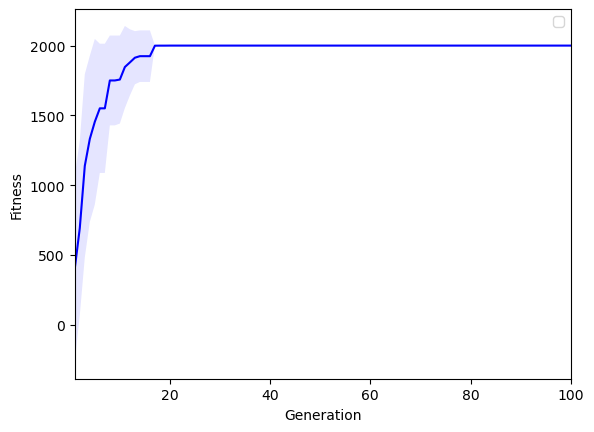

In [17]:
plt.plot(evals, avg, color='b')
plt.fill_between(evals, avg+err, avg-err, facecolor='b', alpha=0.1)
plt.xlabel("Generation")
plt.ylabel("Fitness")
plt.xlim(1, max_iterations)
plt.legend();

In [36]:
d = {'No.':0,'Fitness': best_fitness_top1, 'No.Exp.': exp,'Iteration': best_fitness_iter,'No.Features': len_ft,'Average CTR': ctr_avg,'Features Configuration': best_fitness_features}
df = pd.DataFrame(data=d)
df=df.sort_values(by='Fitness', ascending=False)
df['No.']=np.arange(1,df.shape[0]+1)

In [59]:
df.to_csv('ranking.csv')